In [1]:
import pandas as pd
import numpy as np 
from tqdm.notebook import tqdm 
from sklearn.preprocessing import label_binarize, StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_validate
from sklearn.metrics import accuracy_score, confusion_matrix, ConfusionMatrixDisplay, make_scorer, top_k_accuracy_score
from sklearn.multiclass import OneVsRestClassifier
import matplotlib.pyplot as plt
import seaborn as sns
import shap

In [2]:
df = pd.read_csv("base_features.csv")
df['label'].value_counts()

label
good                   235721
phishing                73345
command_and_control     66490
spam                    46009
malware_hosting         16726
malvertising             3085
scanning_host             231
exploit_kit                82
cc_skimming                12
exploit_source              4
web_attack                  2
Name: count, dtype: int64

In [3]:
labels_with_few_samples = ['web_attack', 'exploit_source']

In [4]:
df = df[~(df['label'].isin(labels_with_few_samples))]
df['label'].value_counts()

label
good                   235721
phishing                73345
command_and_control     66490
spam                    46009
malware_hosting         16726
malvertising             3085
scanning_host             231
exploit_kit                82
cc_skimming                12
Name: count, dtype: int64

In [5]:
df

,url,label,tld_register_price,tld_renew_price,tld_transfer_price,url_length,num_tlds_in_url,url_entropy,number_subdomains,ratio_digits_url,...,num_spaces,num_hyphens,num_@s,num_queries,num_ampersands,num_equals,domain_entropy,domain_length,ratio_digits_domain,tld
0,https://nativecamp.net/zh-tw/login?bseznx=MCLE...,phishing,14.98,15.98,14.98,184.0,1.0,5.768796,1.0,0.081522,...,0.0,1.0,0.0,1.0,0.0,1.0,3.235926,14.0,0.000000,net
1,https://sithole.net/c/host10.9/admin/js/mj.php,phishing,14.98,15.98,14.98,46.0,1.0,4.028542,1.0,0.065217,...,0.0,0.0,0.0,0.0,0.0,0.0,3.095795,11.0,0.000000,net
2,https://sithole.net/wz/host8/admin/js/mj.php,phishing,14.98,15.98,14.98,44.0,1.0,3.959068,1.0,0.022727,...,0.0,0.0,0.0,0.0,0.0,0.0,3.095795,11.0,0.000000,net
3,http://myiphost.com,malware_hosting,13.98,15.88,13.98,19.0,1.0,3.471354,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,3.251629,12.0,0.000000,com
4,http://ahoravideo-cdn.xyz,malware_hosting,12.98,14.98,12.98,25.0,1.0,4.163856,1.0,0.000000,...,0.0,1.0,0.0,0.0,0.0,0.0,3.836592,18.0,0.000000,xyz
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
441702,http://wildorchid.proboards23.com/index.cgi,good,13.98,15.88,13.98,43.0,1.0,4.286275,1.0,0.046512,...,0.0,0.0,0.0,0.0,0.0,0.0,3.456565,15.0,0.133333,com
441703,http://www.gaysouthafrica.org.za/browser99.asp,good,NaN,NaN,NaN,46.0,2.0,4.162058,3.0,0.043478,...,0.0,0.0,0.0,0.0,0.0,0.0,3.630413,21.0,0.000000,org.za
441704,http://www.burnsurvivorsttw.org/stories/jacq.html,good,12.98,14.98,12.98,49.0,1.0,4.214114,2.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,3.421928,20.0,0.000000,org
441705,http://www.sweetnlow.com/recipes.html,good,13.98,15.88,13.98,37.0,1.0,3.827848,1.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,3.238901,13.0,0.000000,com


In [6]:
def column_adjustor(dataset_column):
    codes, uniques = pd.factorize(dataset_column)
    return pd.Series(codes, index=dataset_column.index), uniques.tolist()

In [7]:
_, labels = column_adjustor(df['label'])
{i: label for i, label in enumerate(labels)}

{0: 'phishing',
 1: 'malware_hosting',
 2: 'command_and_control',
 3: 'exploit_kit',
 4: 'scanning_host',
 5: 'malvertising',
 6: 'cc_skimming',
 7: 'spam',
 8: 'good'}

In [8]:
all_accuracy_scores = {}
all_confusion_matrices = {"base_features": [], "cascade_1": [], "cascade_2": [], "cascade_3": [], "all_features": []}
all_shap_values = {"base_features": [], "cascade_1": [], "cascade_2": [], "cascade_3": [], "all_features": []}

## Base Features

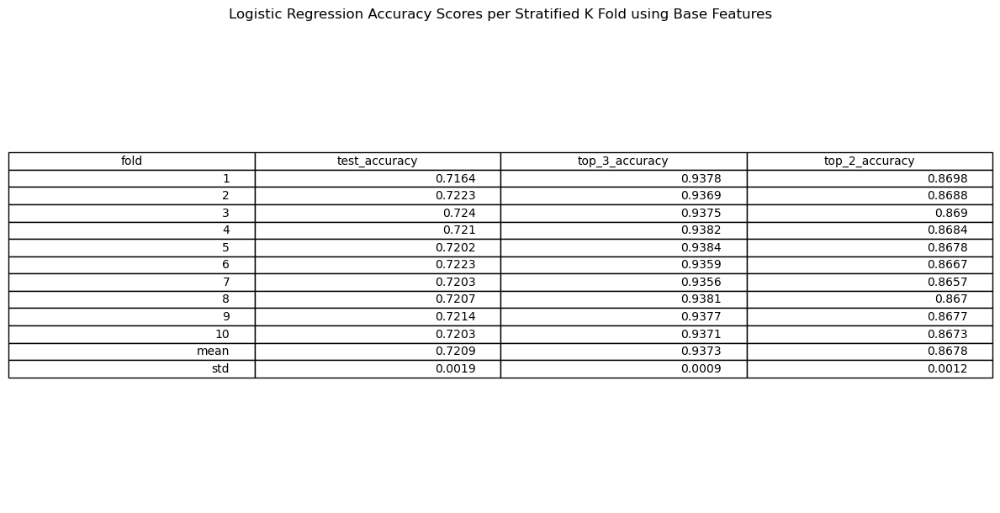

In [9]:
FEATURE_GROUP = "base_features"
INPUT_FILE = f"{FEATURE_GROUP}.csv"
df = pd.read_csv(INPUT_FILE)
df = df[~(df['label'].isin(labels_with_few_samples))].reset_index(drop=True)

for col in df.columns:
    if df[col].dtype == "bool":
        df[col] = df[col].astype(int)
        
df['label'], _ = column_adjustor(df['label'])
y = df['label'].astype(int)
X = df.drop(columns=['url', 'label'])
X['tld'] = X['tld'].astype(str).fillna("unknown")
X = X.fillna(-1)

cols_to_categorize = ['tld']
numeric_cols = [col for col in X.columns if col not in cols_to_categorize]
preprocessor = ColumnTransformer(
    transformers = [
        ("numeric", StandardScaler(), numeric_cols),
        ("categorical", OneHotEncoder(drop="first"), cols_to_categorize)
    ]
)

X = preprocessor.fit_transform(X)
numeric_features = preprocessor.transformers_[0][1].get_feature_names_out(numeric_cols).tolist()
categorical_features = preprocessor.transformers_[1][1].get_feature_names_out(cols_to_categorize).tolist()
features = numeric_features + categorical_features

n_splits = 10
skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)
lr = LogisticRegression(max_iter=1000, random_state=42, n_jobs=-1, multi_class="ovr")

scoring_metrics = {'test_accuracy': [], 'top_3_accuracy': [], 'top_2_accuracy': []}
X_tests = []
for fold, (train_index, test_index) in enumerate(skf.split(X, y)):
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = y[train_index], y[test_index]

    lr.fit(X_train, y_train)

    y_pred = lr.predict(X_test)
    scoring_metrics['test_accuracy'].append(accuracy_score(y_test, y_pred))
    all_confusion_matrices[FEATURE_GROUP].append(confusion_matrix(y_test, y_pred))

    y_pred_proba = lr.predict_proba(X_test)
    scoring_metrics['top_3_accuracy'].append(top_k_accuracy_score(y_test, y_pred_proba, k=3))
    scoring_metrics['top_2_accuracy'].append(top_k_accuracy_score(y_test, y_pred_proba, k=2))

    X_tests.append(X_test)

scores_df = pd.DataFrame(scoring_metrics)

mean = scores_df.mean()
scores_df.loc['mean'] = mean
std = scores_df.std()
scores_df.loc['std'] = std
scores_df['fold'] = [str(i + 1) for i in range(n_splits)] + ["mean", "std"]

scores = scores_df[['fold', 'test_accuracy', 'top_3_accuracy', 'top_2_accuracy']].round(4)
fig, ax = plt.subplots(figsize=(12, 6))
ax.axis("off")
ax.axis("tight")
table = ax.table(cellText = scores.values, colLabels = scores.columns, loc="center")
plt.tight_layout()
plt.title("Logistic Regression Accuracy Scores per Stratified K Fold using Base Features")
plt.show()
plt.close(fig)

all_accuracy_scores[FEATURE_GROUP] = scores

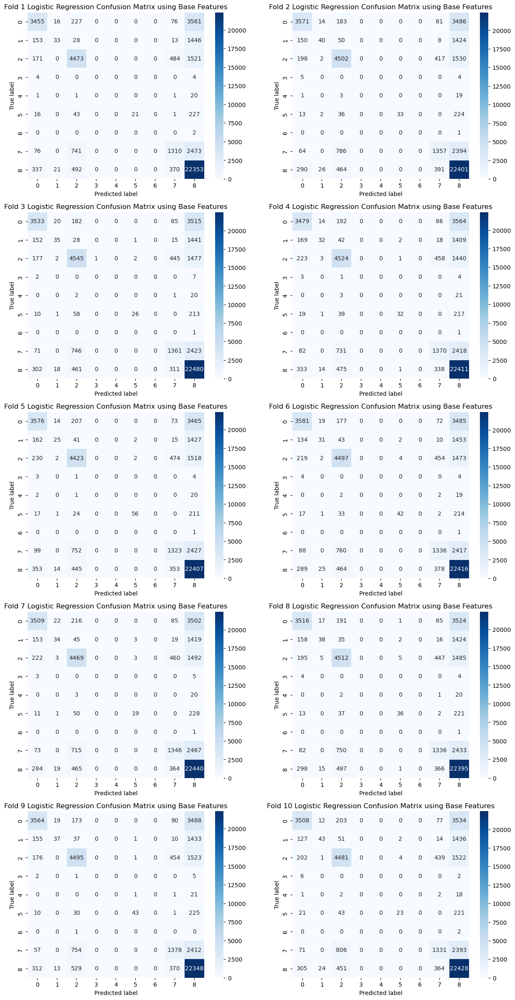

In [10]:
confusion_matrices = all_confusion_matrices[FEATURE_GROUP]
fig, axes = plt.subplots(nrows=len(confusion_matrices) // 2, ncols = 2, figsize = (15, len(confusion_matrices) * 3))

axes = axes.flatten()

for i, cm in enumerate(confusion_matrices):
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=axes[i])
    axes[i].set_title(f"Fold {str(i + 1)} Logistic Regression Confusion Matrix using Base Features")
    axes[i].set_xlabel("Predicted label")
    axes[i].set_ylabel("True label")

plt.tight_layout
plt.show()
plt.close(fig)

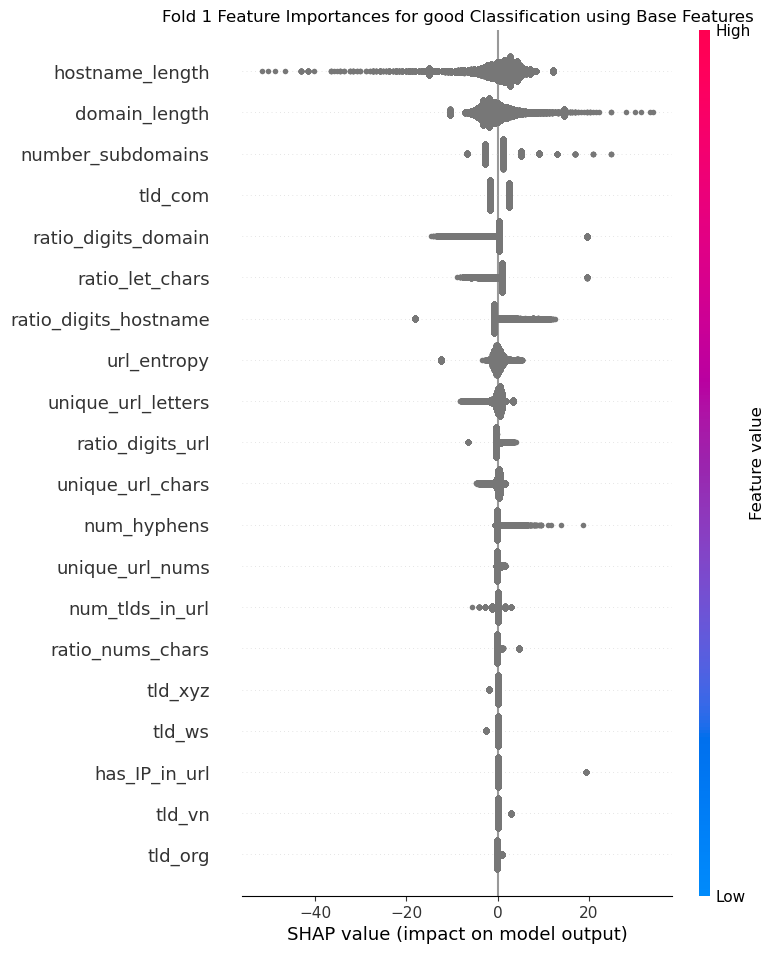

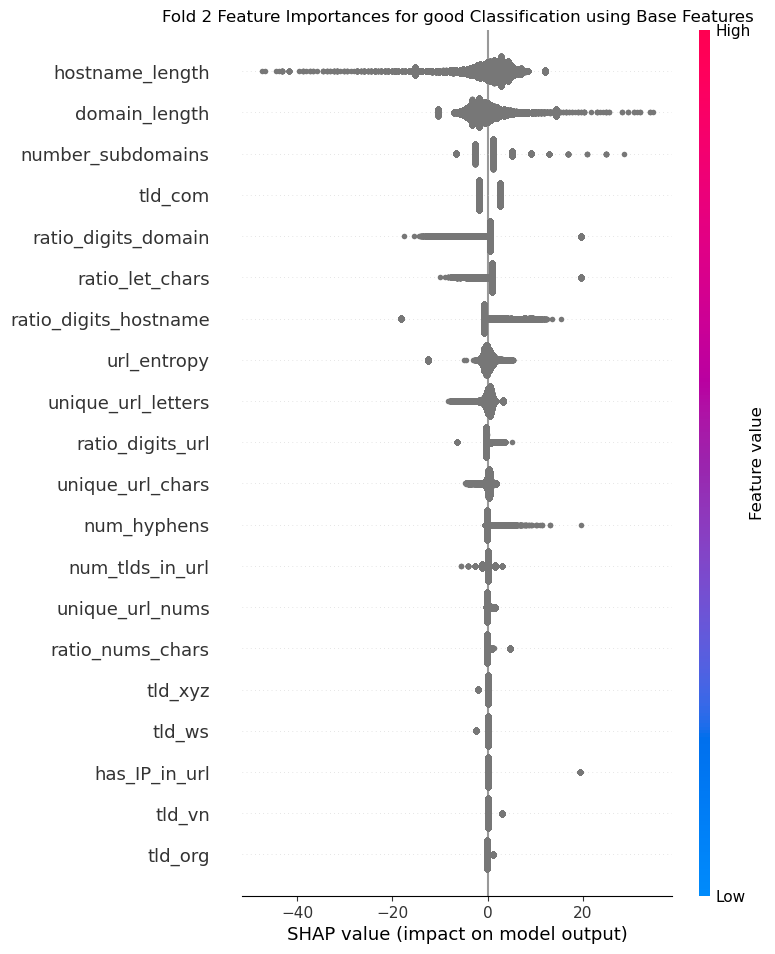

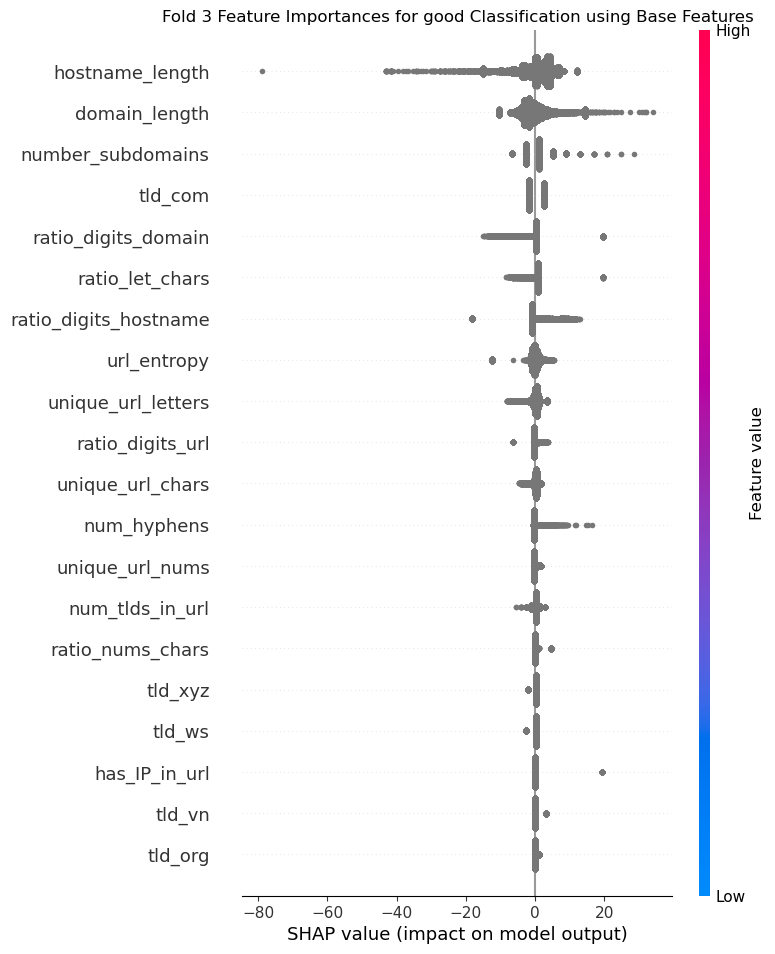

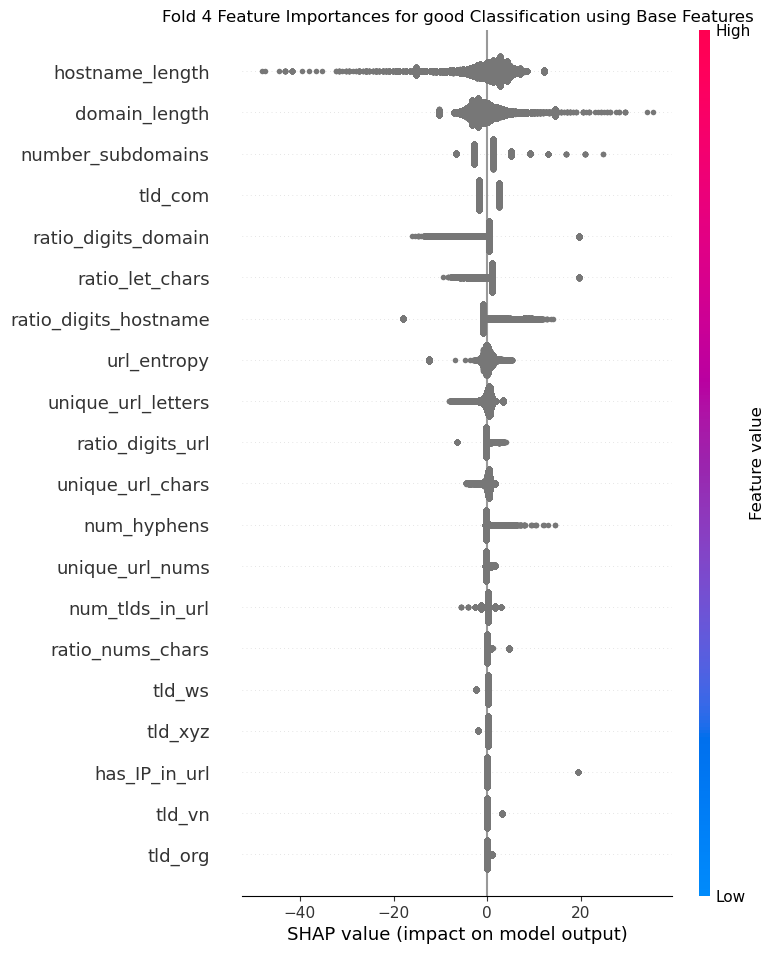

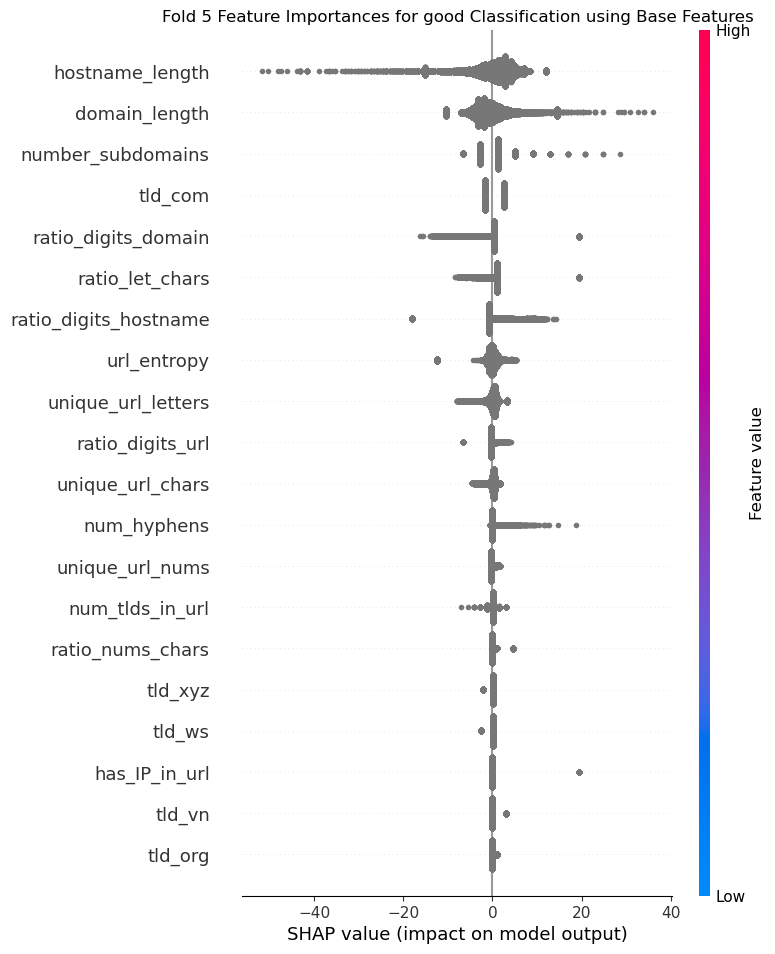

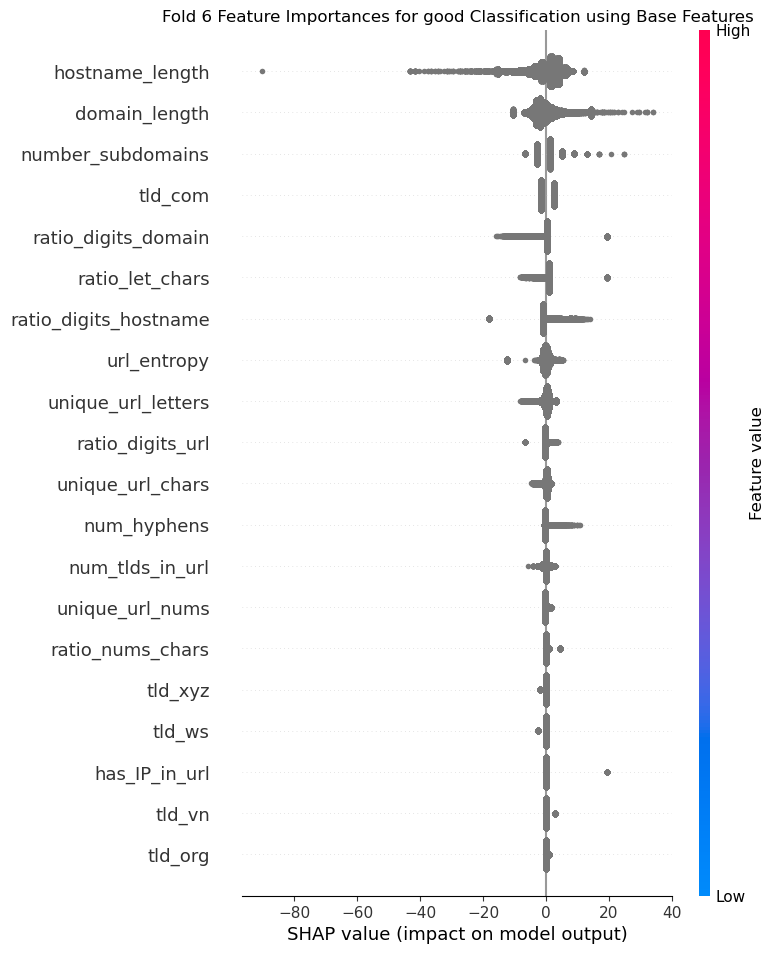

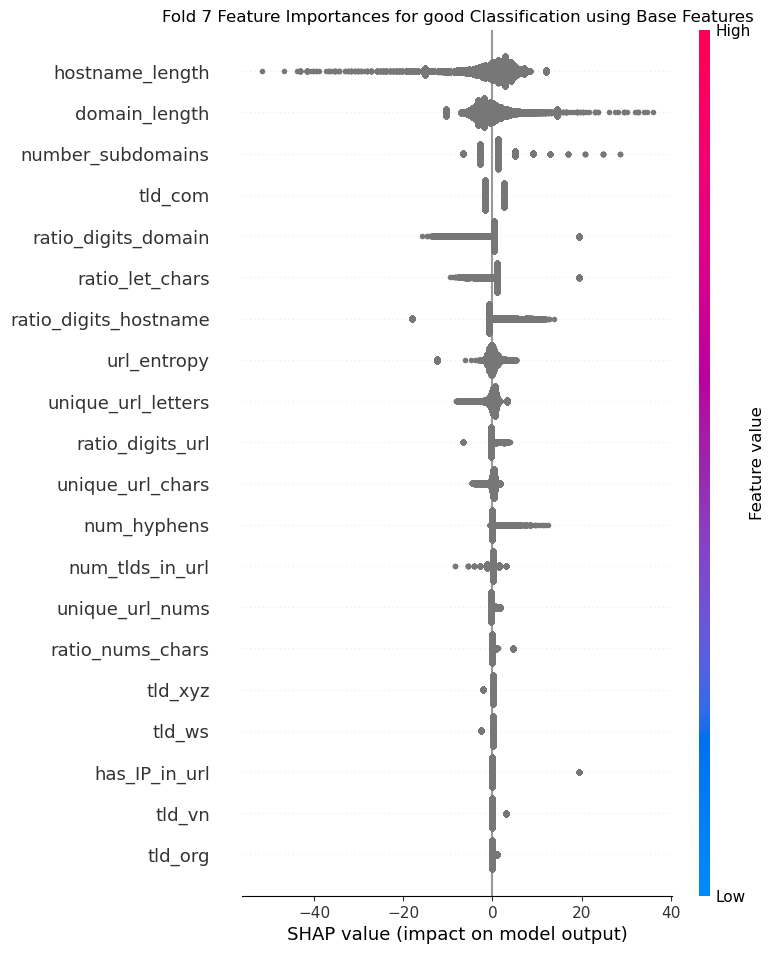

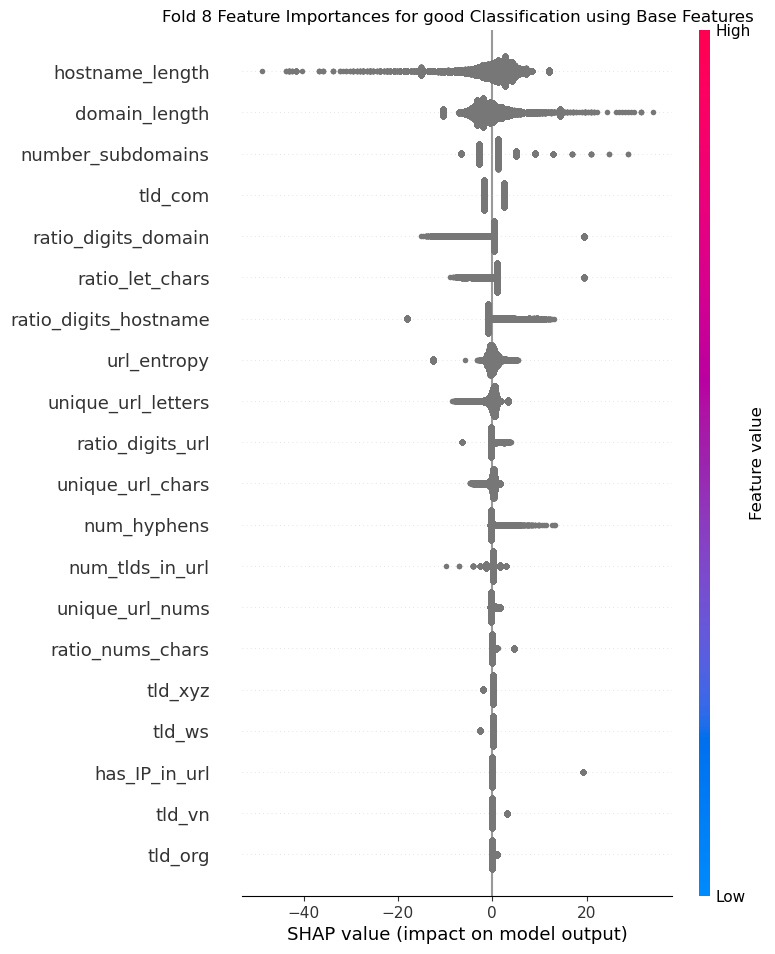

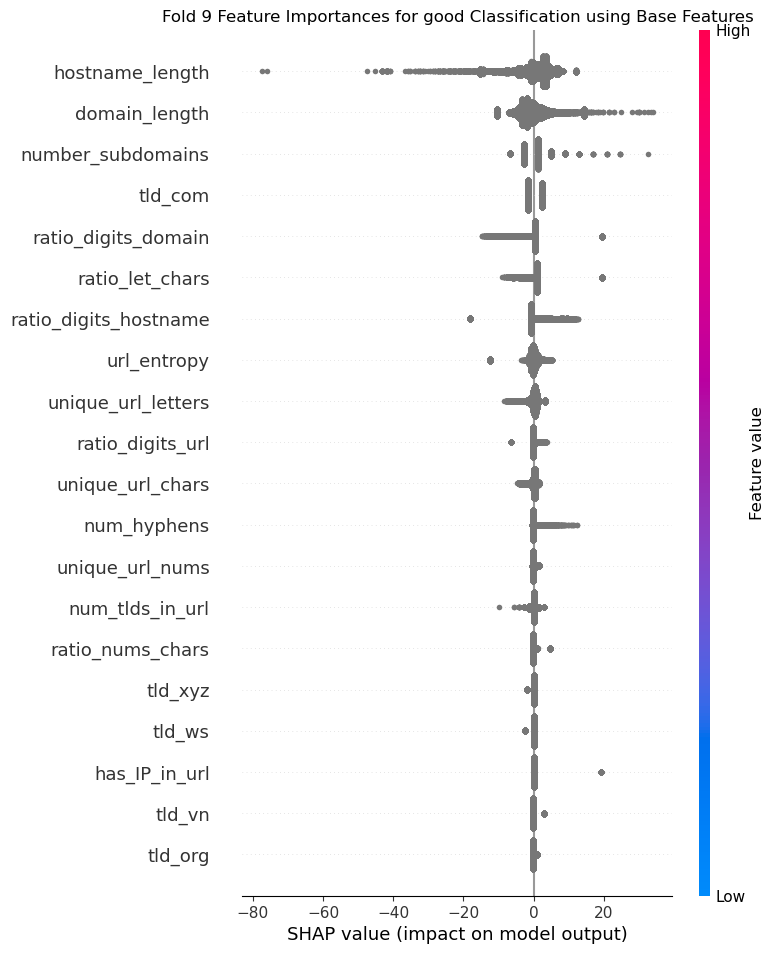

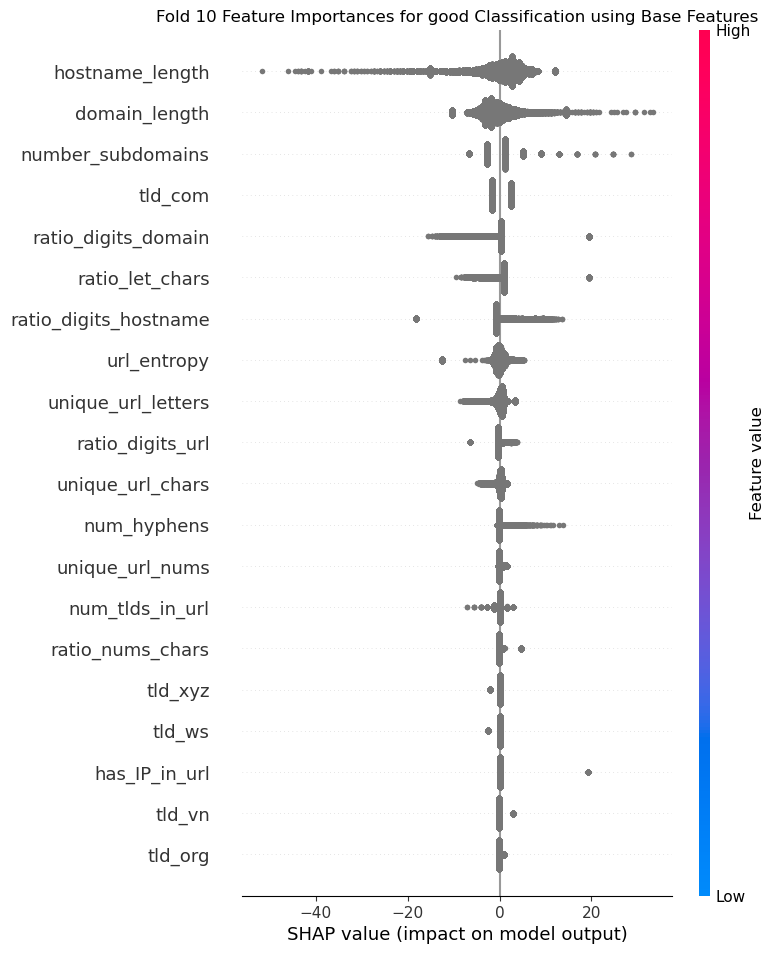

In [11]:
for i, X_test in enumerate(X_tests):
    explainer = shap.Explainer(lr, X_train, feature_names=features)
    shap_values = explainer.shap_values(X_test)
    shap.summary_plot(shap_values[:,:,-1], X_test, feature_names=features, max_display=20, show=False)
    plt.title(f"Fold {str(i + 1)} Feature Importances for good Classification using Base Features")
    plt.show()
    
    all_shap_values[FEATURE_GROUP].append((i + 1, shap_values, X_test))

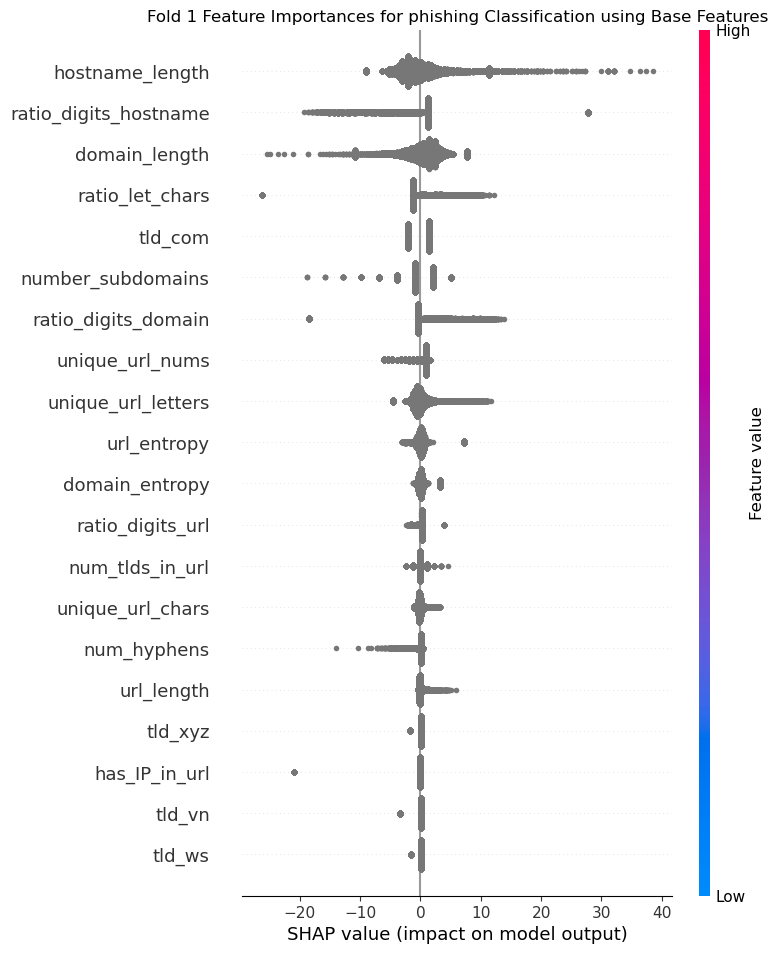

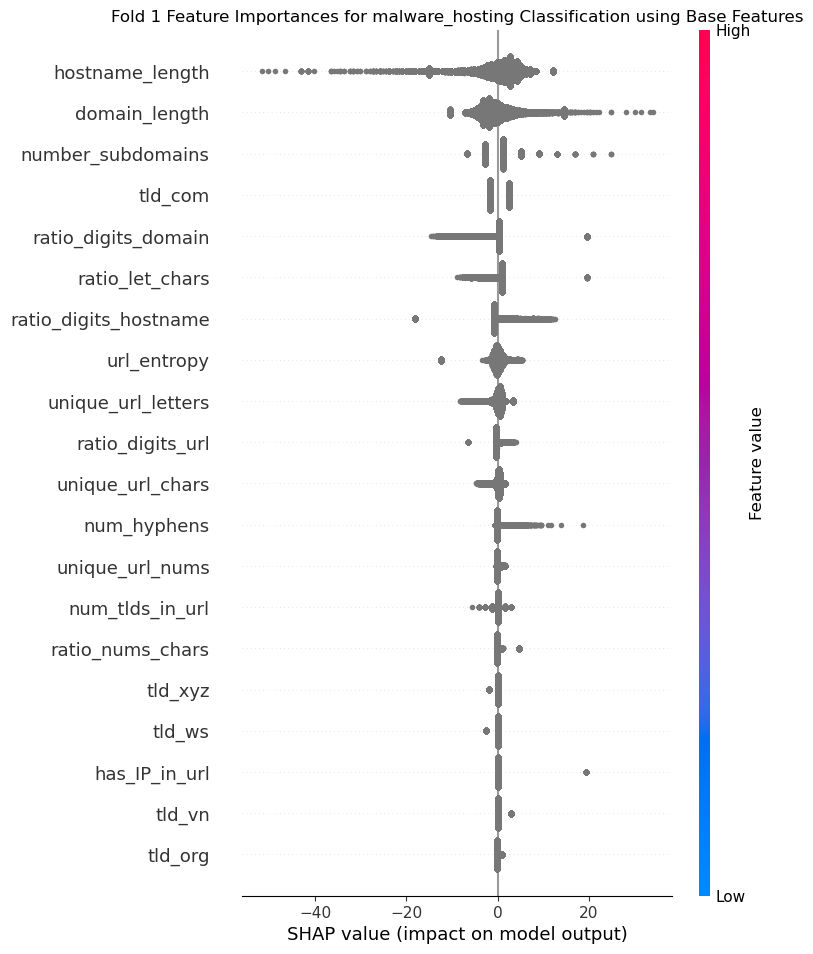

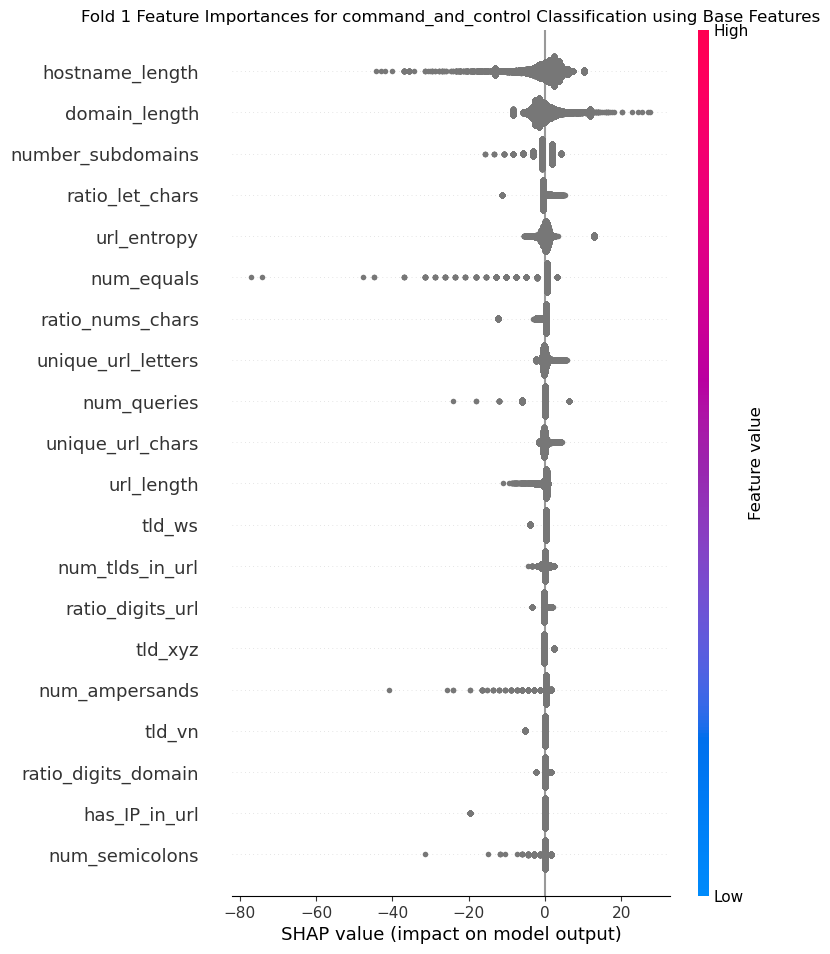

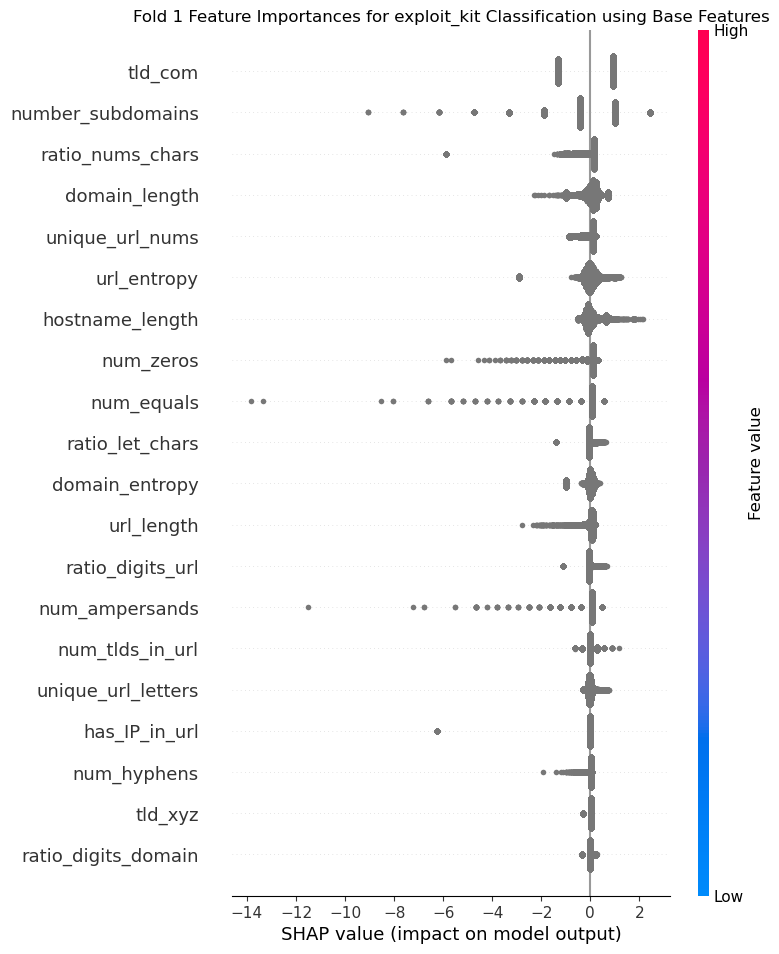

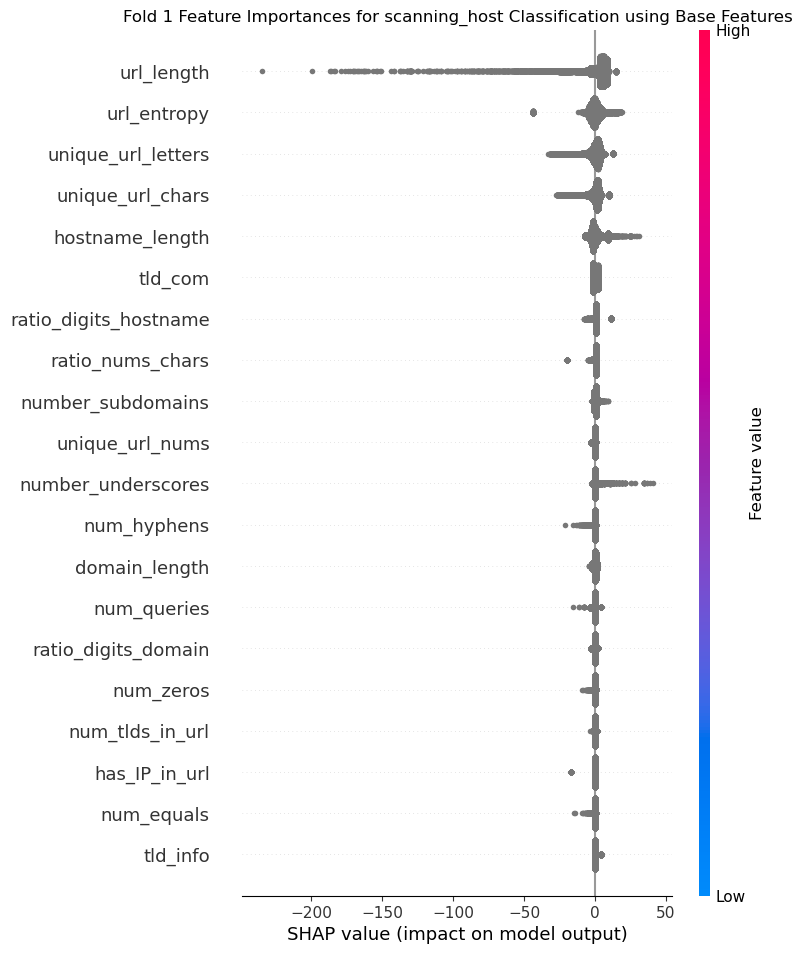

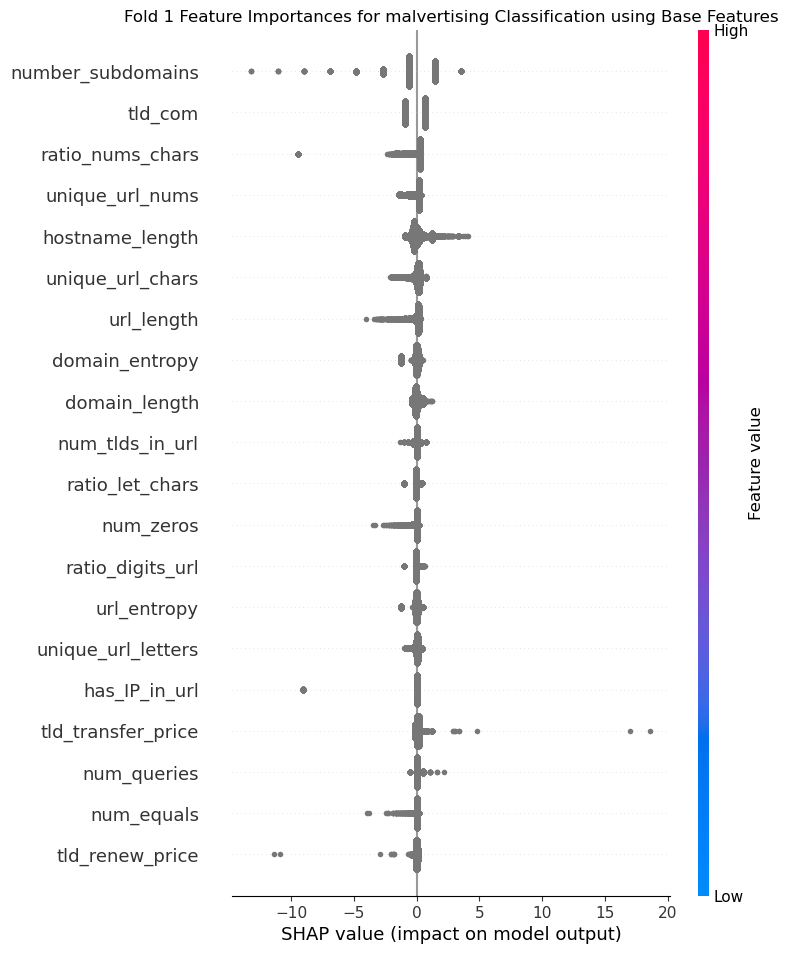

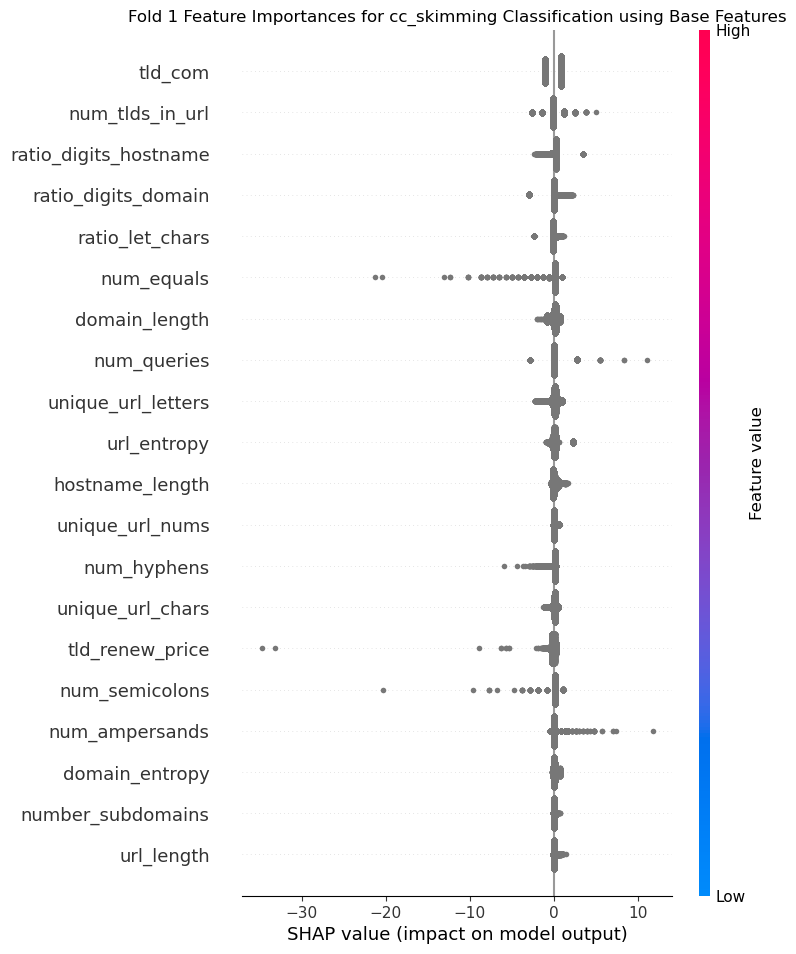

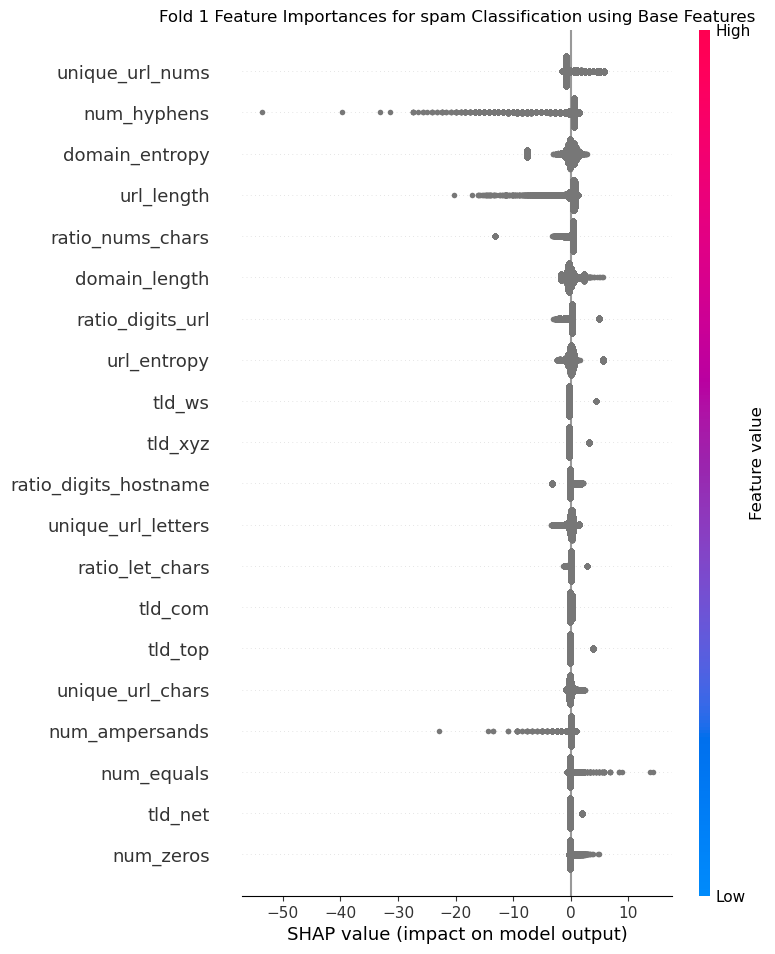

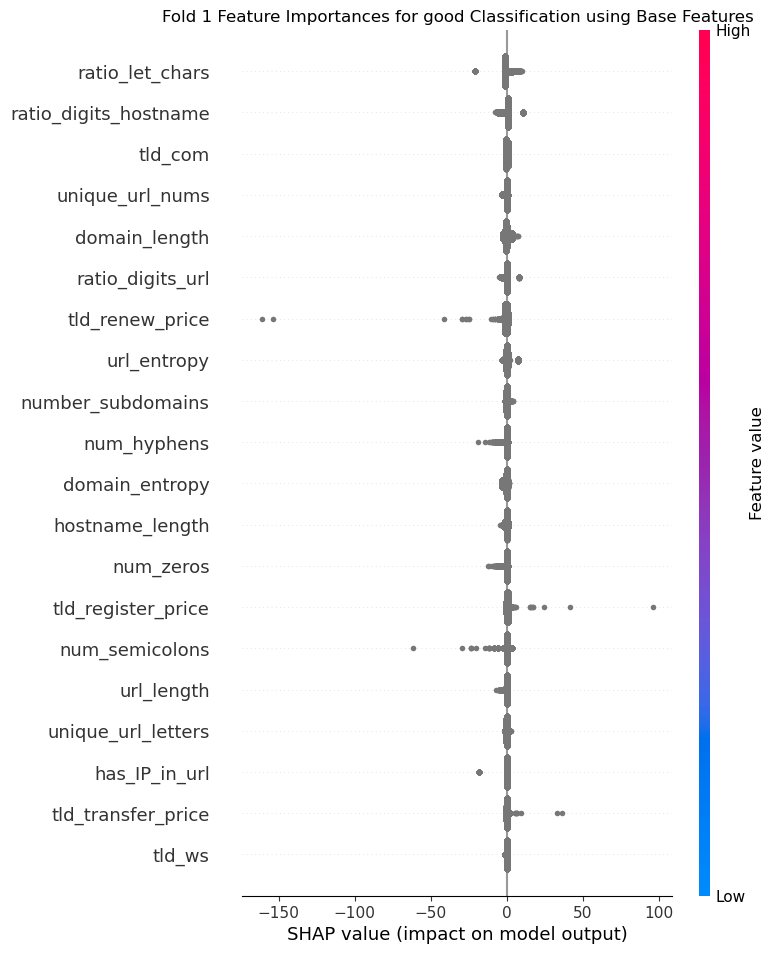

In [12]:
fold, shap_values, X_test = all_shap_values[FEATURE_GROUP][0]
for i, label in enumerate(labels):
    shap.summary_plot(shap_values[:,:,-i], X_test, feature_names=features, max_display=20, show=False)
    plt.title(f"Fold 1 Feature Importances for {label} Classification using Base Features")
    plt.show()

## Cascade 1

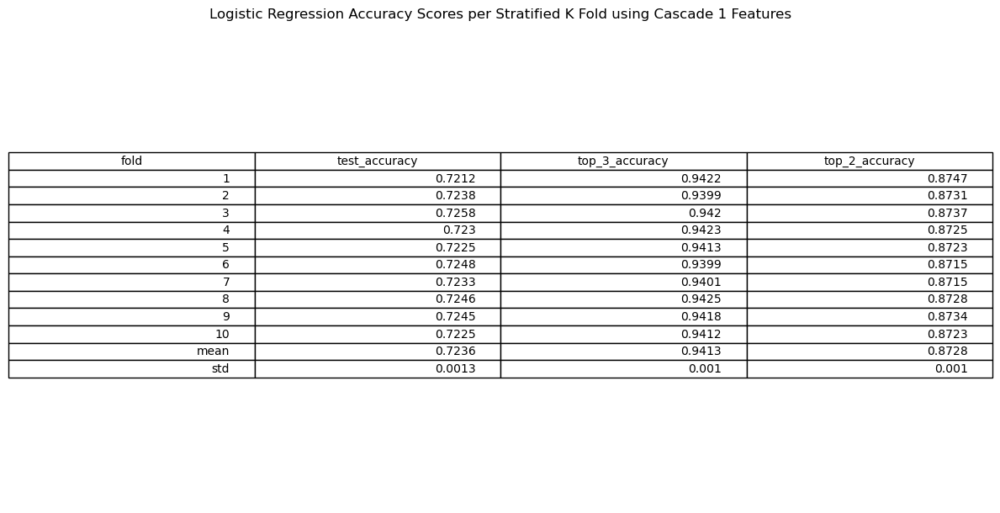

In [13]:
FEATURE_GROUP = "cascade_1"
INPUT_FILE = f"{FEATURE_GROUP}.csv"
df = pd.read_csv(INPUT_FILE)
df = df[~(df['label'].isin(labels_with_few_samples))].reset_index(drop=True)

for col in df.columns:
    if df[col].dtype == "bool":
        df[col] = df[col].astype(int)
        
df['label'], _ = column_adjustor(df['label'])
y = df['label'].astype(int)
X = df.drop(columns=['url', 'label'])
X['tld'] = X['tld'].astype(str).fillna("unknown")
X = X.fillna(-1)

cols_to_categorize = ['tld']
numeric_cols = [col for col in X.columns if col not in cols_to_categorize]
preprocessor = ColumnTransformer(
    transformers = [
        ("numeric", StandardScaler(), numeric_cols),
        ("categorical", OneHotEncoder(drop="first"), cols_to_categorize)
    ]
)

X = preprocessor.fit_transform(X)
numeric_features = preprocessor.transformers_[0][1].get_feature_names_out(numeric_cols).tolist()
categorical_features = preprocessor.transformers_[1][1].get_feature_names_out(cols_to_categorize).tolist()
features = numeric_features + categorical_features

n_splits = 10
skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)
lr = LogisticRegression(max_iter=1000, random_state=42, n_jobs=-1, multi_class="ovr")

scoring_metrics = {'test_accuracy': [], 'top_3_accuracy': [], 'top_2_accuracy': []}
X_tests = []
for fold, (train_index, test_index) in enumerate(skf.split(X, y)):
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = y[train_index], y[test_index]

    lr.fit(X_train, y_train)

    y_pred = lr.predict(X_test)
    scoring_metrics['test_accuracy'].append(accuracy_score(y_test, y_pred))
    all_confusion_matrices[FEATURE_GROUP].append(confusion_matrix(y_test, y_pred))

    y_pred_proba = lr.predict_proba(X_test)
    scoring_metrics['top_3_accuracy'].append(top_k_accuracy_score(y_test, y_pred_proba, k=3))
    scoring_metrics['top_2_accuracy'].append(top_k_accuracy_score(y_test, y_pred_proba, k=2))

    X_tests.append(X_test)

scores_df = pd.DataFrame(scoring_metrics)

mean = scores_df.mean()
scores_df.loc['mean'] = mean
std = scores_df.std()
scores_df.loc['std'] = std
scores_df['fold'] = [str(i + 1) for i in range(n_splits)] + ["mean", "std"]

scores = scores_df[['fold', 'test_accuracy', 'top_3_accuracy', 'top_2_accuracy']].round(4)
fig, ax = plt.subplots(figsize=(12, 6))
ax.axis("off")
ax.axis("tight")
table = ax.table(cellText = scores.values, colLabels = scores.columns, loc="center")
plt.tight_layout()
plt.title("Logistic Regression Accuracy Scores per Stratified K Fold using Cascade 1 Features")
plt.show()
plt.close(fig)

all_accuracy_scores[FEATURE_GROUP] = scores

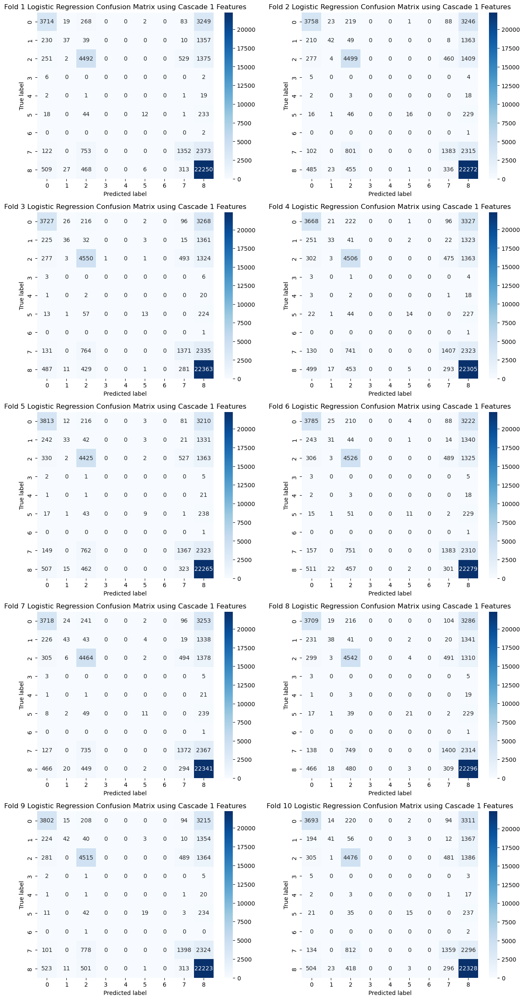

In [14]:
confusion_matrices = all_confusion_matrices[FEATURE_GROUP]
fig, axes = plt.subplots(nrows=len(confusion_matrices) // 2, ncols = 2, figsize = (15, len(confusion_matrices) * 3))

axes = axes.flatten()

for i, cm in enumerate(confusion_matrices):
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=axes[i])
    axes[i].set_title(f"Fold {str(i + 1)} Logistic Regression Confusion Matrix using Cascade 1 Features")
    axes[i].set_xlabel("Predicted label")
    axes[i].set_ylabel("True label")

plt.tight_layout
plt.show()
plt.close(fig)

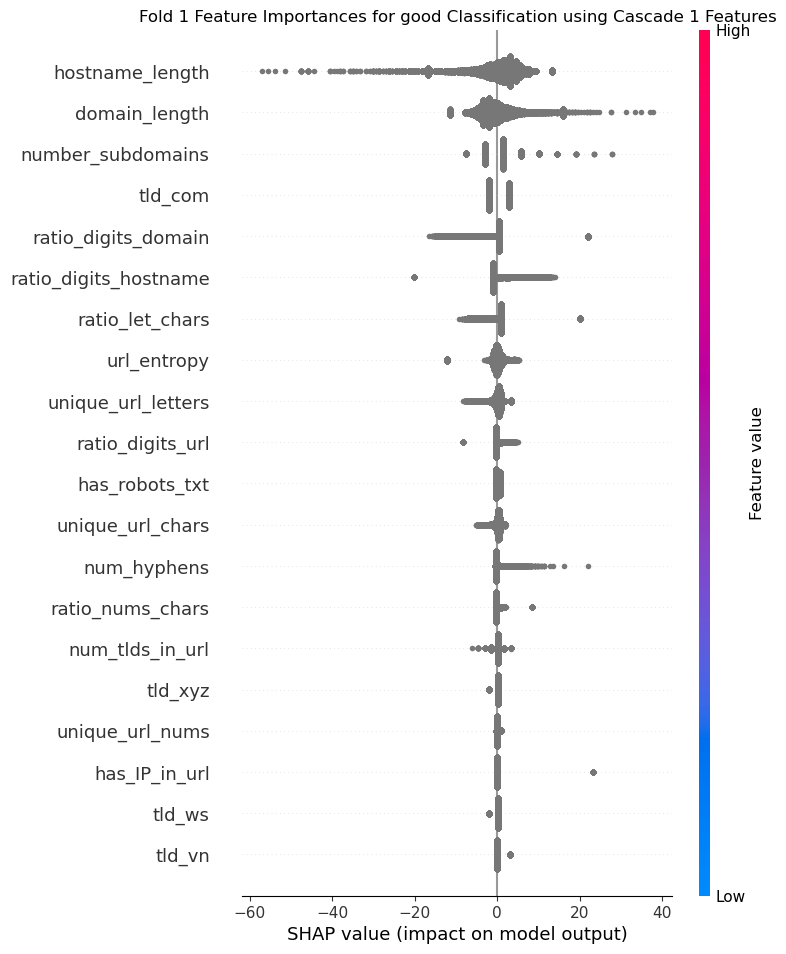

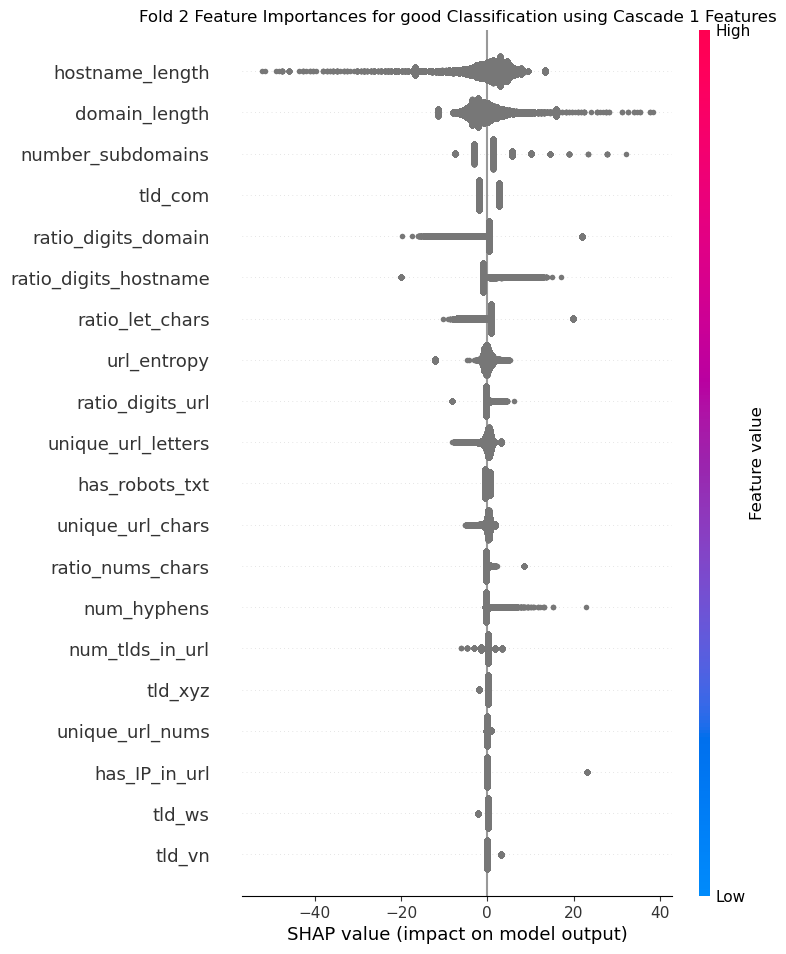

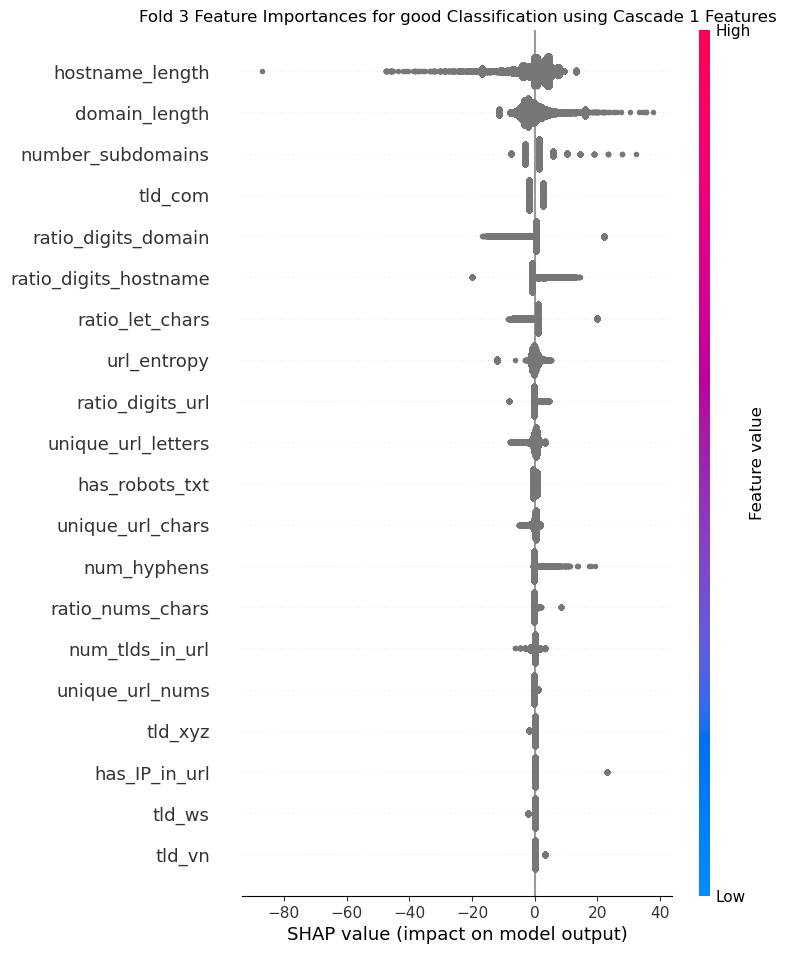

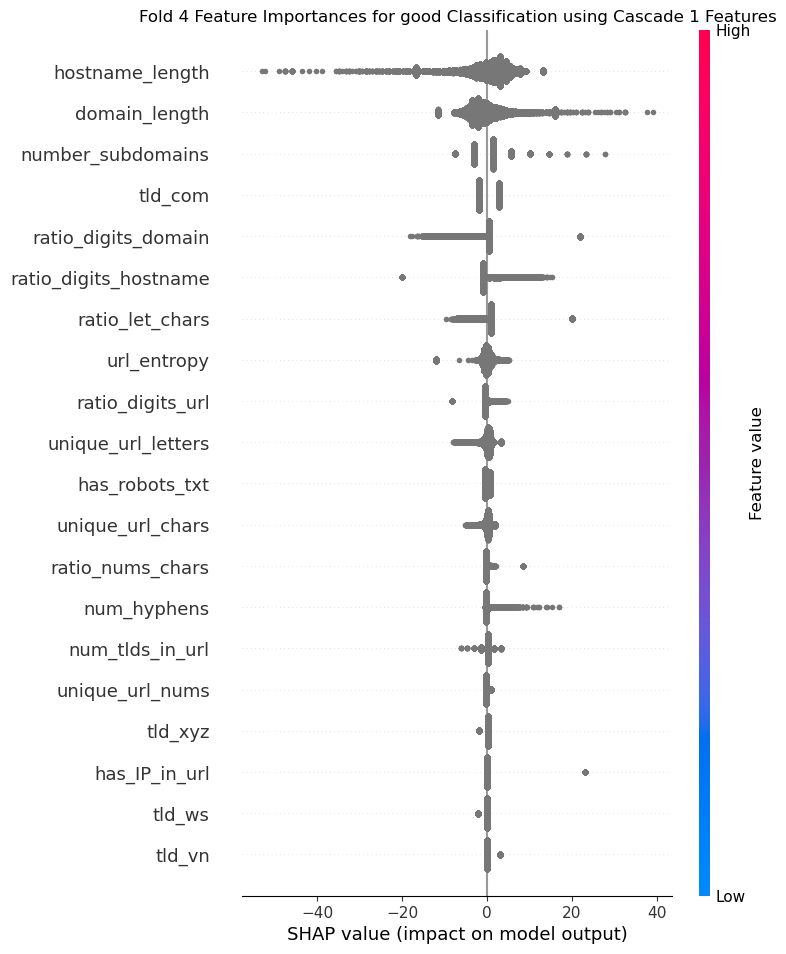

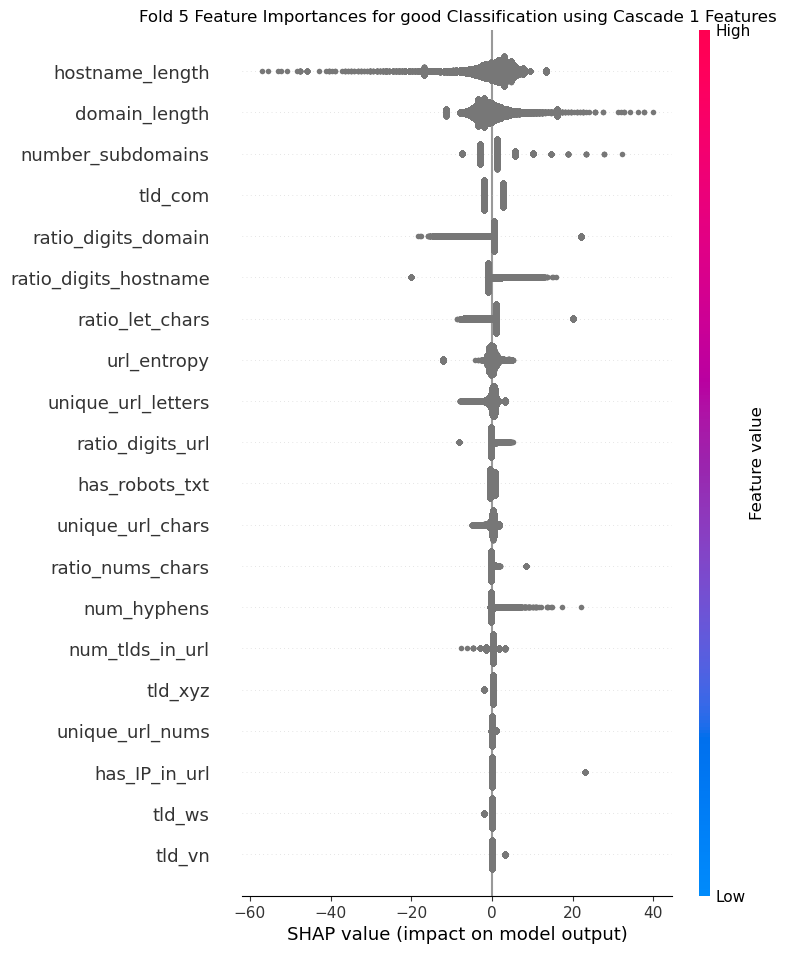

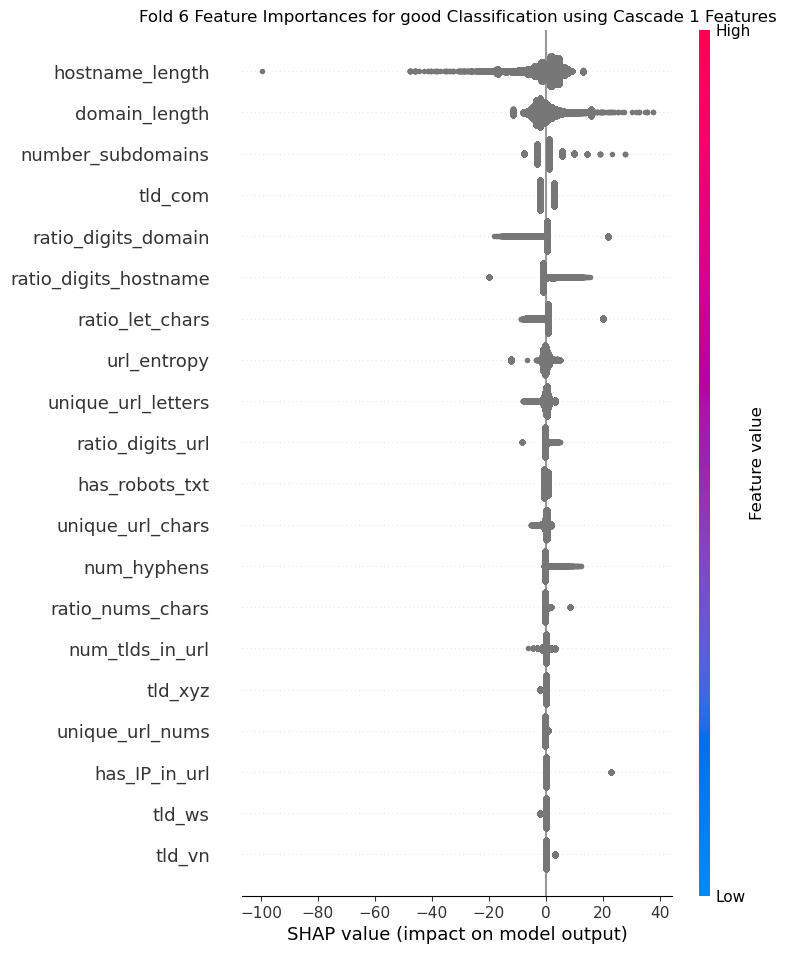

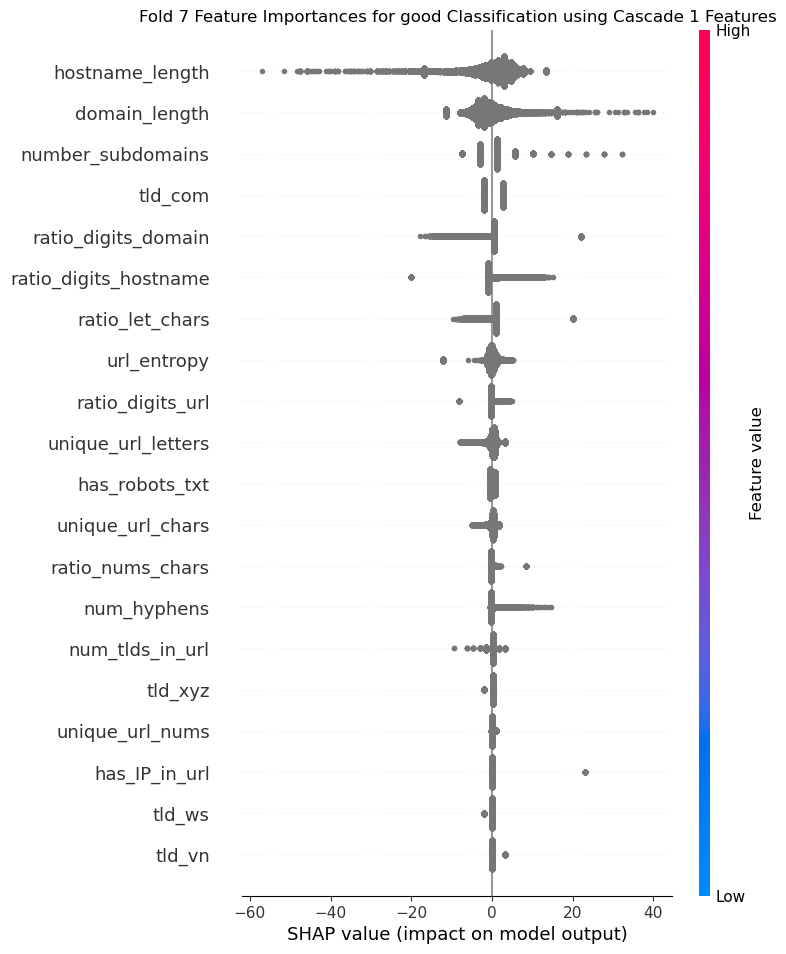

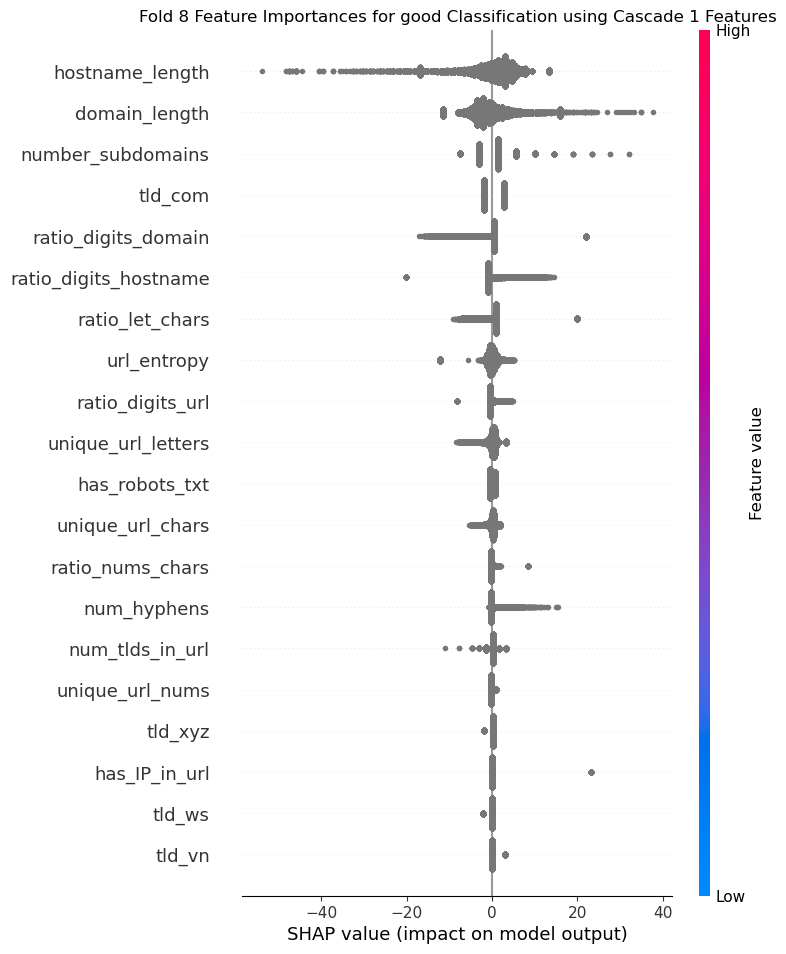

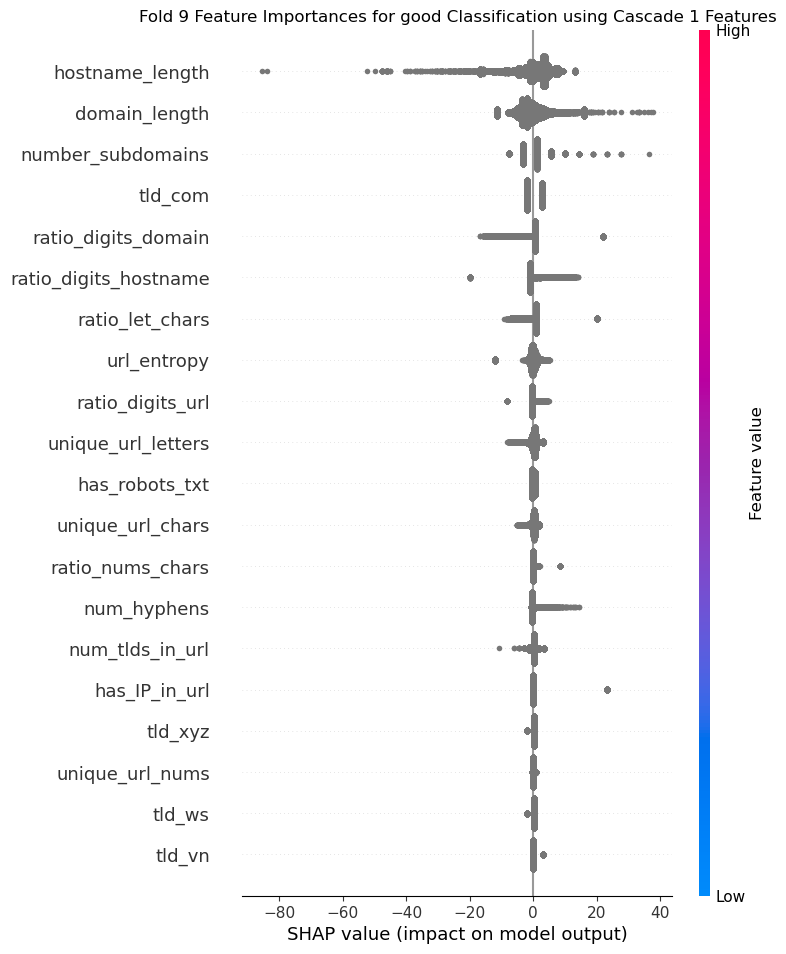

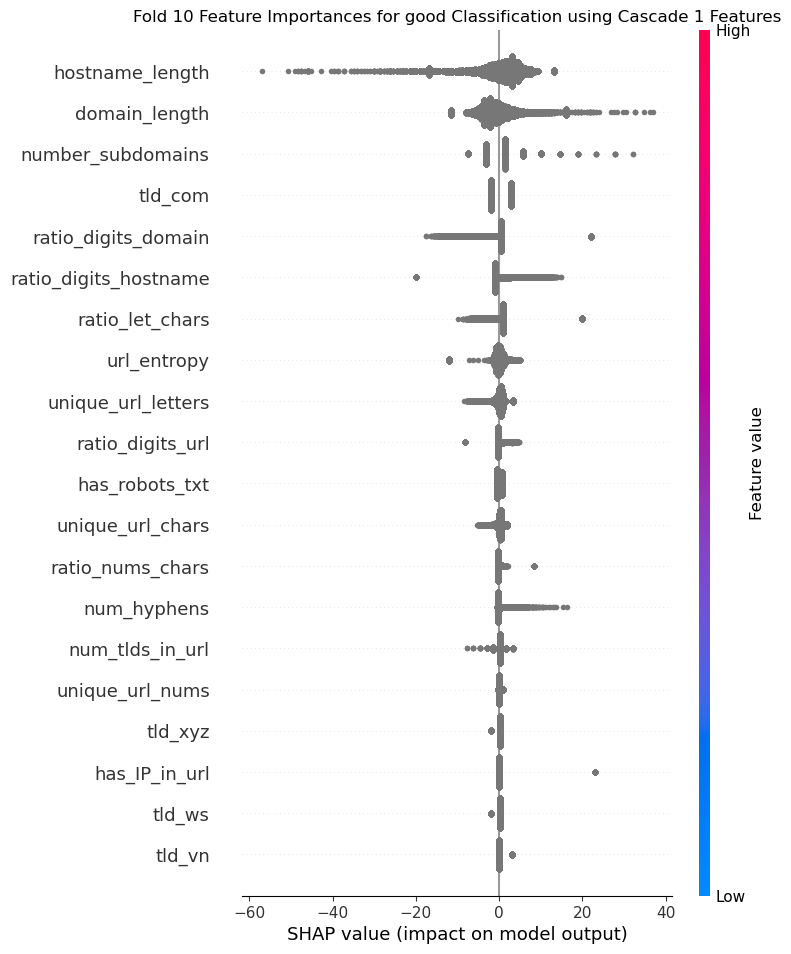

In [15]:
for i, X_test in enumerate(X_tests):
    explainer = shap.Explainer(lr, X_train, feature_names=features)
    shap_values = explainer.shap_values(X_test)
    shap.summary_plot(shap_values[:,:,-1], X_test, feature_names=features, max_display=20, show=False)
    plt.title(f"Fold {str(i + 1)} Feature Importances for good Classification using Cascade 1 Features")
    plt.show()
    
    all_shap_values[FEATURE_GROUP].append((i + 1, shap_values, X_test))

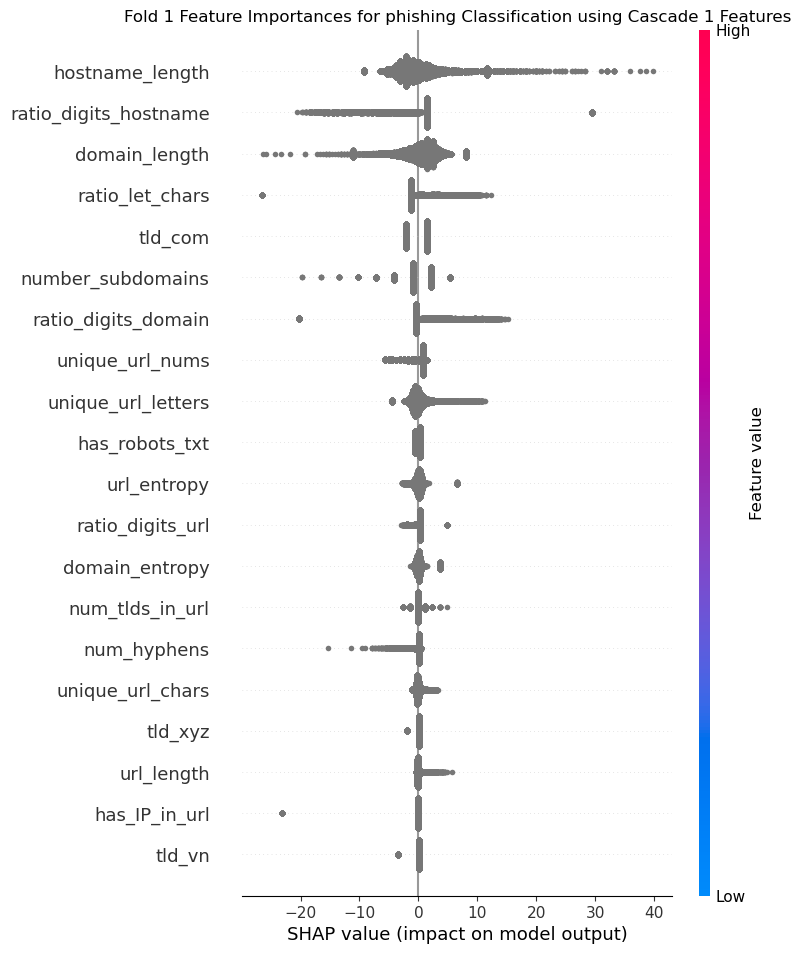

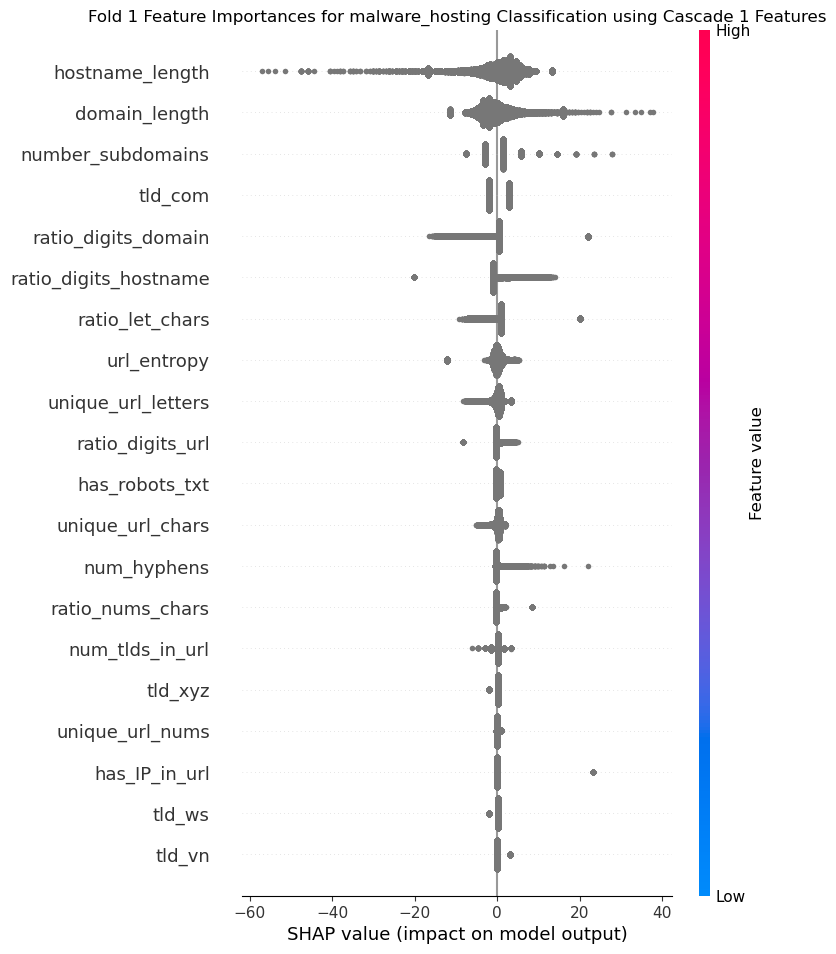

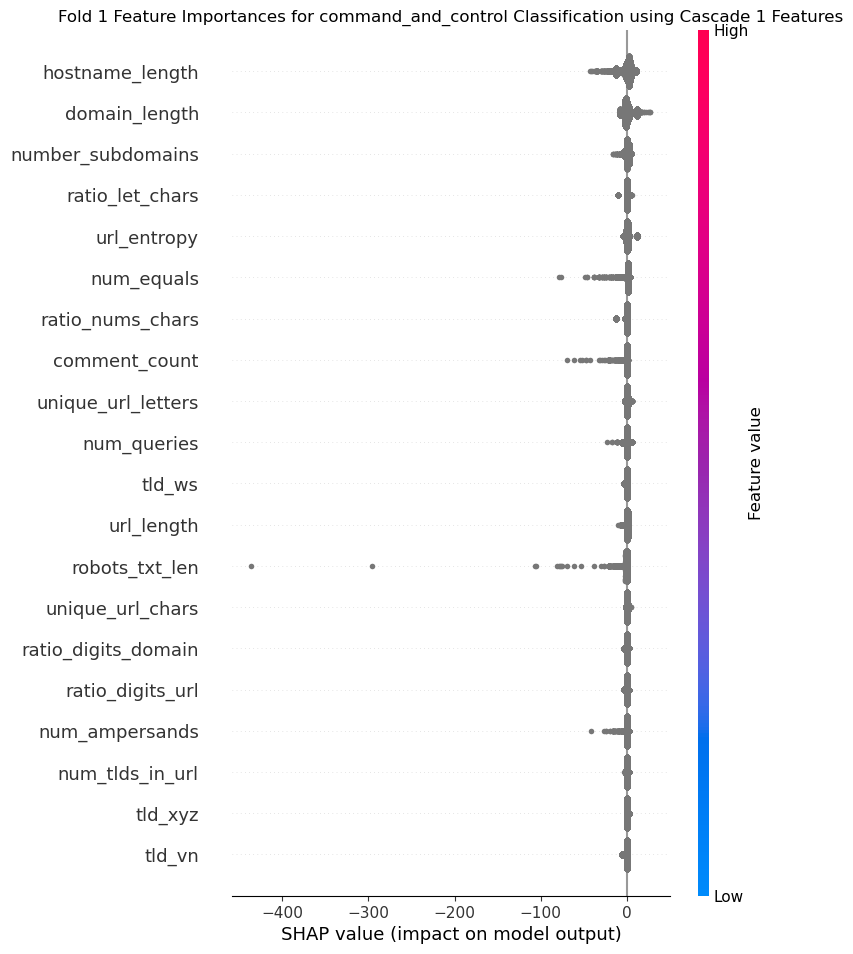

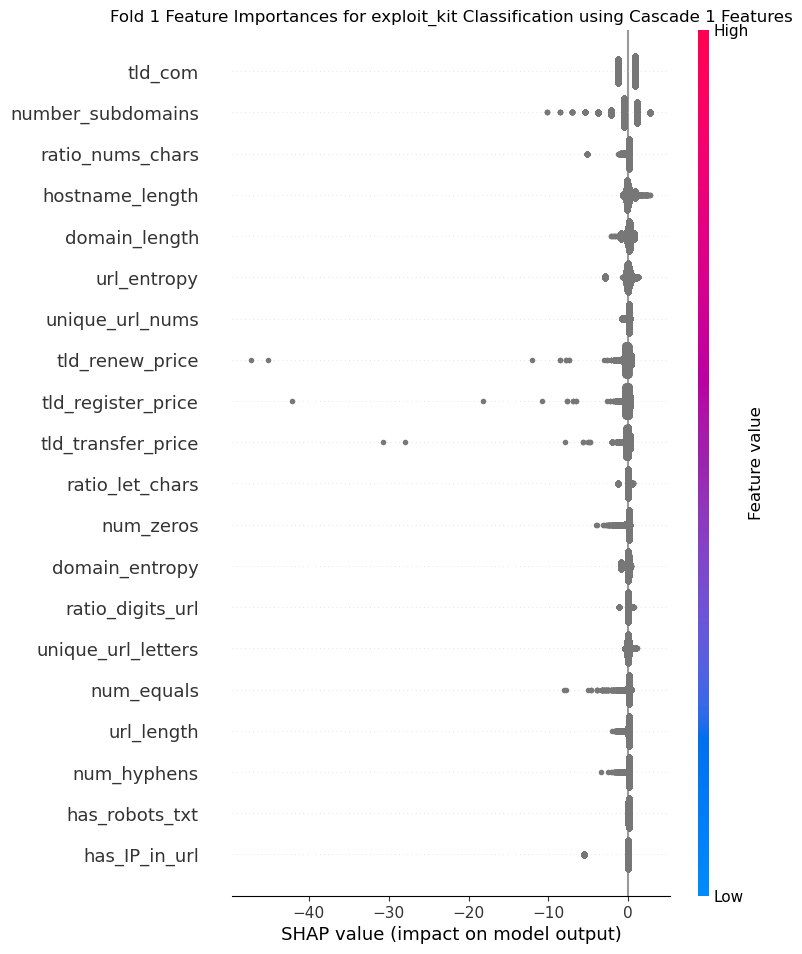

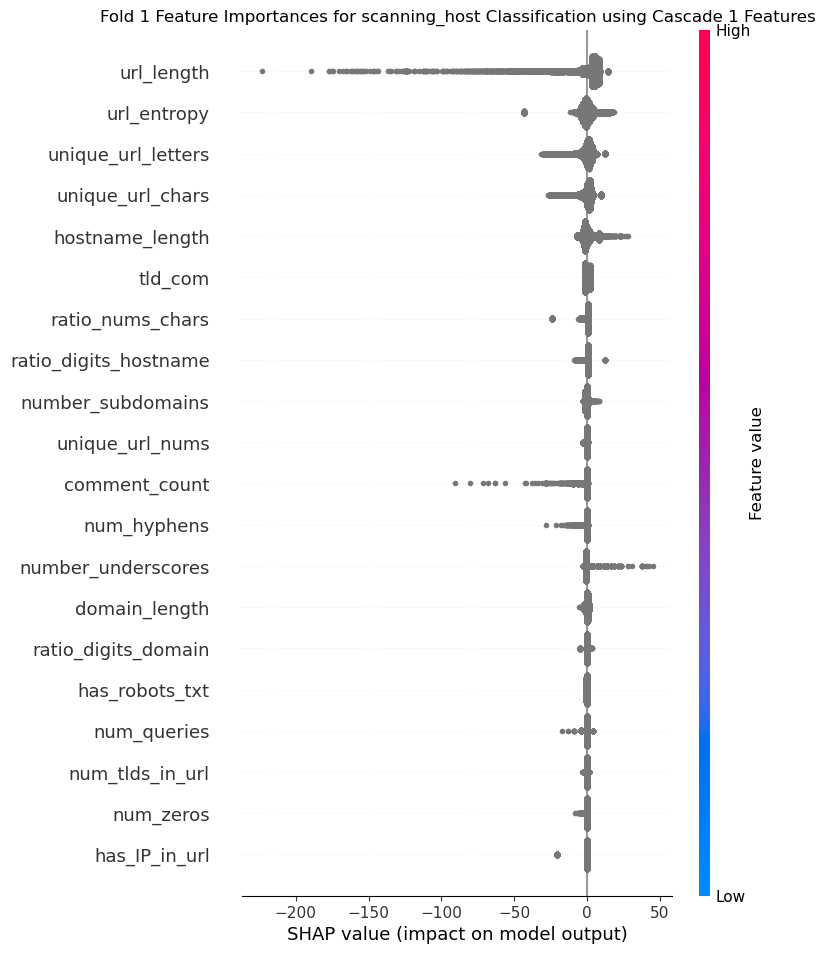

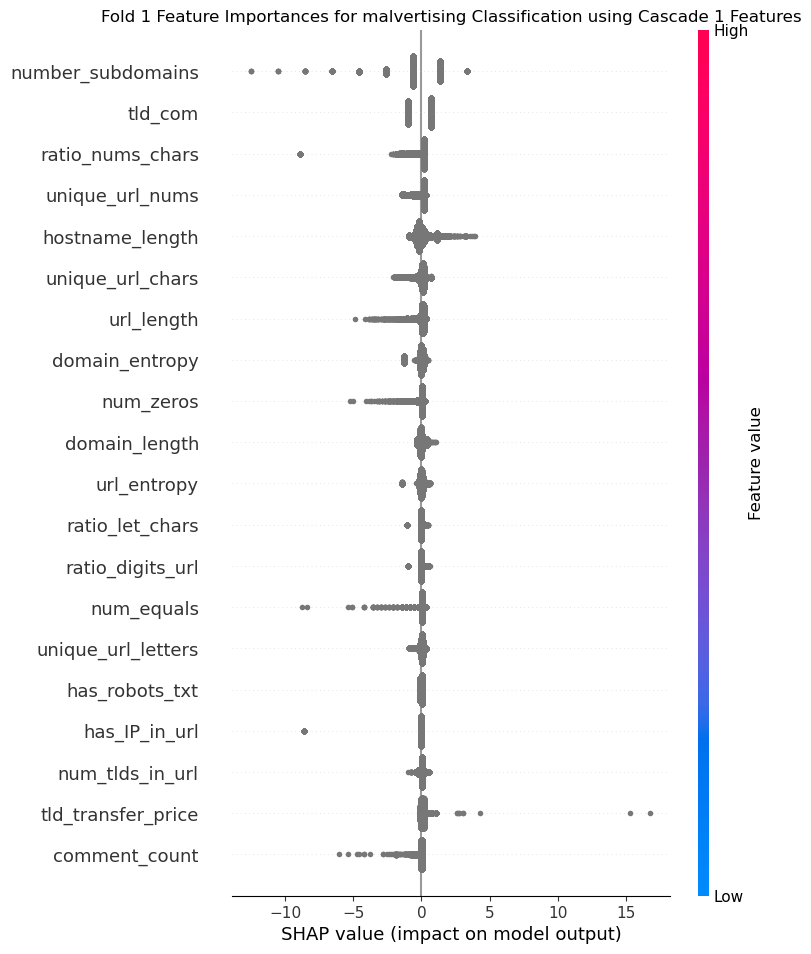

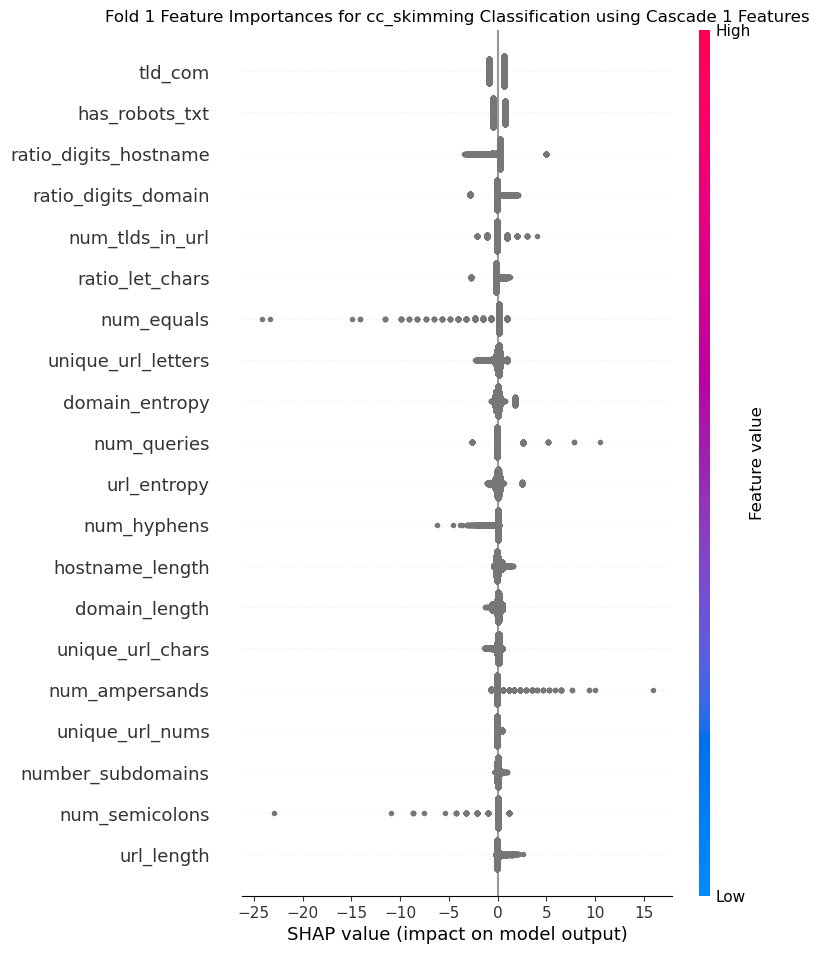

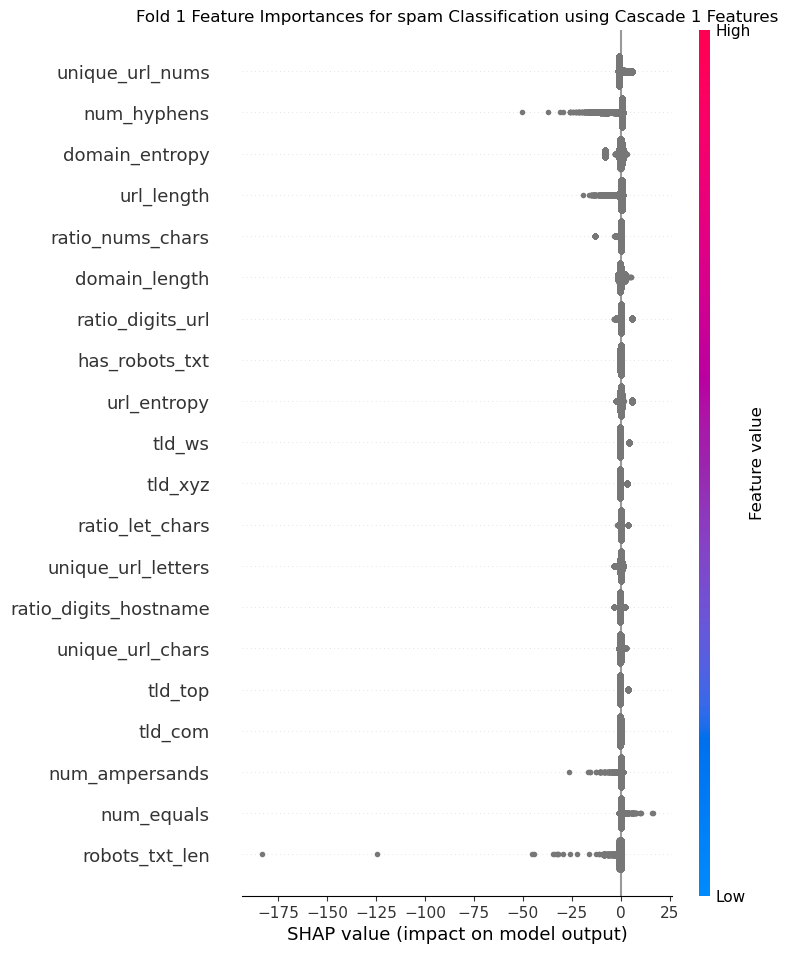

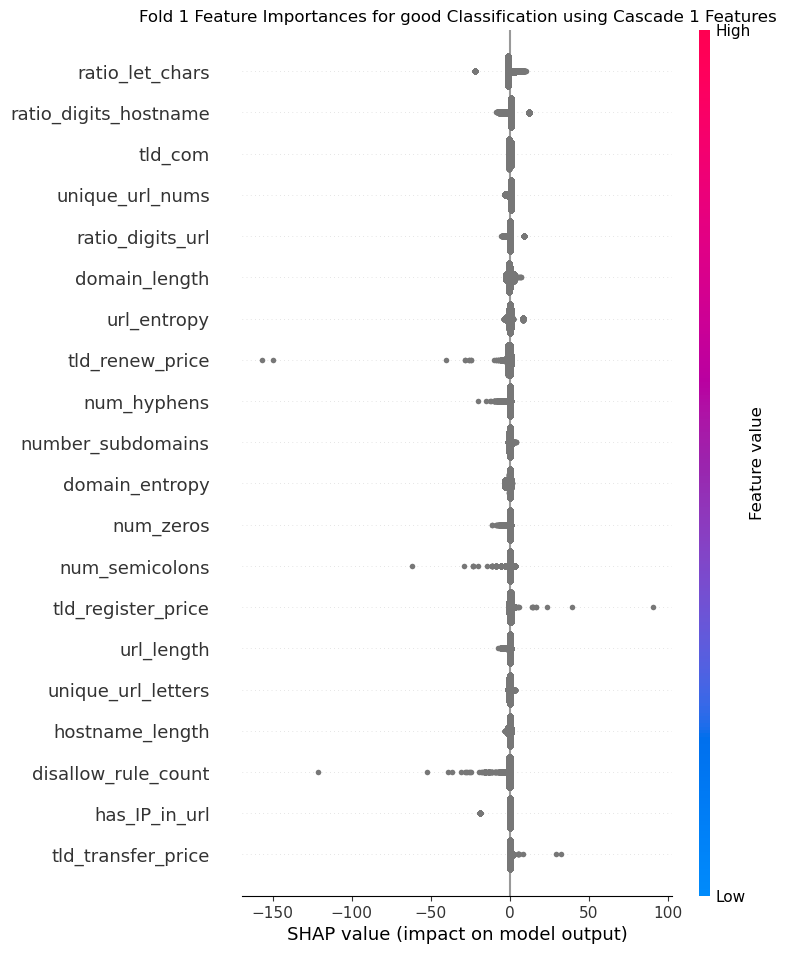

In [16]:
fold, shap_values, X_test = all_shap_values[FEATURE_GROUP][0]
for i, label in enumerate(labels):
    shap.summary_plot(shap_values[:,:,-i], X_test, feature_names=features, max_display=20, show=False)
    plt.title(f"Fold 1 Feature Importances for {label} Classification using Cascade 1 Features")
    plt.show()

## Cascade 2

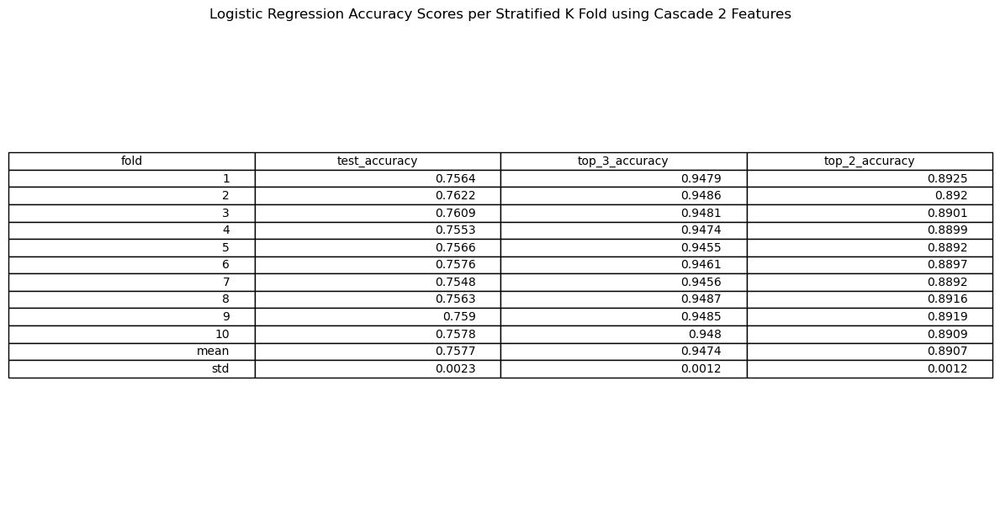

In [17]:
FEATURE_GROUP = "cascade_2"
INPUT_FILE = f"{FEATURE_GROUP}.csv"
df = pd.read_csv(INPUT_FILE)
df = df[~(df['label'].isin(labels_with_few_samples))].reset_index(drop=True)

for col in df.columns:
    if df[col].dtype == "bool":
        df[col] = df[col].astype(int)
        
df['label'], _ = column_adjustor(df['label'])
y = df['label'].astype(int)
X = df.drop(columns=['url', 'label'])
X['tld'] = X['tld'].astype(str).fillna("unknown")
X = X.fillna(-1)

cols_to_categorize = ['tld']
numeric_cols = [col for col in X.columns if col not in cols_to_categorize]
preprocessor = ColumnTransformer(
    transformers = [
        ("numeric", StandardScaler(), numeric_cols),
        ("categorical", OneHotEncoder(drop="first"), cols_to_categorize)
    ]
)

X = preprocessor.fit_transform(X)
numeric_features = preprocessor.transformers_[0][1].get_feature_names_out(numeric_cols).tolist()
categorical_features = preprocessor.transformers_[1][1].get_feature_names_out(cols_to_categorize).tolist()
features = numeric_features + categorical_features

n_splits = 10
skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)
lr = LogisticRegression(max_iter=1000, random_state=42, n_jobs=-1, multi_class="ovr")

scoring_metrics = {'test_accuracy': [], 'top_3_accuracy': [], 'top_2_accuracy': []}
X_tests = []
for fold, (train_index, test_index) in enumerate(skf.split(X, y)):
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = y[train_index], y[test_index]

    lr.fit(X_train, y_train)

    y_pred = lr.predict(X_test)
    scoring_metrics['test_accuracy'].append(accuracy_score(y_test, y_pred))
    all_confusion_matrices[FEATURE_GROUP].append(confusion_matrix(y_test, y_pred))

    y_pred_proba = lr.predict_proba(X_test)
    scoring_metrics['top_3_accuracy'].append(top_k_accuracy_score(y_test, y_pred_proba, k=3))
    scoring_metrics['top_2_accuracy'].append(top_k_accuracy_score(y_test, y_pred_proba, k=2))

    X_tests.append(X_test)

scores_df = pd.DataFrame(scoring_metrics)

mean = scores_df.mean()
scores_df.loc['mean'] = mean
std = scores_df.std()
scores_df.loc['std'] = std
scores_df['fold'] = [str(i + 1) for i in range(n_splits)] + ["mean", "std"]

scores = scores_df[['fold', 'test_accuracy', 'top_3_accuracy', 'top_2_accuracy']].round(4)
fig, ax = plt.subplots(figsize=(12, 6))
ax.axis("off")
ax.axis("tight")
table = ax.table(cellText = scores.values, colLabels = scores.columns, loc="center")
plt.tight_layout()
plt.title("Logistic Regression Accuracy Scores per Stratified K Fold using Cascade 2 Features")
plt.show()
plt.close(fig)

all_accuracy_scores[FEATURE_GROUP] = scores

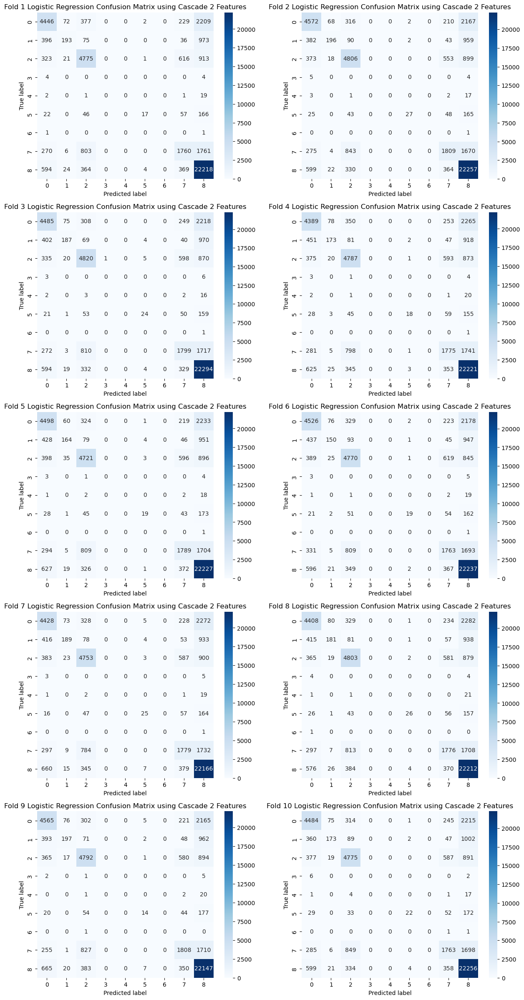

In [18]:
confusion_matrices = all_confusion_matrices[FEATURE_GROUP]
fig, axes = plt.subplots(nrows=len(confusion_matrices) // 2, ncols = 2, figsize = (15, len(confusion_matrices) * 3))

axes = axes.flatten()

for i, cm in enumerate(confusion_matrices):
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=axes[i])
    axes[i].set_title(f"Fold {str(i + 1)} Logistic Regression Confusion Matrix using Cascade 2 Features")
    axes[i].set_xlabel("Predicted label")
    axes[i].set_ylabel("True label")

plt.tight_layout
plt.show()
plt.close(fig)

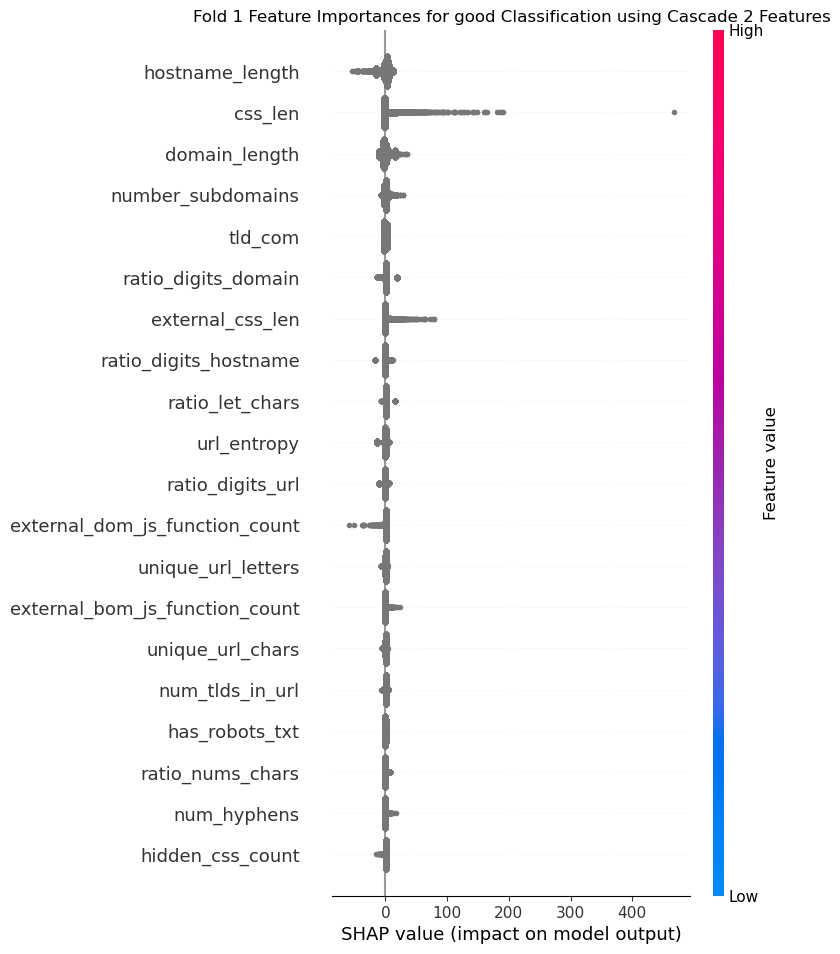

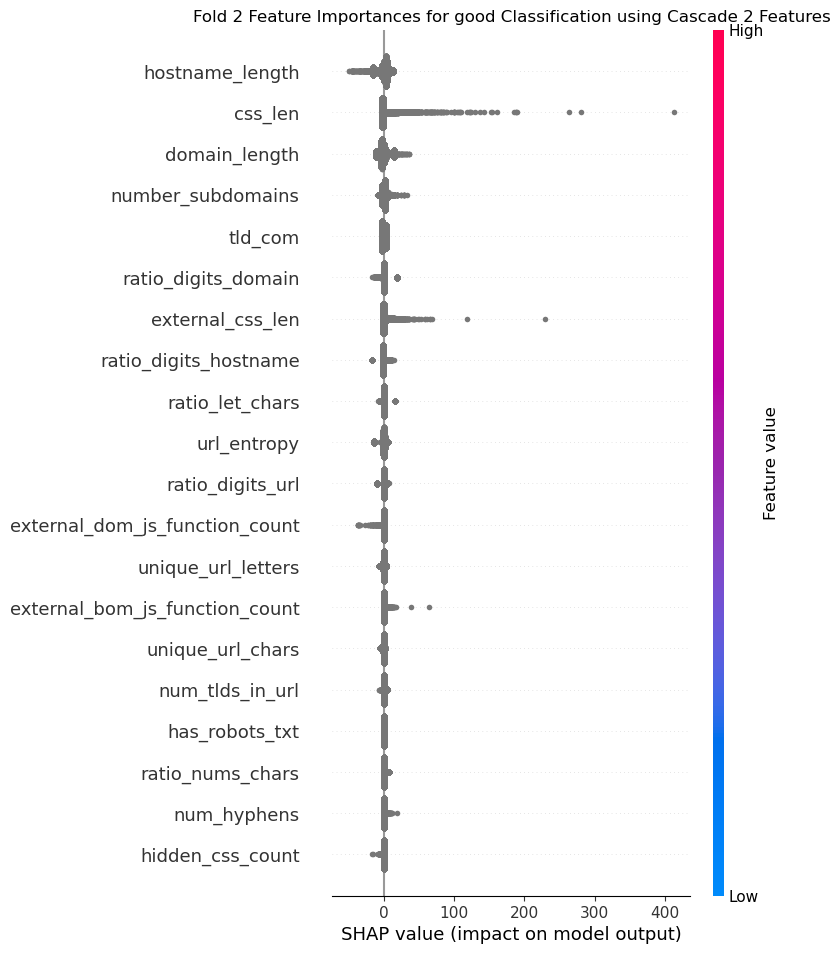

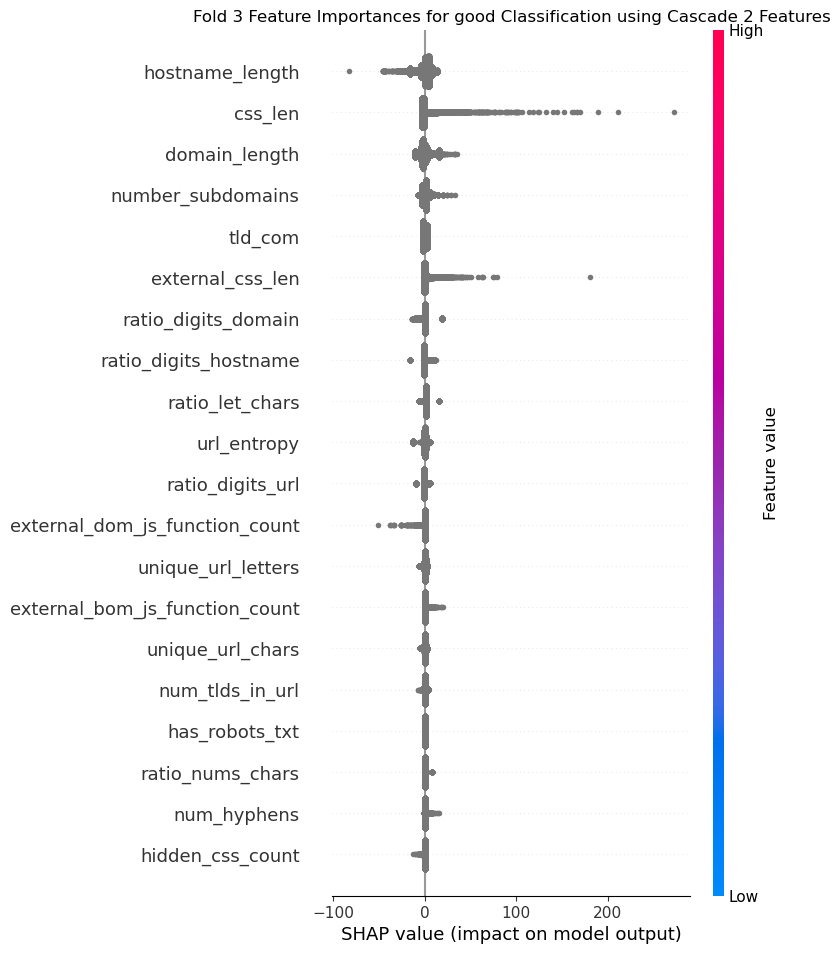

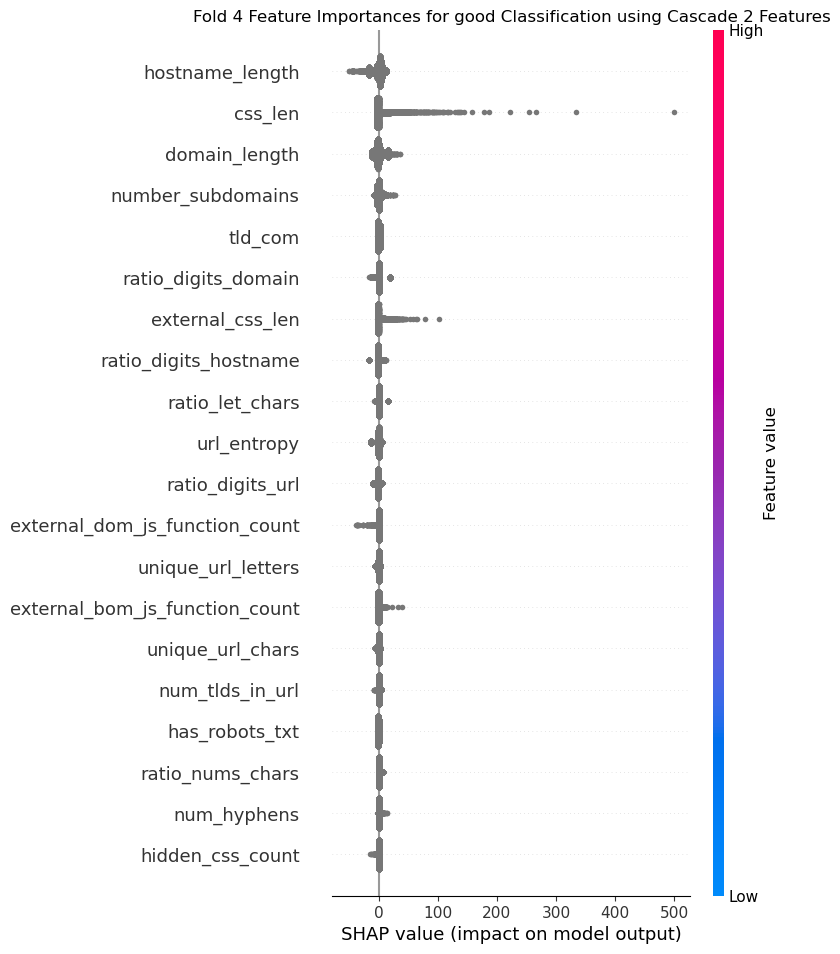

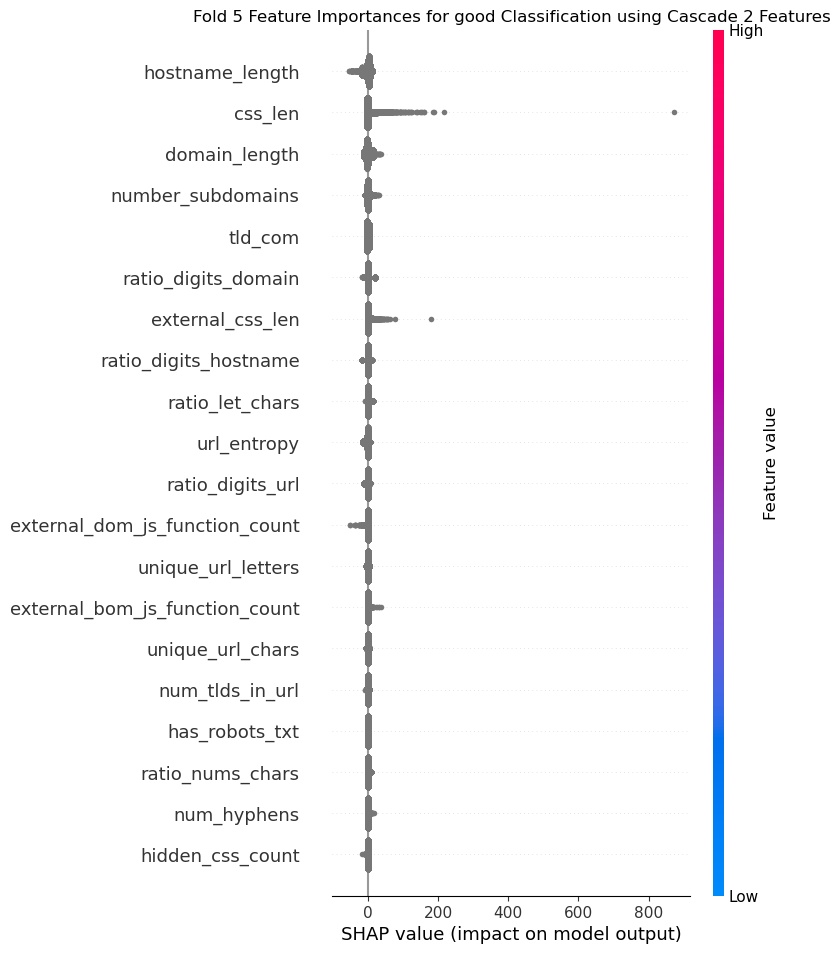

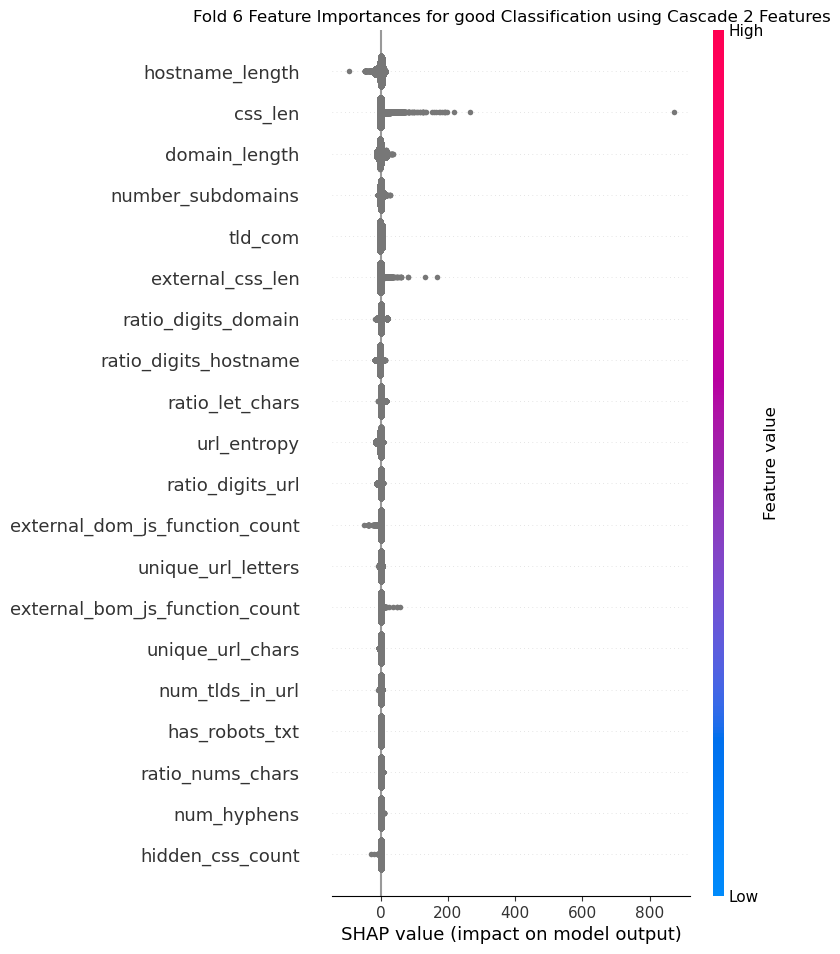

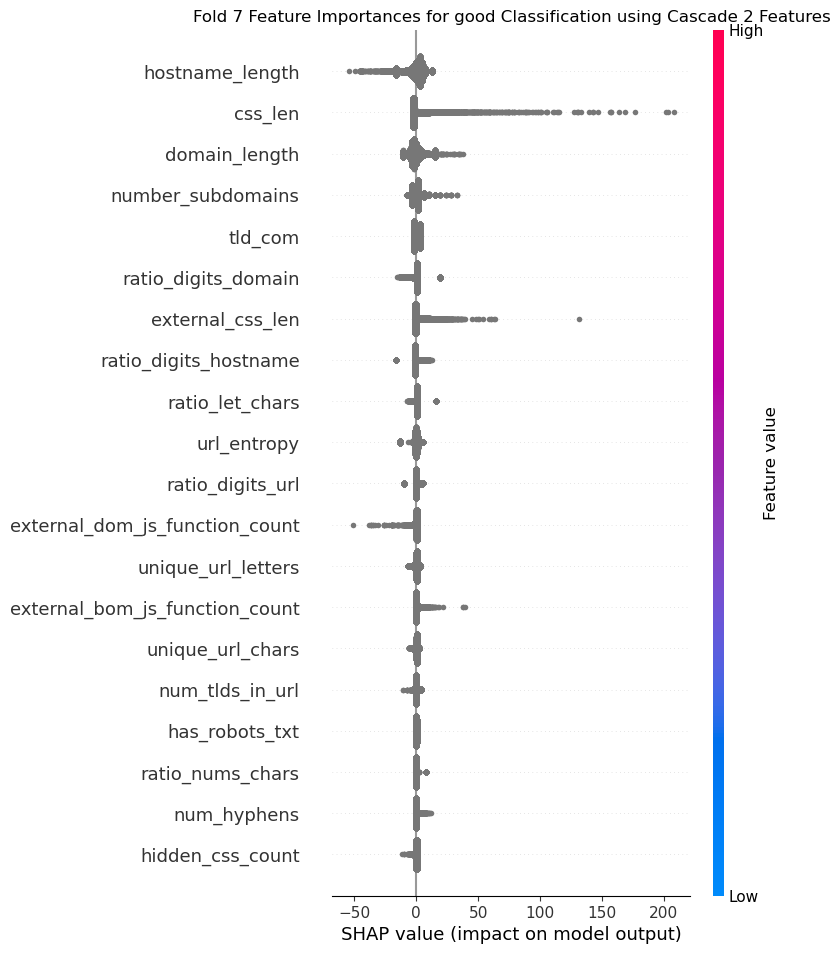

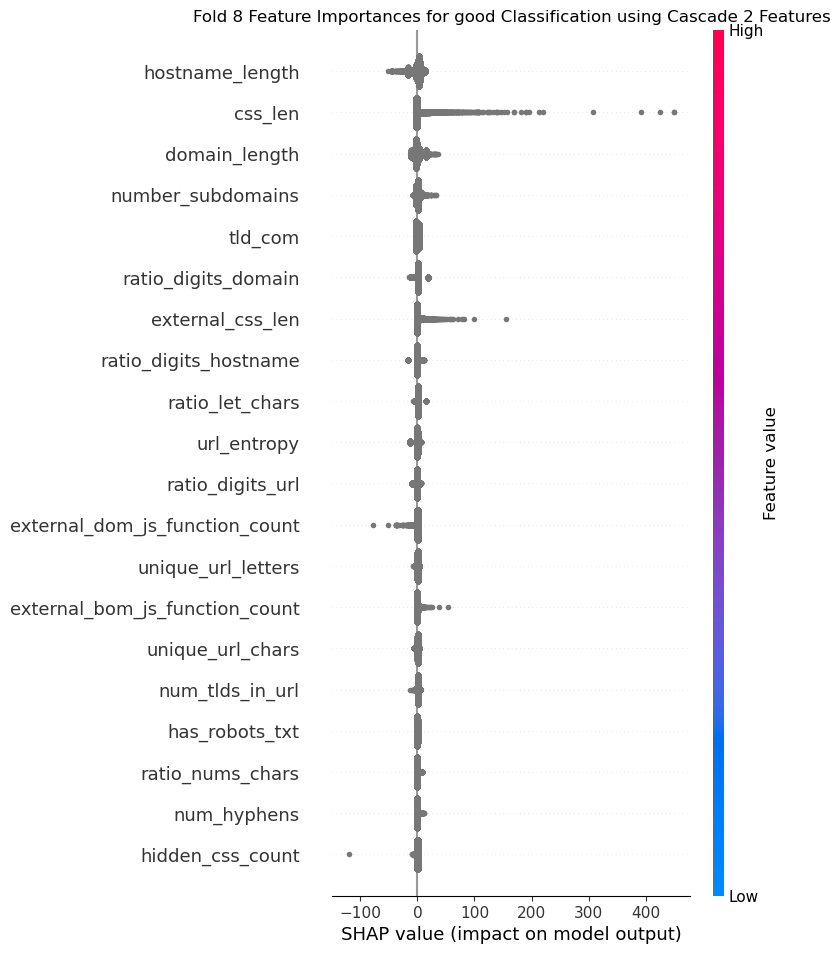

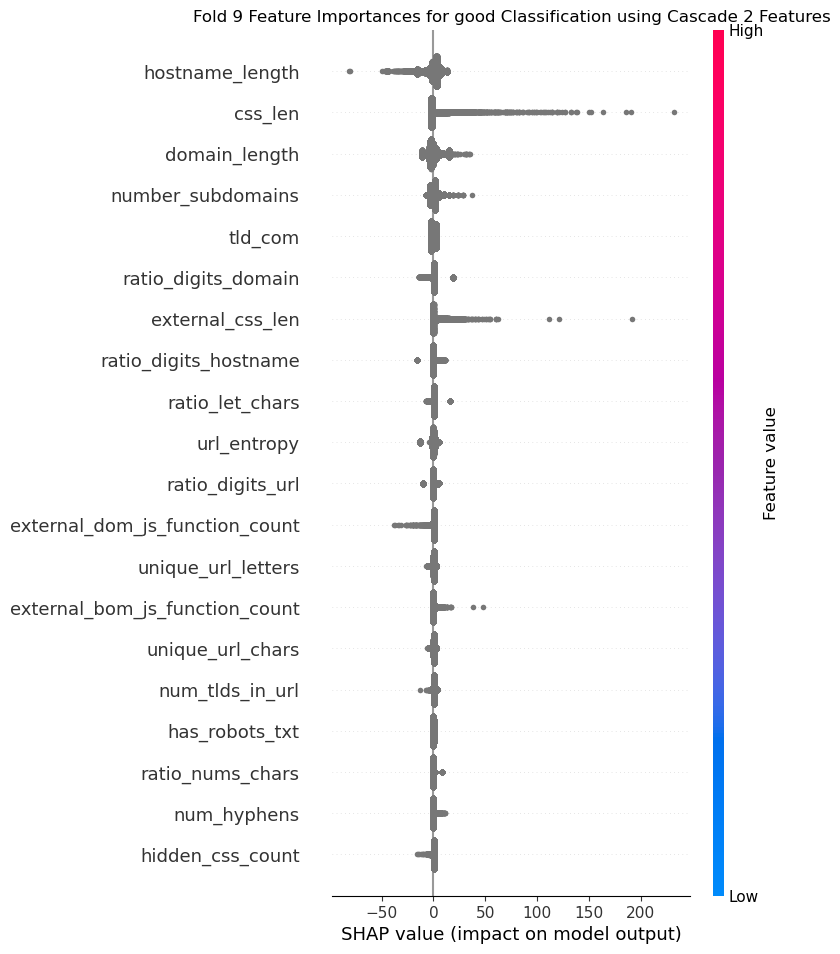

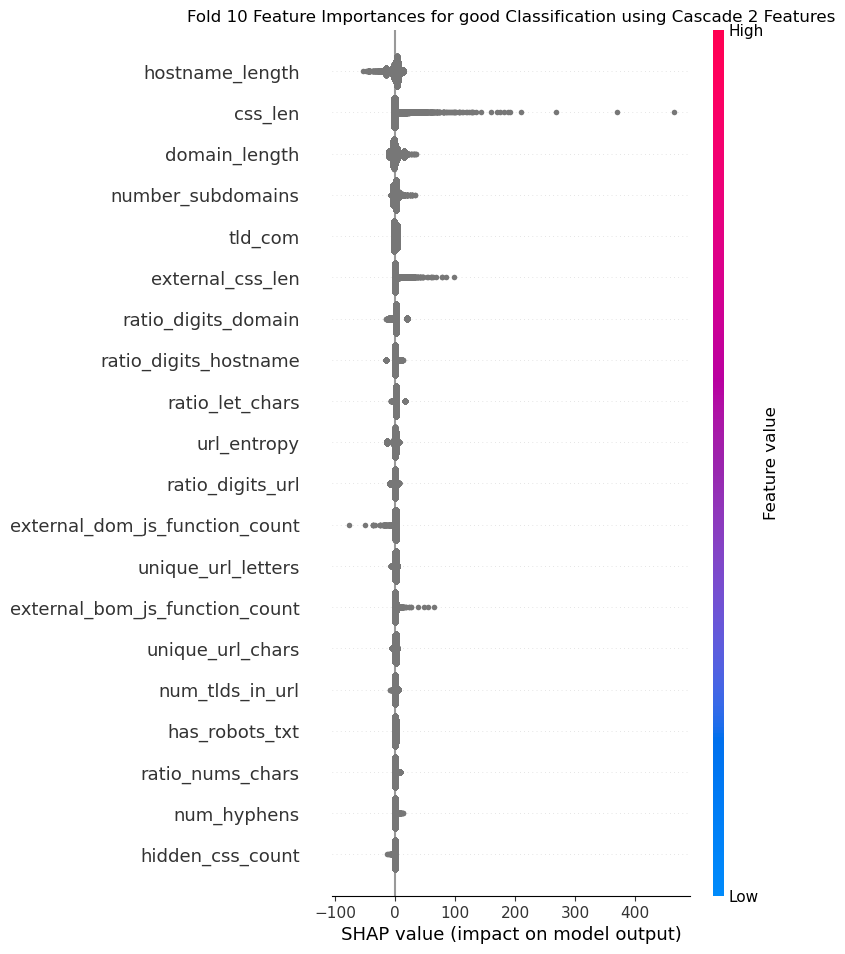

In [19]:
for i, X_test in enumerate(X_tests):
    explainer = shap.Explainer(lr, X_train, feature_names=features)
    shap_values = explainer.shap_values(X_test)
    shap.summary_plot(shap_values[:,:,-1], X_test, feature_names=features, max_display=20, show=False)
    plt.title(f"Fold {str(i + 1)} Feature Importances for good Classification using Cascade 2 Features")
    plt.show()
    
    all_shap_values[FEATURE_GROUP].append((i + 1, shap_values, X_test))

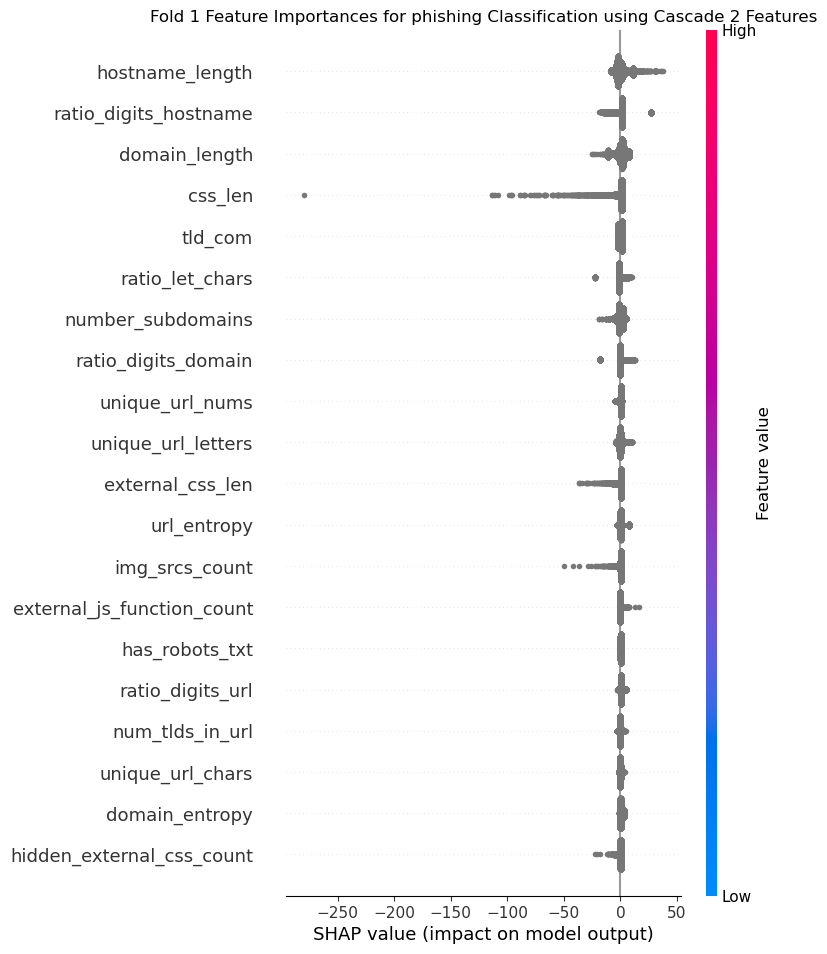

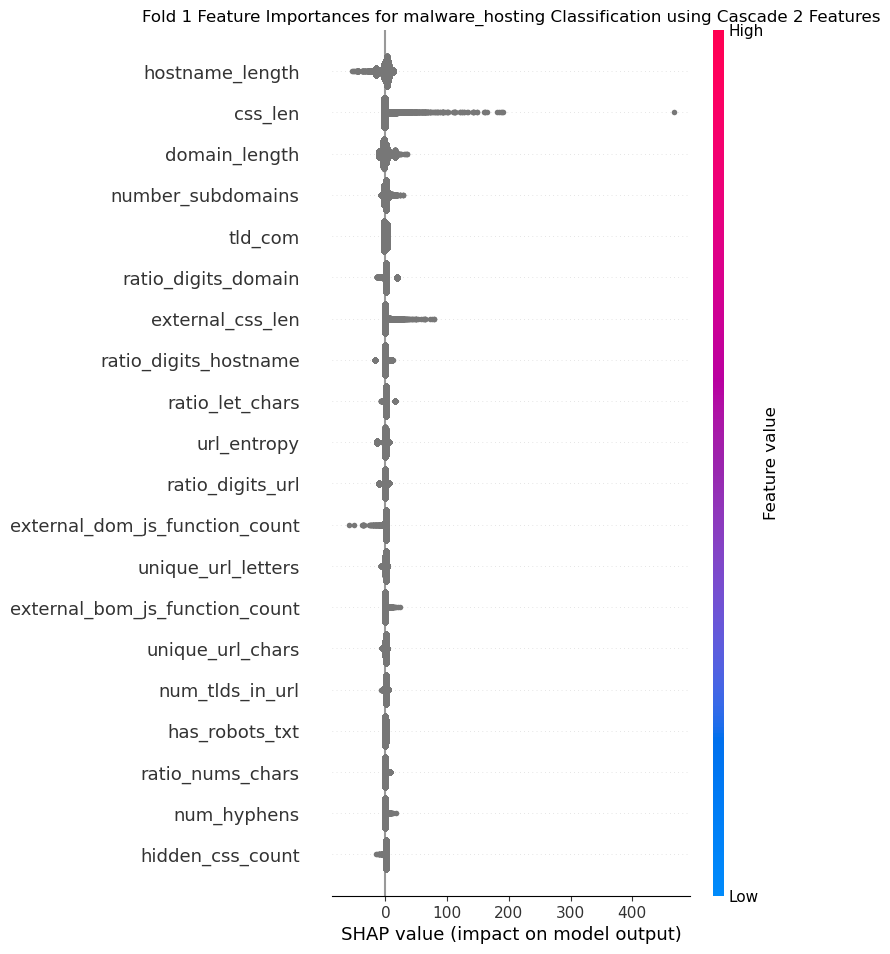

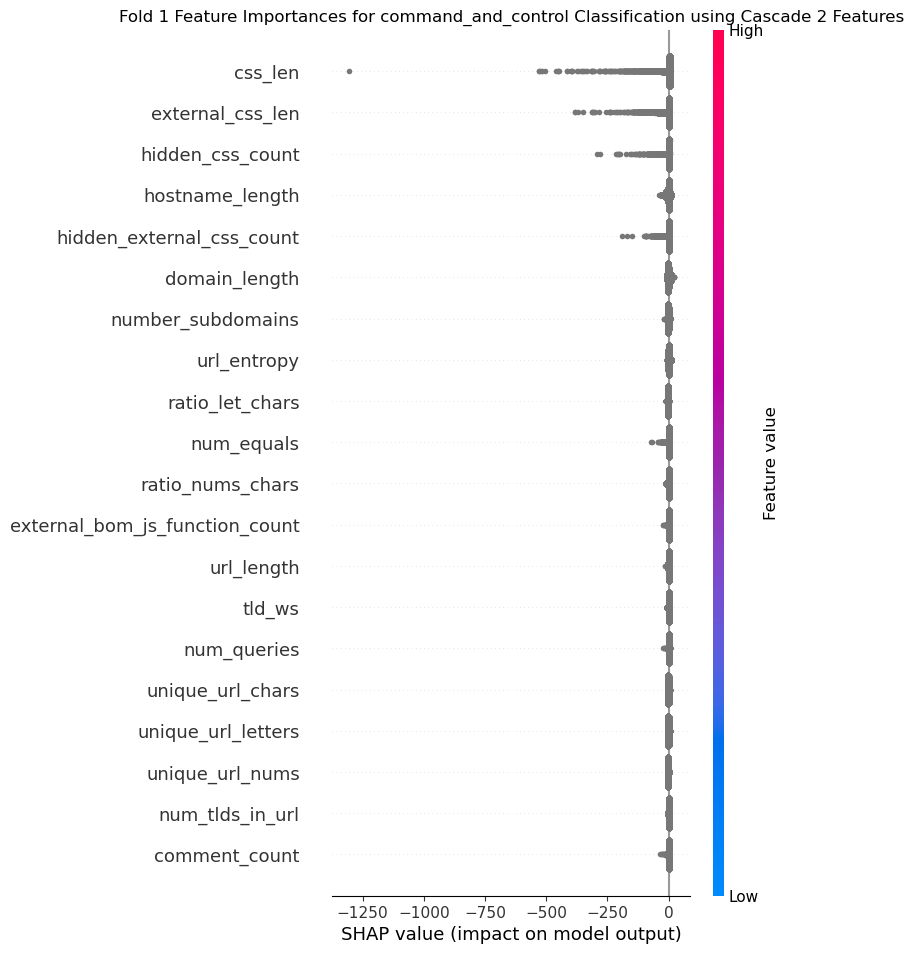

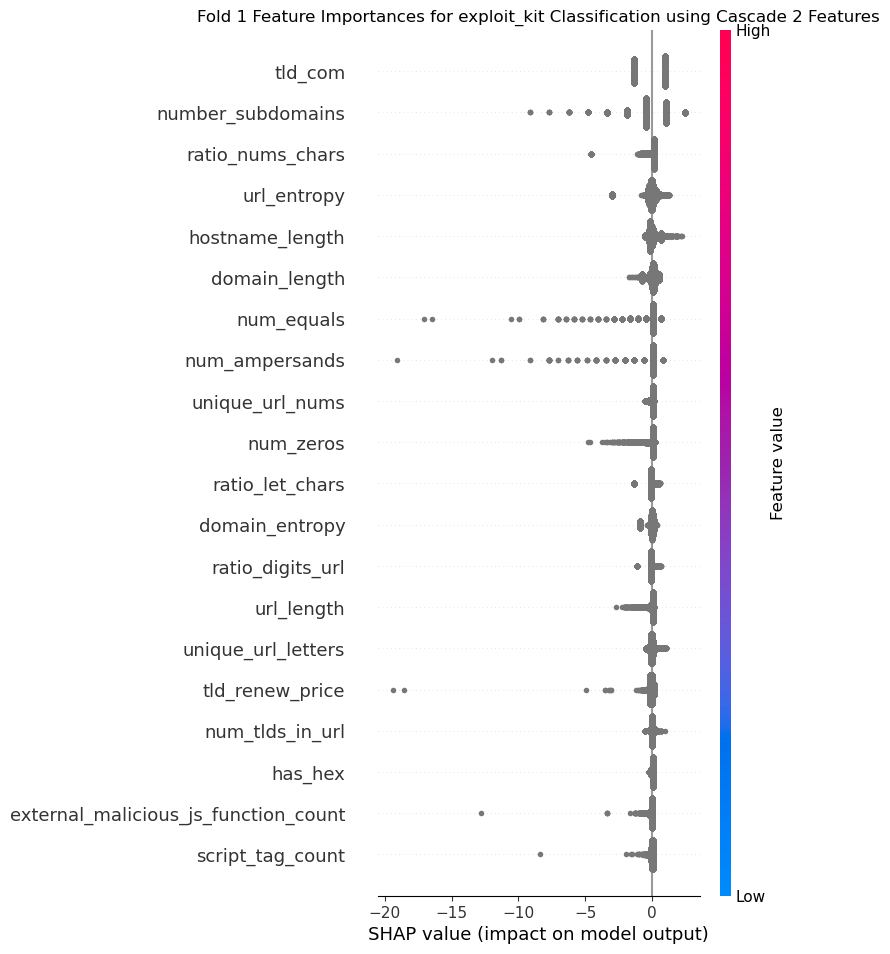

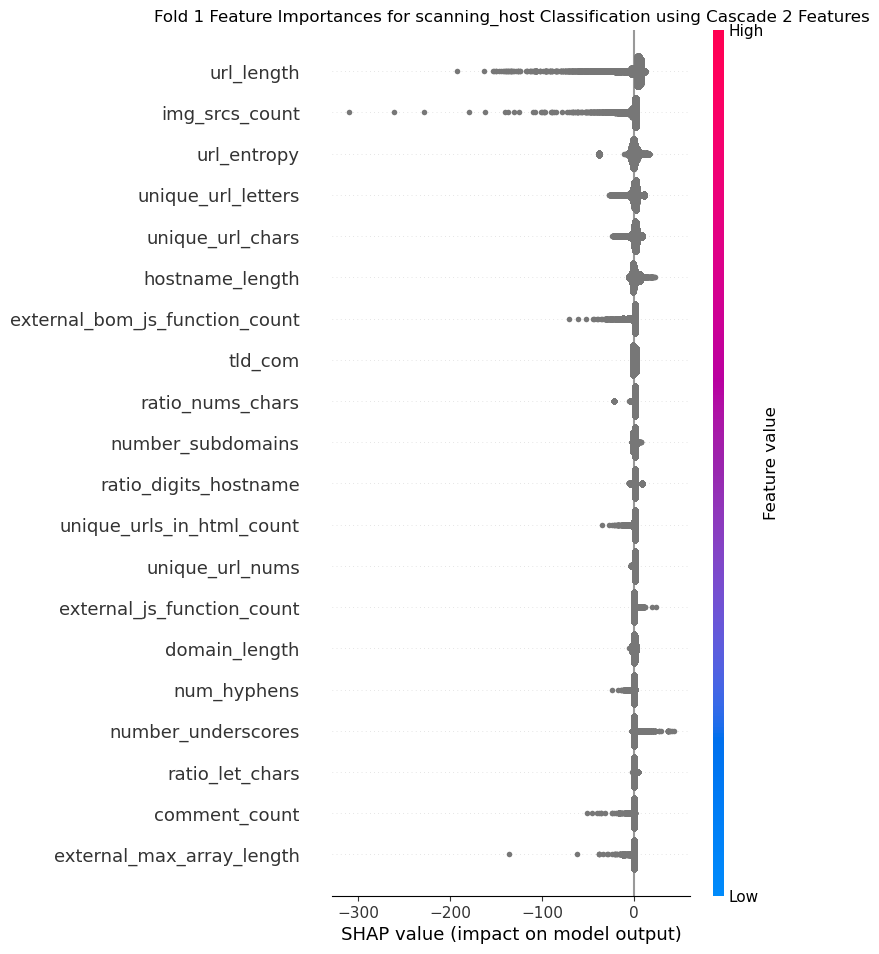

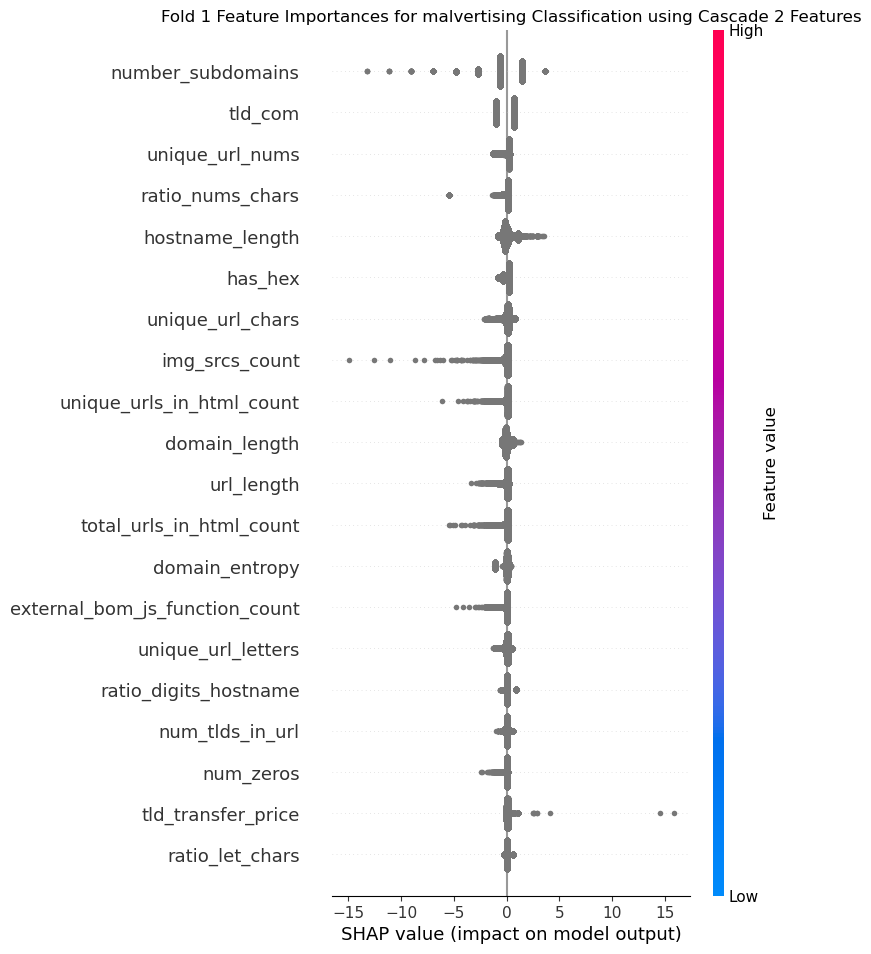

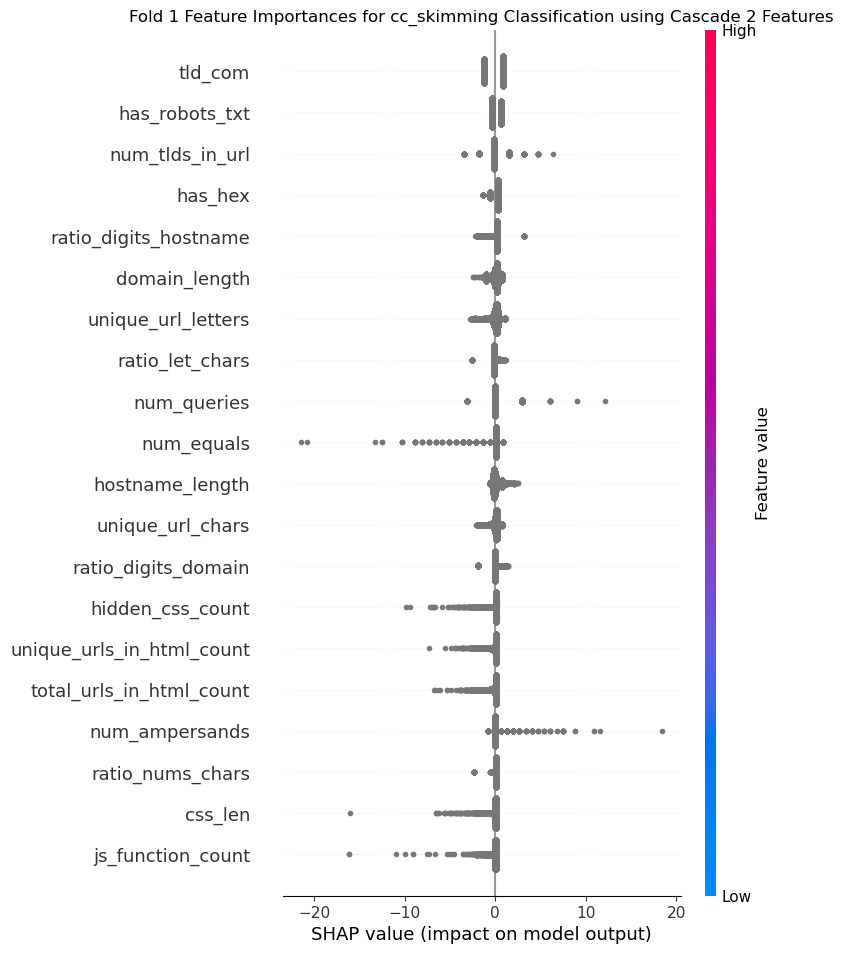

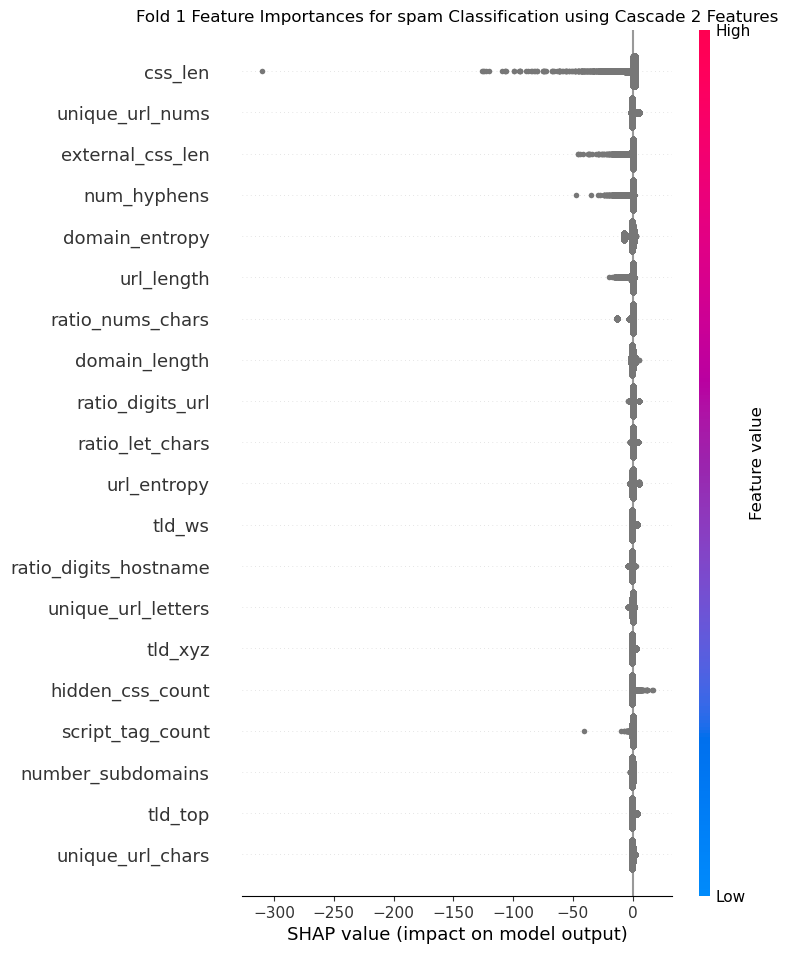

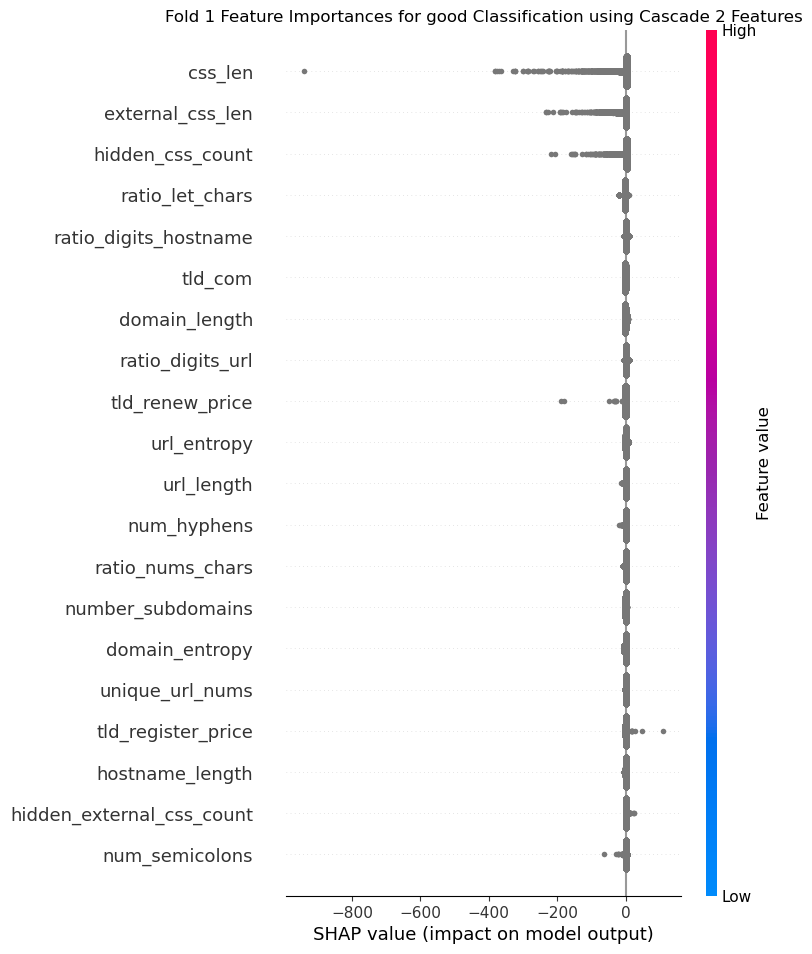

In [20]:
fold, shap_values, X_test = all_shap_values[FEATURE_GROUP][0]
for i, label in enumerate(labels):
    shap.summary_plot(shap_values[:,:,-i], X_test, feature_names=features, max_display=20, show=False)
    plt.title(f"Fold 1 Feature Importances for {label} Classification using Cascade 2 Features")
    plt.show()

## Cascade 3

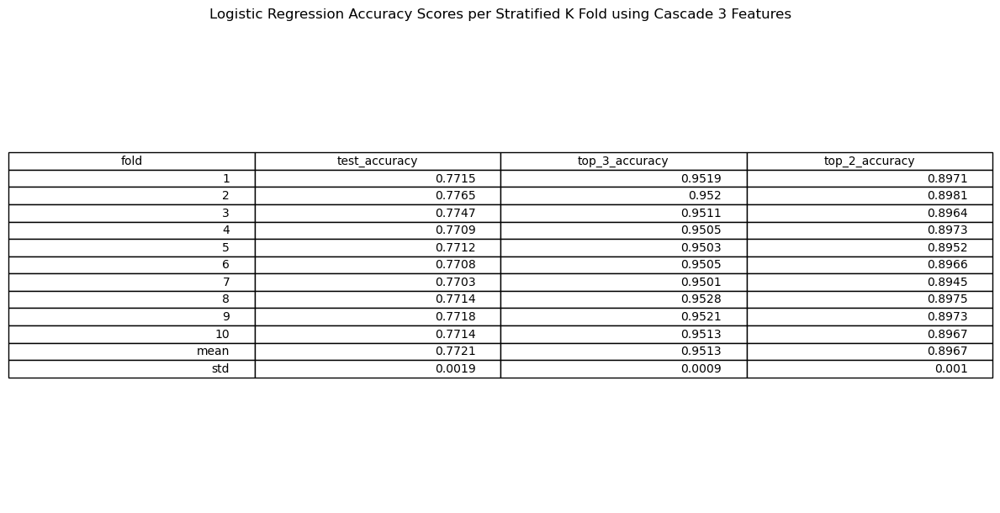

In [21]:
FEATURE_GROUP = "cascade_3"
INPUT_FILE = f"{FEATURE_GROUP}.csv"
df = pd.read_csv(INPUT_FILE)
df = df[~(df['label'].isin(labels_with_few_samples))].reset_index(drop=True)

for col in df.columns:
    if df[col].dtype == "bool":
        df[col] = df[col].astype(int)
        
df['label'], _ = column_adjustor(df['label'])
y = df['label'].astype(int)
X = df.drop(columns=['url', 'label'])
X['tld'] = X['tld'].astype(str).fillna("unknown")
X = X.fillna(-1)

cols_to_categorize = ['tld']
numeric_cols = [col for col in X.columns if col not in cols_to_categorize]
preprocessor = ColumnTransformer(
    transformers = [
        ("numeric", StandardScaler(), numeric_cols),
        ("categorical", OneHotEncoder(drop="first"), cols_to_categorize)
    ]
)

X = preprocessor.fit_transform(X)
numeric_features = preprocessor.transformers_[0][1].get_feature_names_out(numeric_cols).tolist()
categorical_features = preprocessor.transformers_[1][1].get_feature_names_out(cols_to_categorize).tolist()
features = numeric_features + categorical_features

n_splits = 10
skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)
lr = LogisticRegression(max_iter=1000, random_state=42, n_jobs=-1, multi_class="ovr")

scoring_metrics = {'test_accuracy': [], 'top_3_accuracy': [], 'top_2_accuracy': []}
X_tests = []
for fold, (train_index, test_index) in enumerate(skf.split(X, y)):
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = y[train_index], y[test_index]

    lr.fit(X_train, y_train)

    y_pred = lr.predict(X_test)
    scoring_metrics['test_accuracy'].append(accuracy_score(y_test, y_pred))
    all_confusion_matrices[FEATURE_GROUP].append(confusion_matrix(y_test, y_pred))

    y_pred_proba = lr.predict_proba(X_test)
    scoring_metrics['top_3_accuracy'].append(top_k_accuracy_score(y_test, y_pred_proba, k=3))
    scoring_metrics['top_2_accuracy'].append(top_k_accuracy_score(y_test, y_pred_proba, k=2))

    X_tests.append(X_test)

scores_df = pd.DataFrame(scoring_metrics)

mean = scores_df.mean()
scores_df.loc['mean'] = mean
std = scores_df.std()
scores_df.loc['std'] = std
scores_df['fold'] = [str(i + 1) for i in range(n_splits)] + ["mean", "std"]

scores = scores_df[['fold', 'test_accuracy', 'top_3_accuracy', 'top_2_accuracy']].round(4)
fig, ax = plt.subplots(figsize=(12, 6))
ax.axis("off")
ax.axis("tight")
table = ax.table(cellText = scores.values, colLabels = scores.columns, loc="center")
plt.tight_layout()
plt.title("Logistic Regression Accuracy Scores per Stratified K Fold using Cascade 3 Features")
plt.show()
plt.close(fig)

all_accuracy_scores[FEATURE_GROUP] = scores

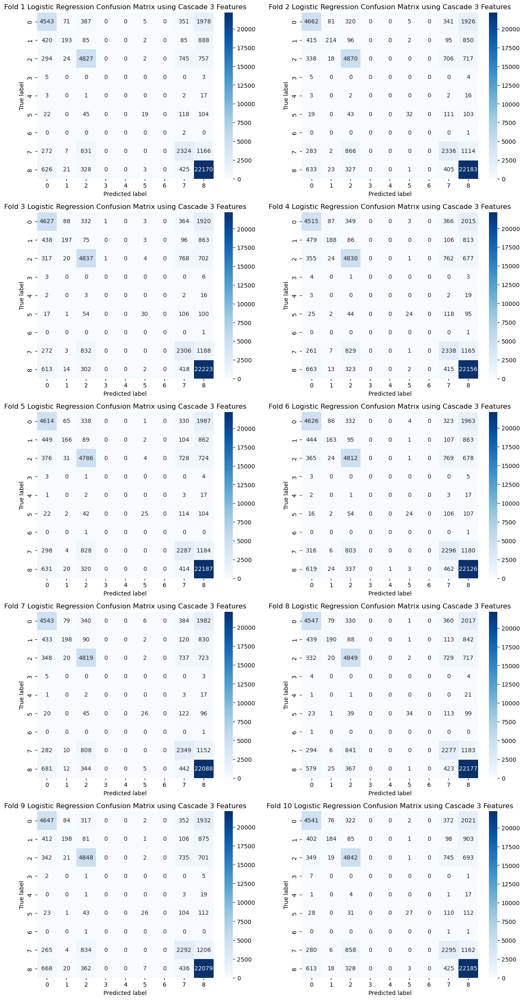

In [22]:
confusion_matrices = all_confusion_matrices[FEATURE_GROUP]
fig, axes = plt.subplots(nrows=len(confusion_matrices) // 2, ncols = 2, figsize = (15, len(confusion_matrices) * 3))

axes = axes.flatten()

for i, cm in enumerate(confusion_matrices):
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=axes[i])
    axes[i].set_title(f"Fold {str(i + 1)} Logistic Regression Confusion Matrix using Cascade 3 Features")
    axes[i].set_xlabel("Predicted label")
    axes[i].set_ylabel("True label")

plt.tight_layout
plt.show()
plt.close(fig)

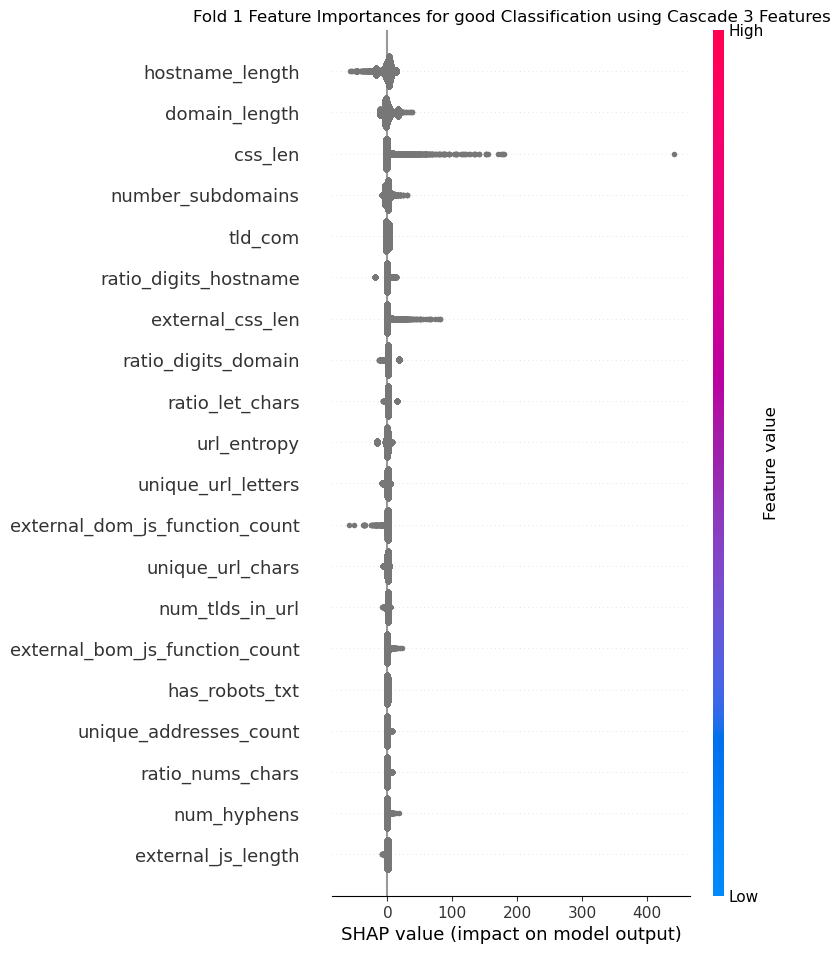

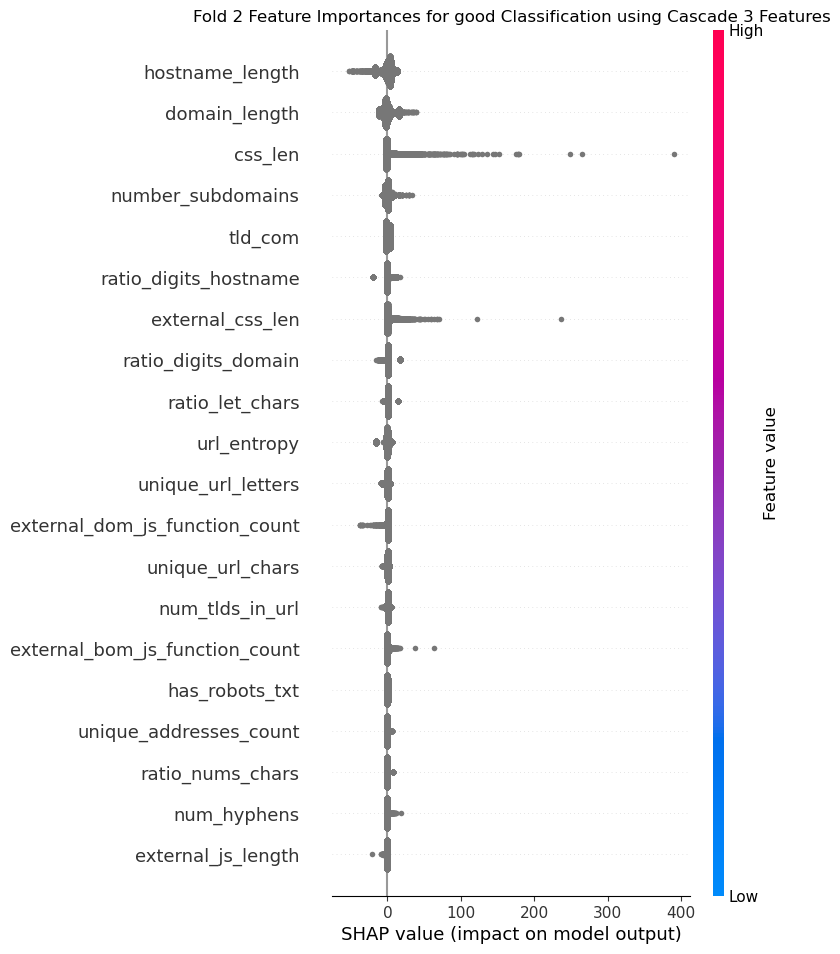

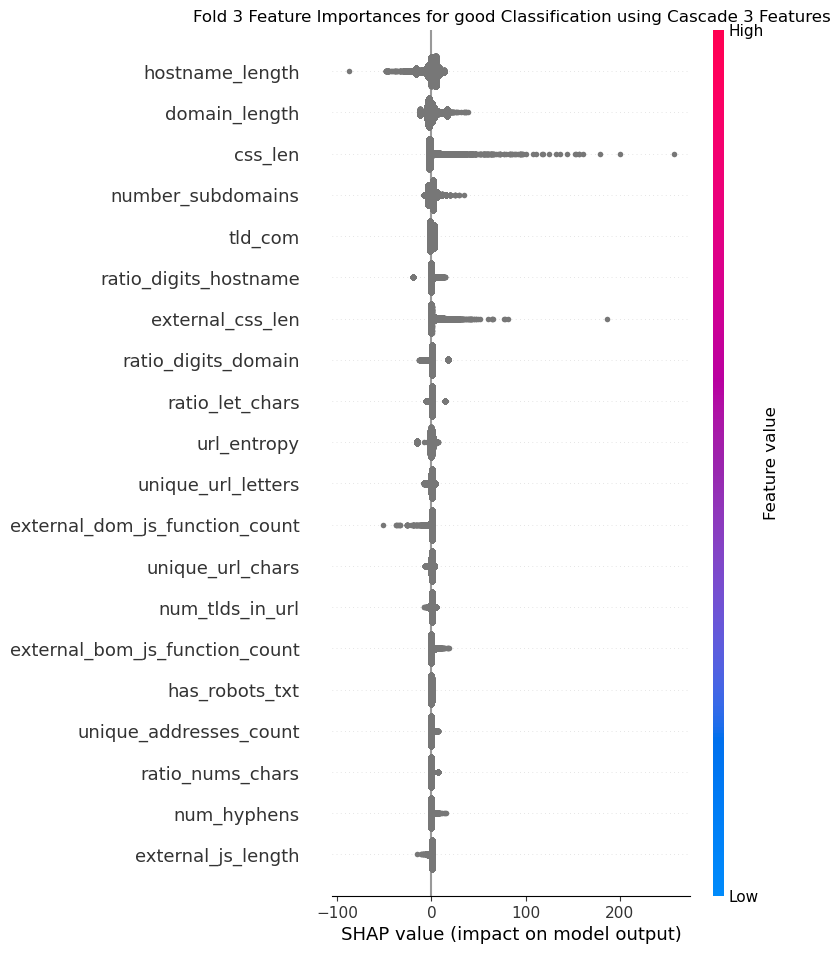

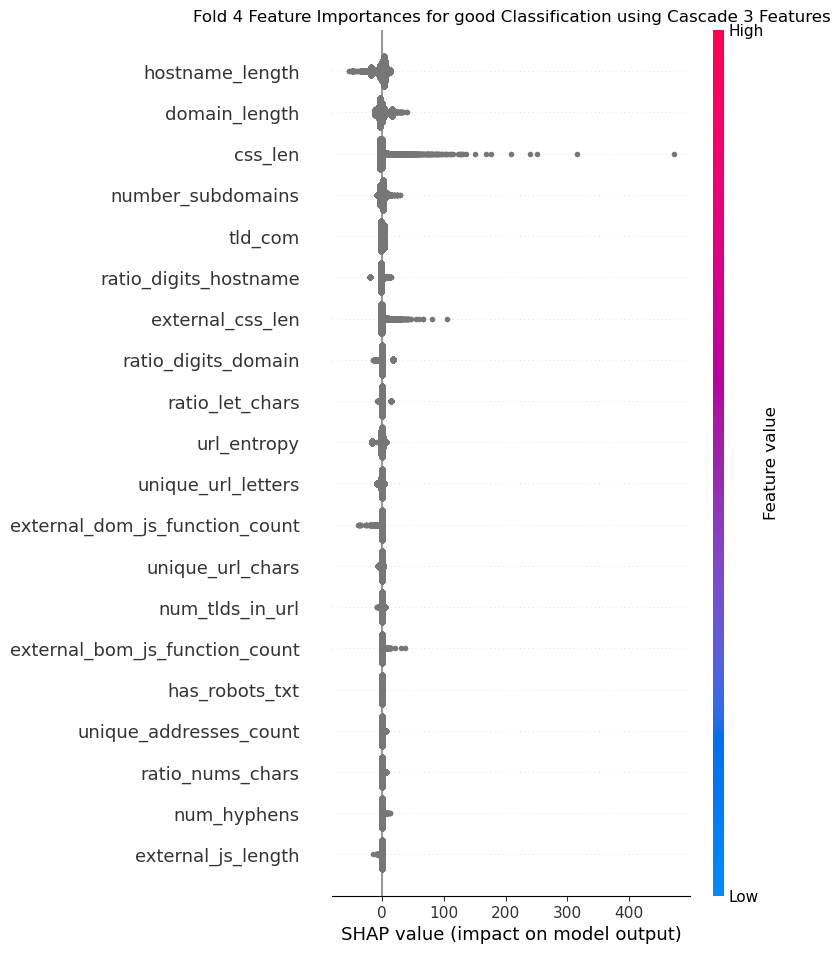

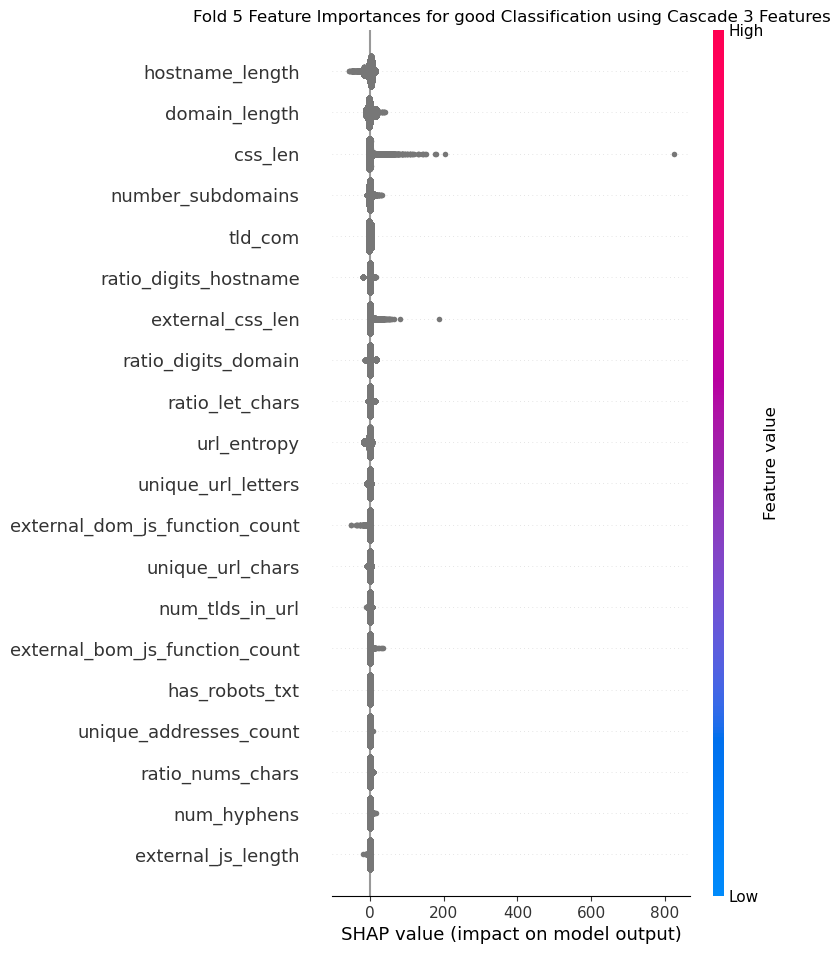

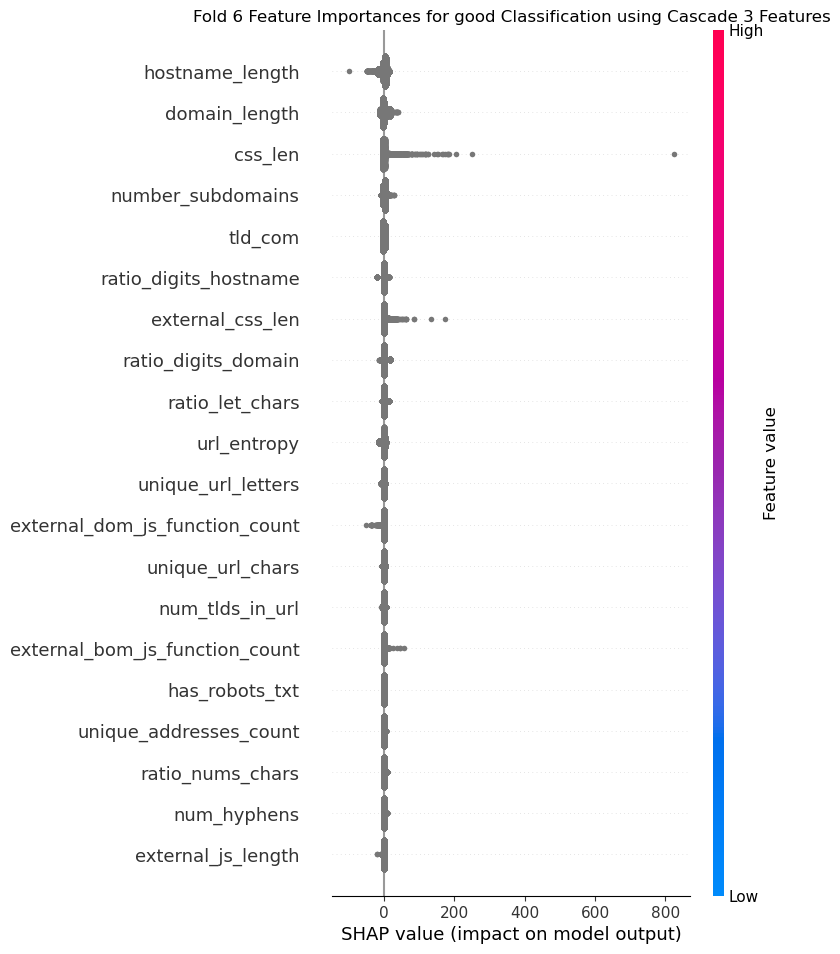

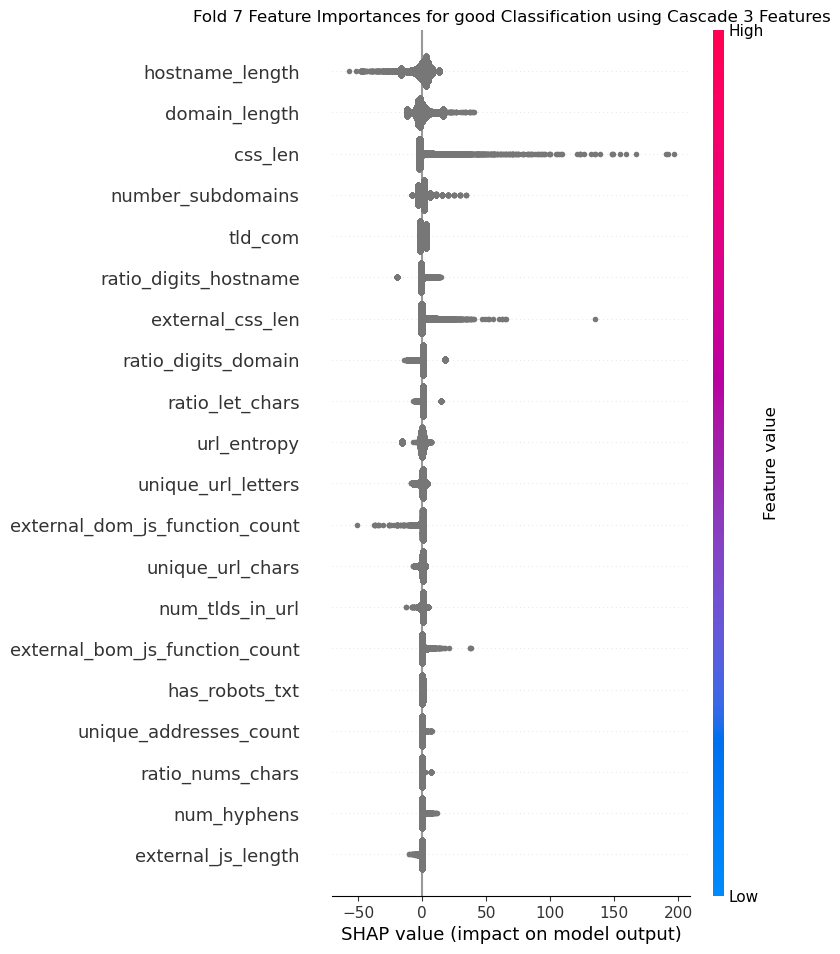

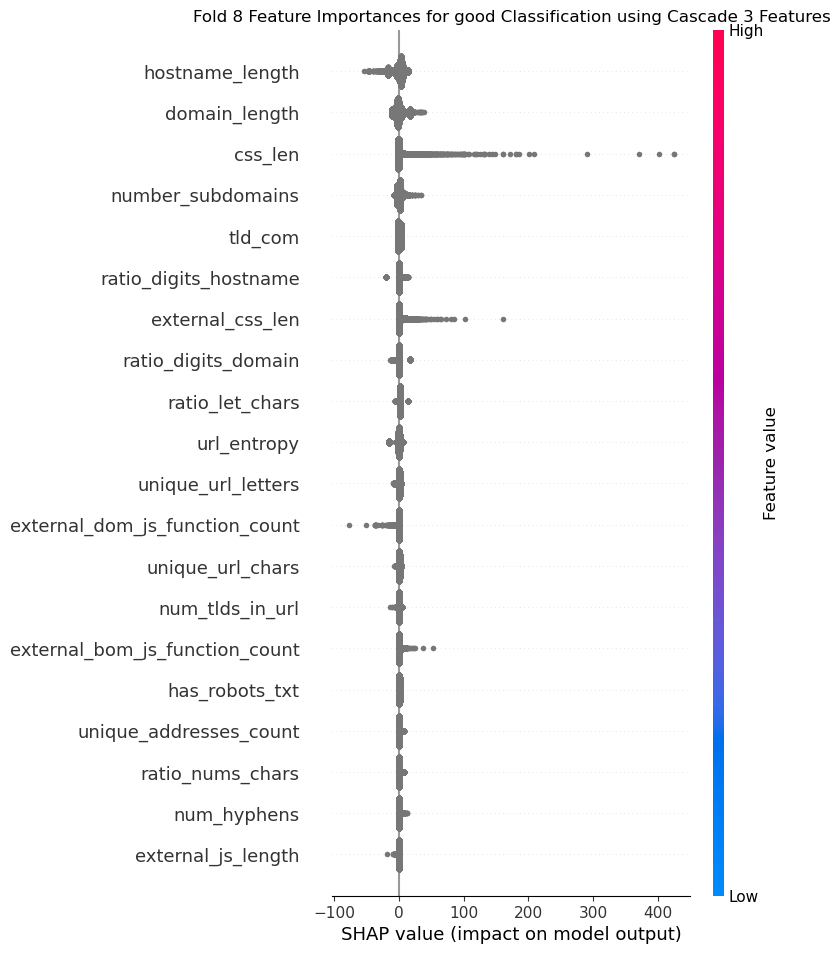

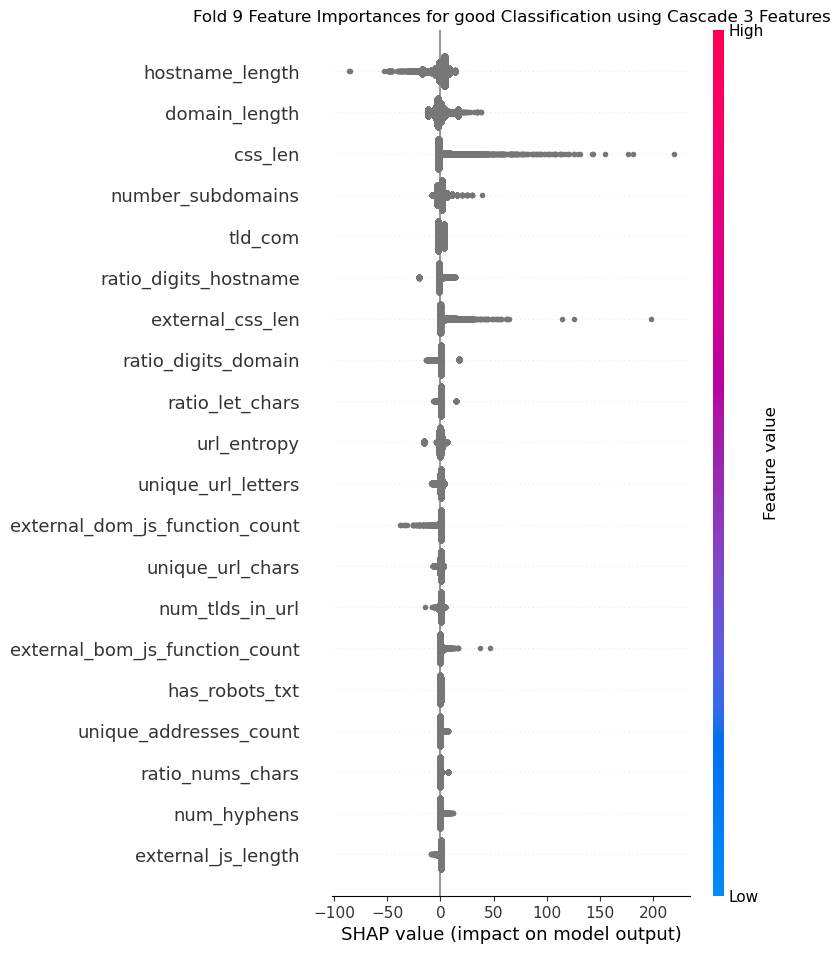

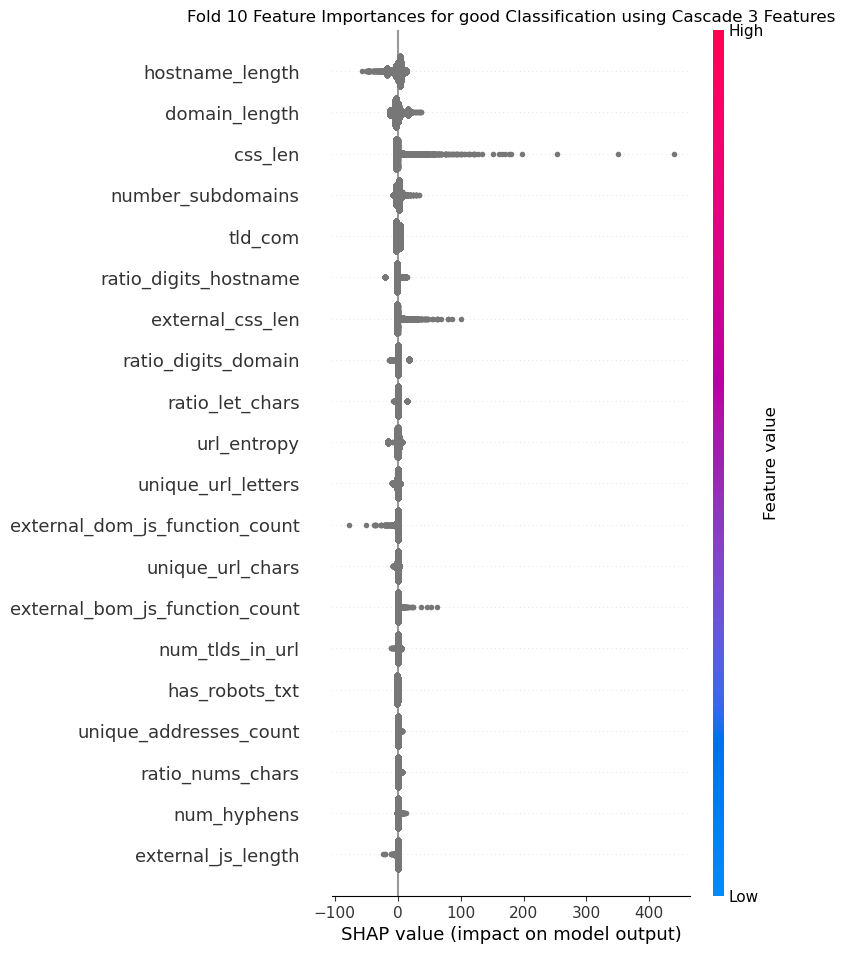

In [23]:
for i, X_test in enumerate(X_tests):
    explainer = shap.Explainer(lr, X_train, feature_names=features)
    shap_values = explainer.shap_values(X_test)
    shap.summary_plot(shap_values[:,:,-1], X_test, feature_names=features, max_display=20, show=False)
    plt.title(f"Fold {str(i + 1)} Feature Importances for good Classification using Cascade 3 Features")
    plt.show()
    
    all_shap_values[FEATURE_GROUP].append((i + 1, shap_values, X_test))

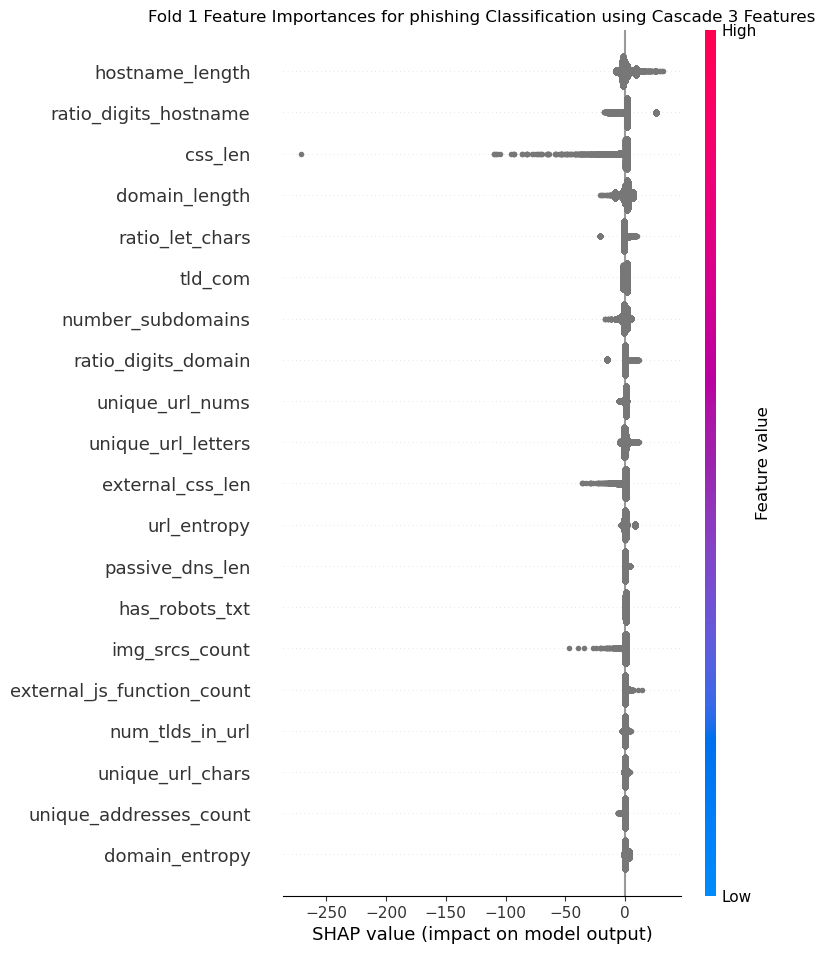

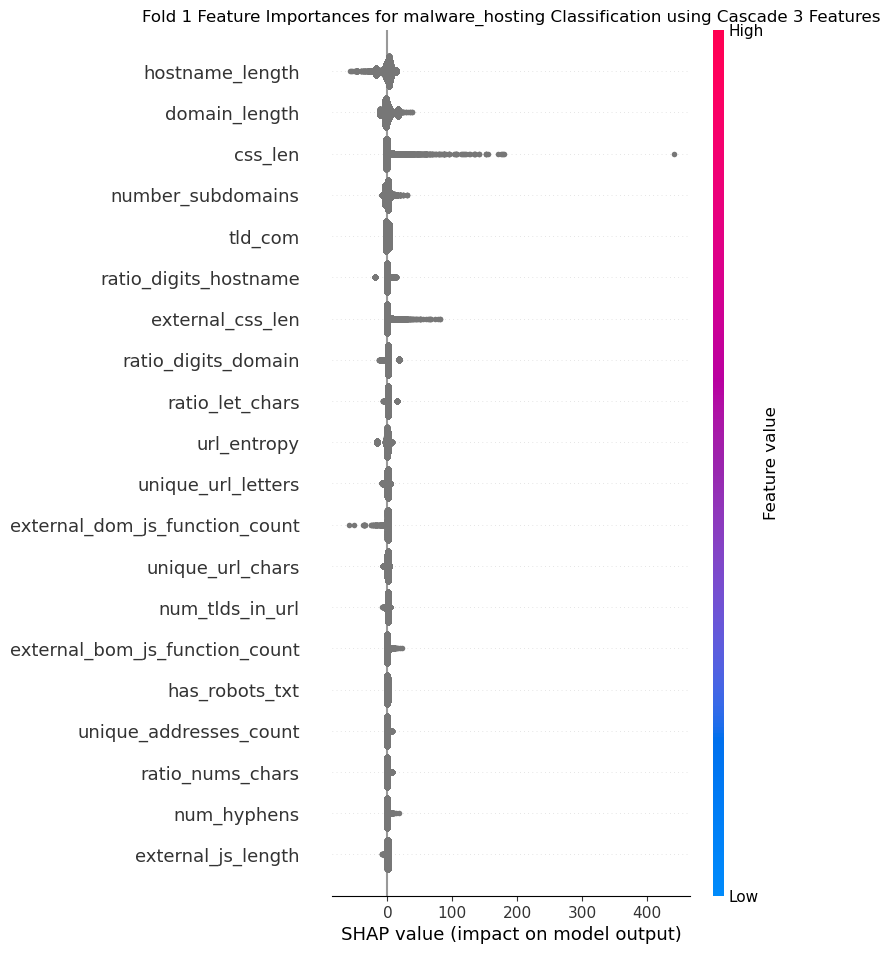

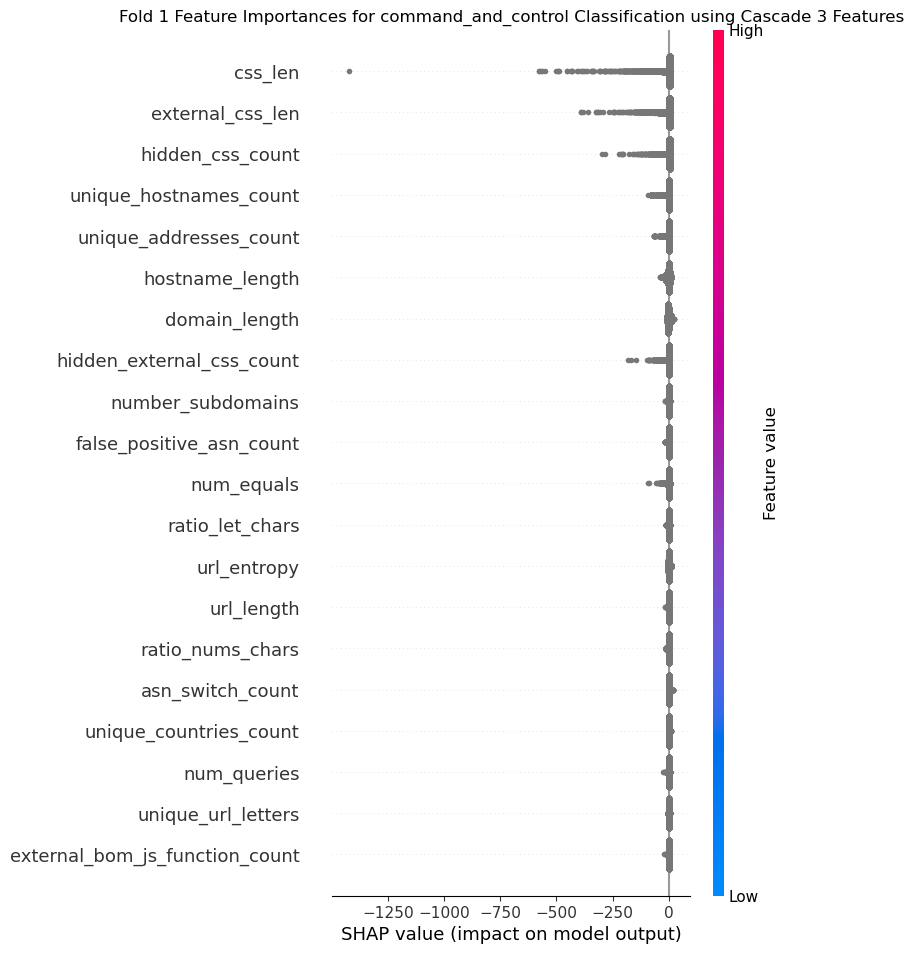

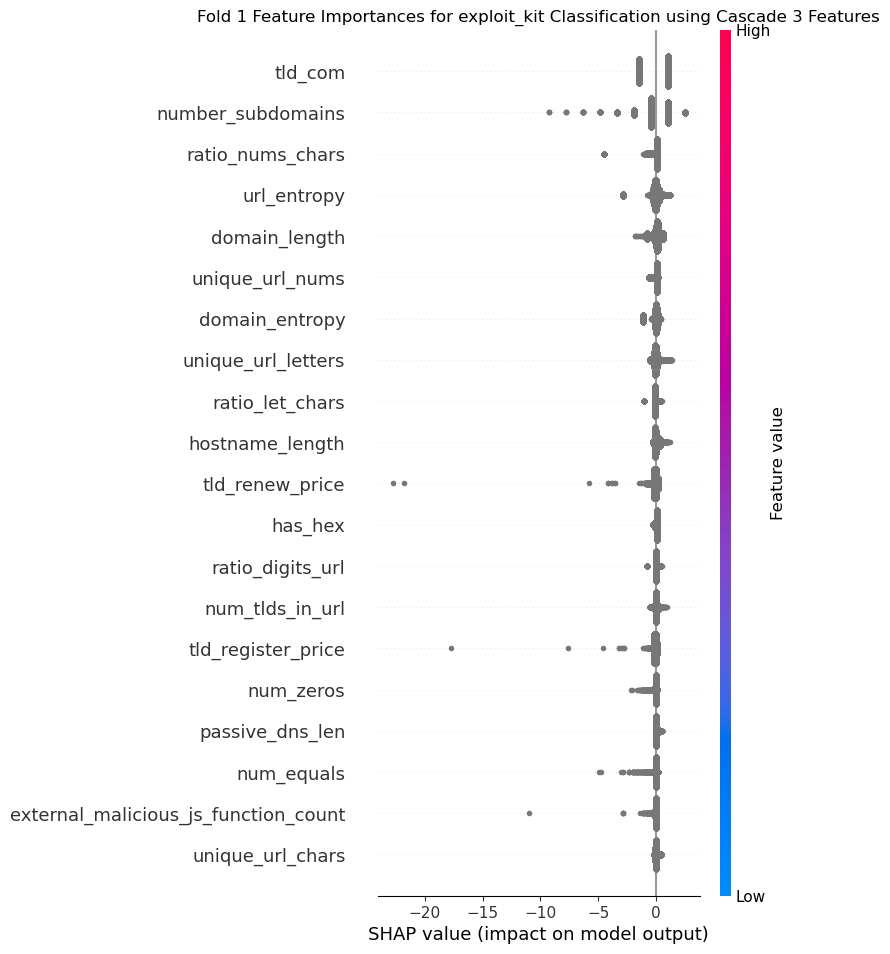

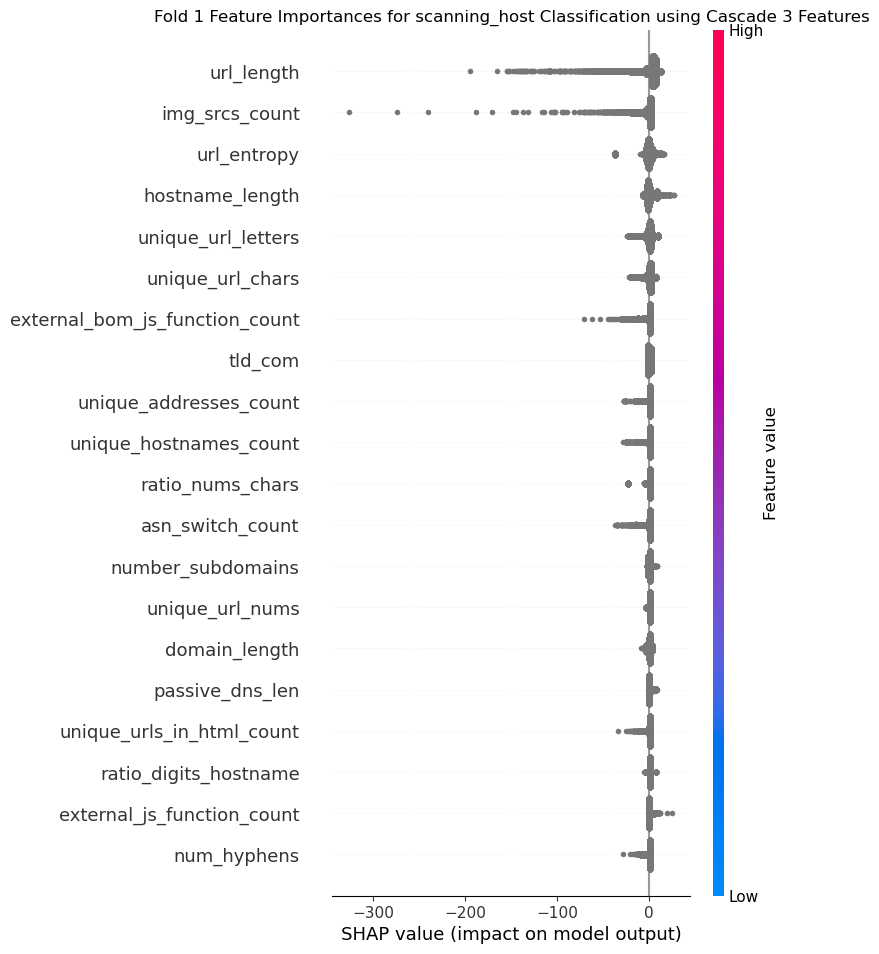

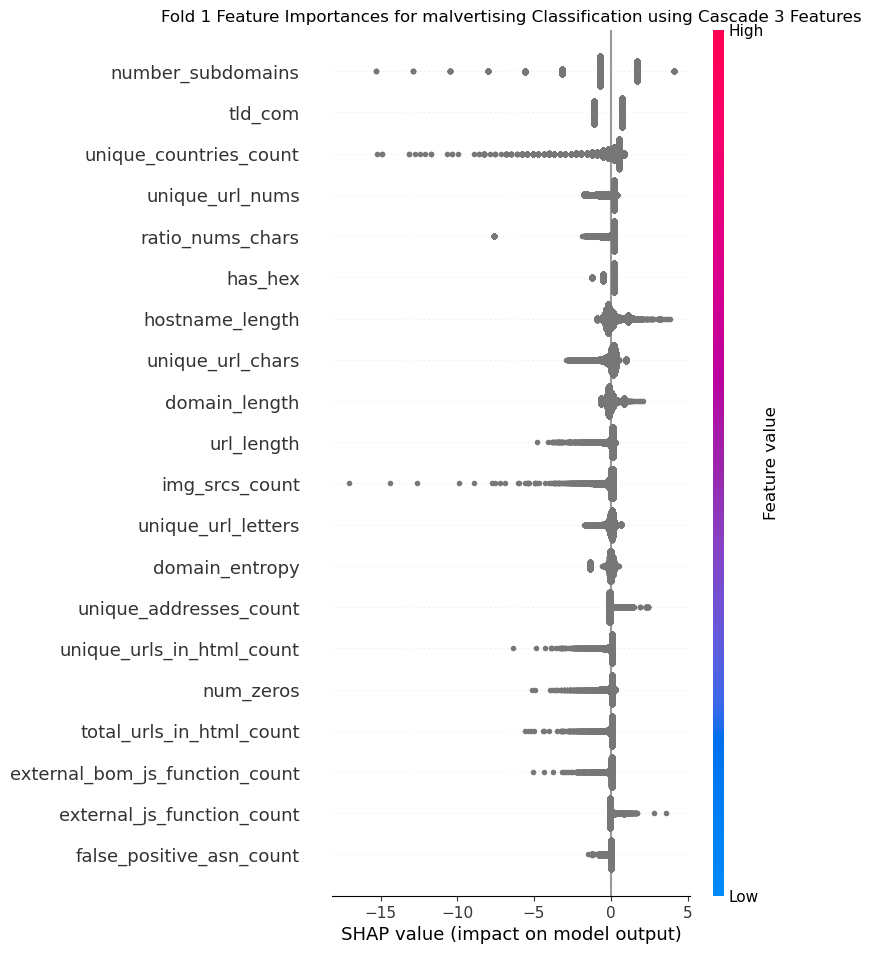

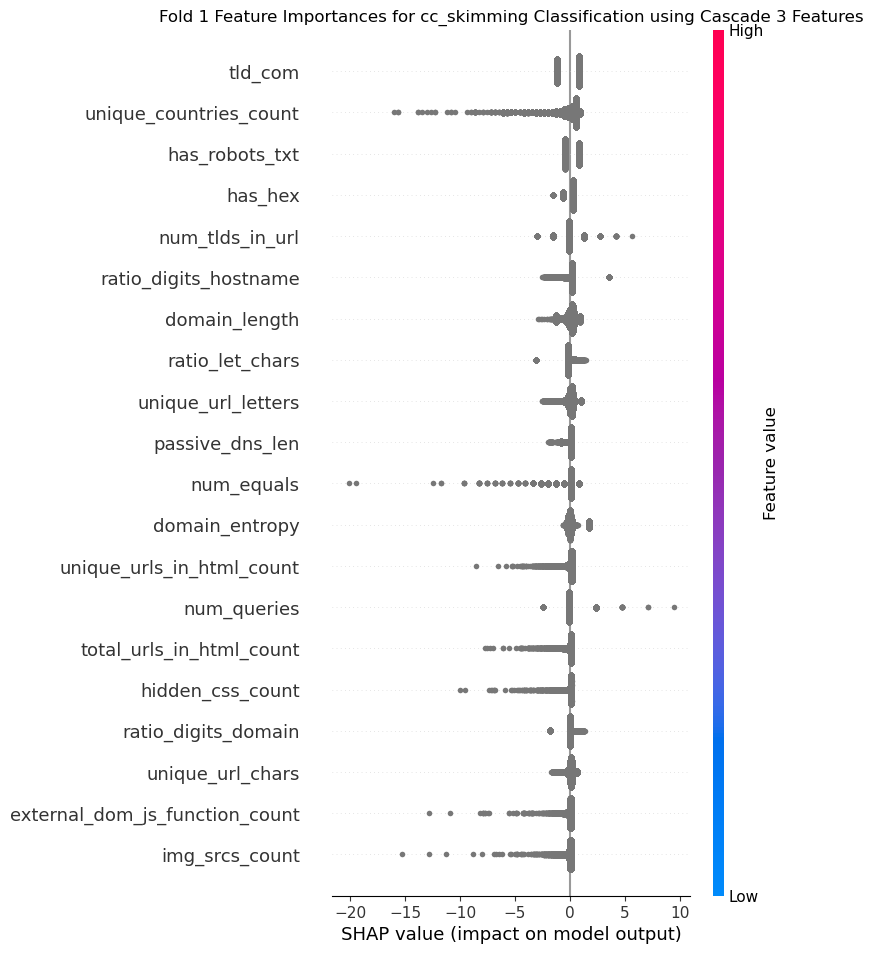

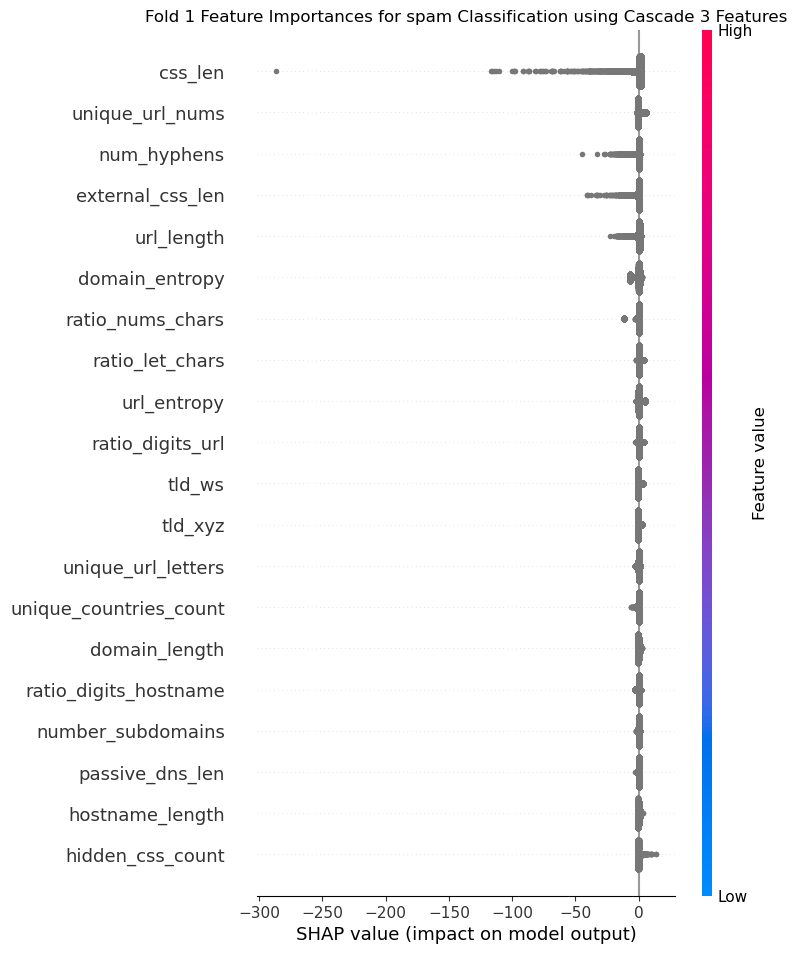

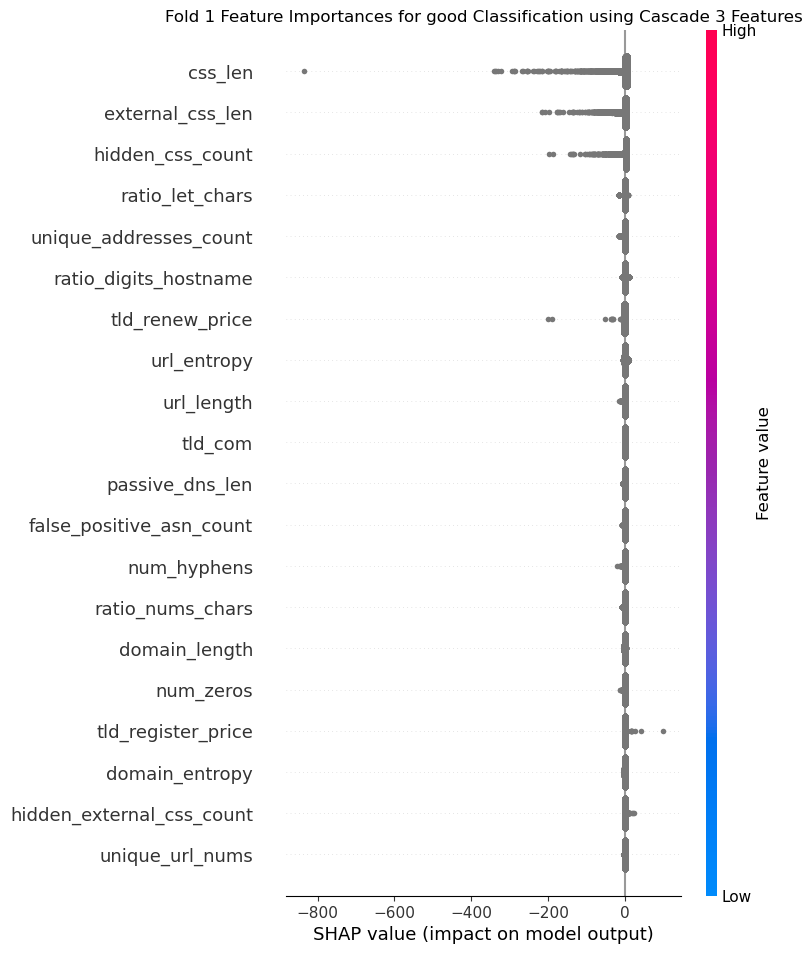

In [24]:
fold, shap_values, X_test = all_shap_values[FEATURE_GROUP][0]
for i, label in enumerate(labels):
    shap.summary_plot(shap_values[:,:,-i], X_test, feature_names=features, max_display=20, show=False)
    plt.title(f"Fold 1 Feature Importances for {label} Classification using Cascade 3 Features")
    plt.show()

## All Features

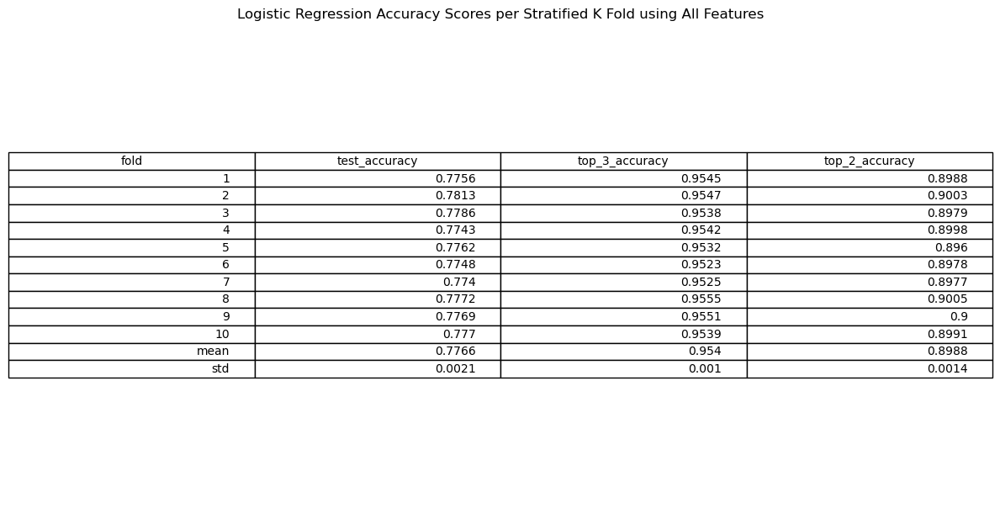

In [28]:
FEATURE_GROUP = "all_features"
INPUT_FILE = f"{FEATURE_GROUP}.csv"
df = pd.read_csv(INPUT_FILE)
df = df[~(df['label'].isin(labels_with_few_samples))].reset_index(drop=True)

for col in df.columns:
    if df[col].dtype == "bool":
        df[col] = df[col].astype(int)

df['registrar'], _ = column_adjustor(df['registrar'])
df['ip_locations'], _ = column_adjustor(df['ip_locations'])
df['label'], _ = column_adjustor(df['label'])
y = df['label'].astype(int)
X = df.drop(columns=['url', 'label', 'ip_address'])
X['tld'] = X['tld'].astype(str).fillna("unknown")
X = X.fillna(-1)

cols_to_categorize = ['tld']
numeric_cols = [col for col in X.columns if col not in cols_to_categorize]
preprocessor = ColumnTransformer(
    transformers = [
        ("numeric", StandardScaler(), numeric_cols),
        ("categorical", OneHotEncoder(drop="first"), cols_to_categorize)
    ]
)

X = preprocessor.fit_transform(X)
numeric_features = preprocessor.transformers_[0][1].get_feature_names_out(numeric_cols).tolist()
categorical_features = preprocessor.transformers_[1][1].get_feature_names_out(cols_to_categorize).tolist()
features = numeric_features + categorical_features

n_splits = 10
skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)
lr = LogisticRegression(max_iter=1000, random_state=42, n_jobs=-1, multi_class="ovr")

scoring_metrics = {'test_accuracy': [], 'top_3_accuracy': [], 'top_2_accuracy': []}
X_tests = []
for fold, (train_index, test_index) in enumerate(skf.split(X, y)):
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = y[train_index], y[test_index]

    lr.fit(X_train, y_train)

    y_pred = lr.predict(X_test)
    scoring_metrics['test_accuracy'].append(accuracy_score(y_test, y_pred))
    all_confusion_matrices[FEATURE_GROUP].append(confusion_matrix(y_test, y_pred))

    y_pred_proba = lr.predict_proba(X_test)
    scoring_metrics['top_3_accuracy'].append(top_k_accuracy_score(y_test, y_pred_proba, k=3))
    scoring_metrics['top_2_accuracy'].append(top_k_accuracy_score(y_test, y_pred_proba, k=2))

    X_tests.append(X_test)

scores_df = pd.DataFrame(scoring_metrics)

mean = scores_df.mean()
scores_df.loc['mean'] = mean
std = scores_df.std()
scores_df.loc['std'] = std
scores_df['fold'] = [str(i + 1) for i in range(n_splits)] + ["mean", "std"]

scores = scores_df[['fold', 'test_accuracy', 'top_3_accuracy', 'top_2_accuracy']].round(4)
fig, ax = plt.subplots(figsize=(12, 6))
ax.axis("off")
ax.axis("tight")
table = ax.table(cellText = scores.values, colLabels = scores.columns, loc="center")
plt.tight_layout()
plt.title("Logistic Regression Accuracy Scores per Stratified K Fold using All Features")
plt.show()
plt.close(fig)

all_accuracy_scores[FEATURE_GROUP] = scores

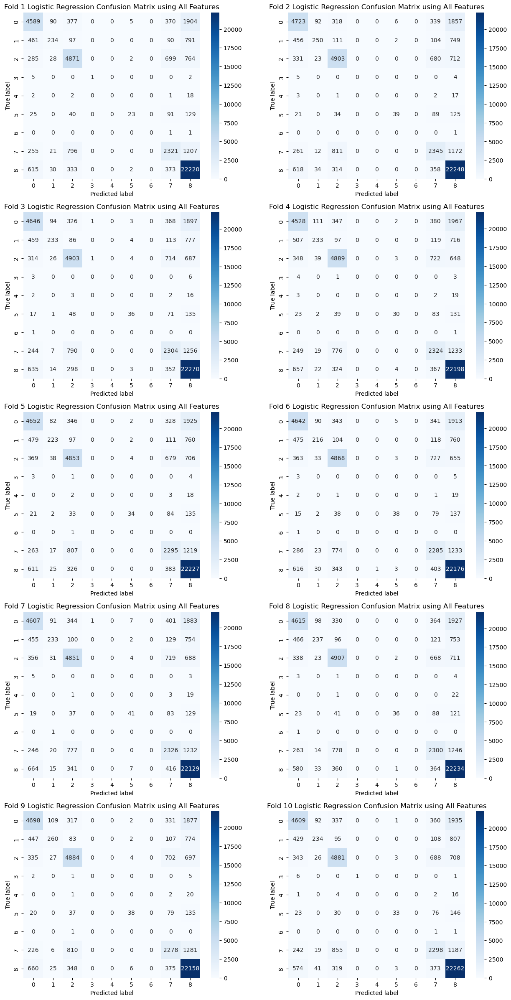

In [29]:
confusion_matrices = all_confusion_matrices[FEATURE_GROUP]
fig, axes = plt.subplots(nrows=len(confusion_matrices) // 2, ncols = 2, figsize = (15, len(confusion_matrices) * 3))

axes = axes.flatten()

for i, cm in enumerate(confusion_matrices):
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=axes[i])
    axes[i].set_title(f"Fold {str(i + 1)} Logistic Regression Confusion Matrix using All Features")
    axes[i].set_xlabel("Predicted label")
    axes[i].set_ylabel("True label")

plt.tight_layout
plt.show()
plt.close(fig)

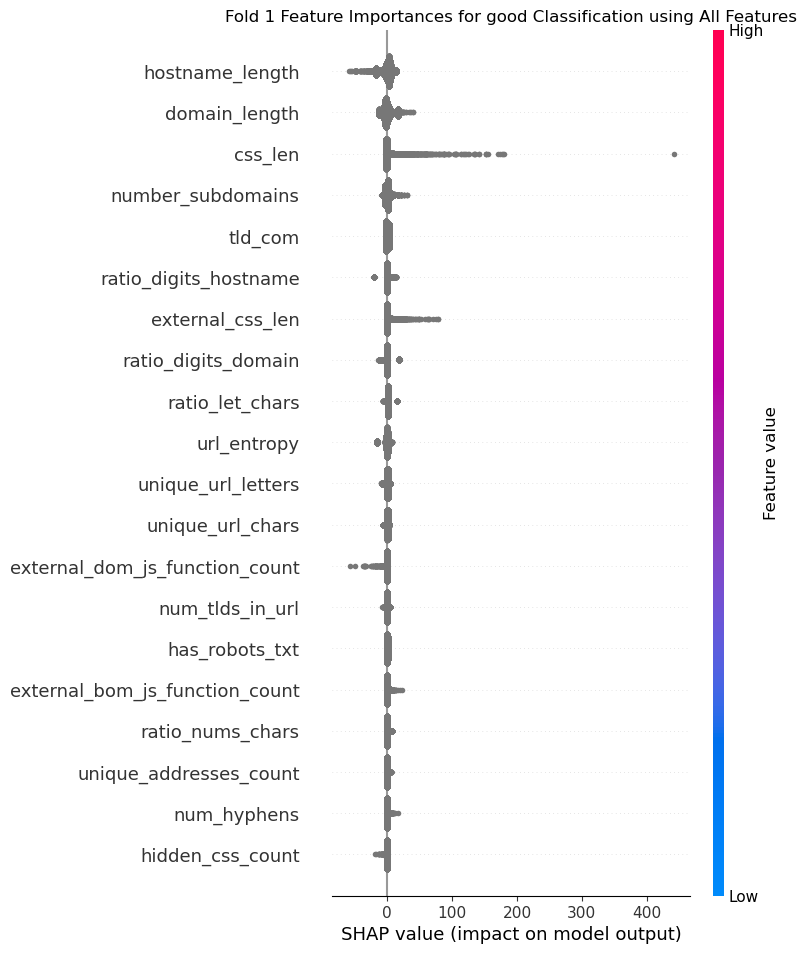

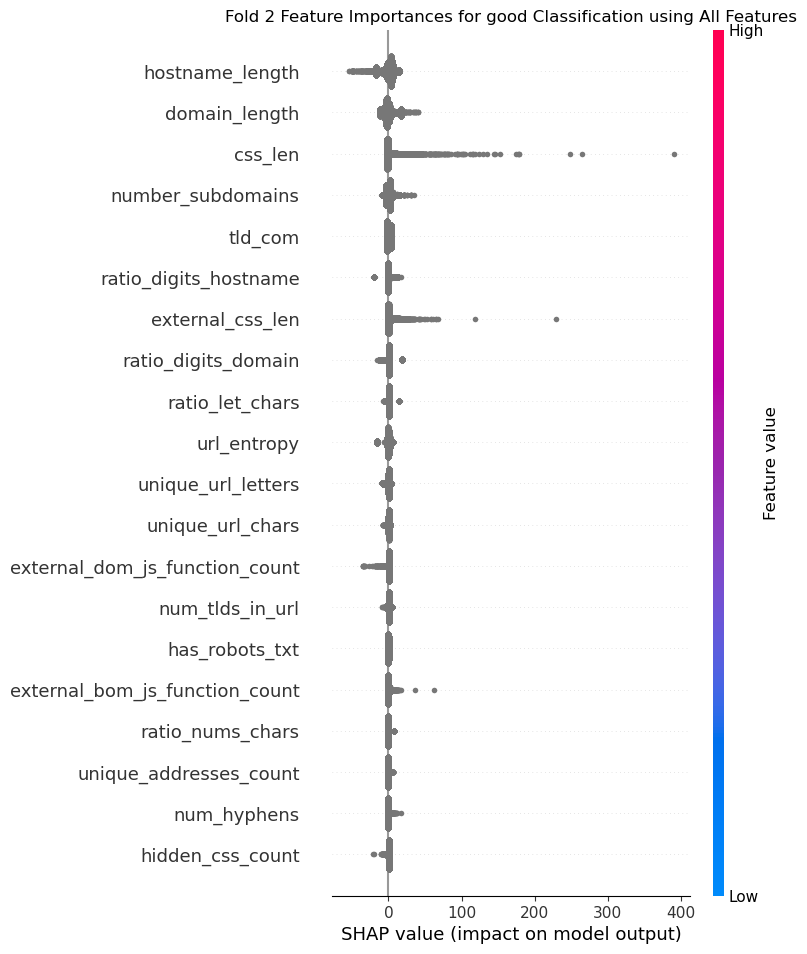

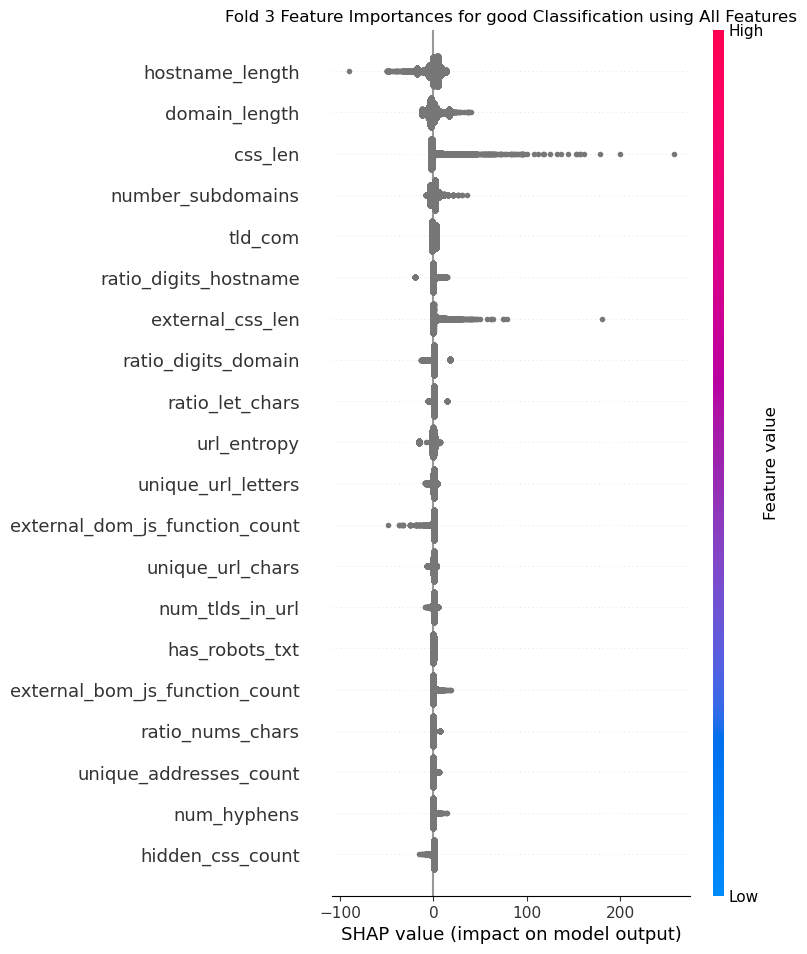

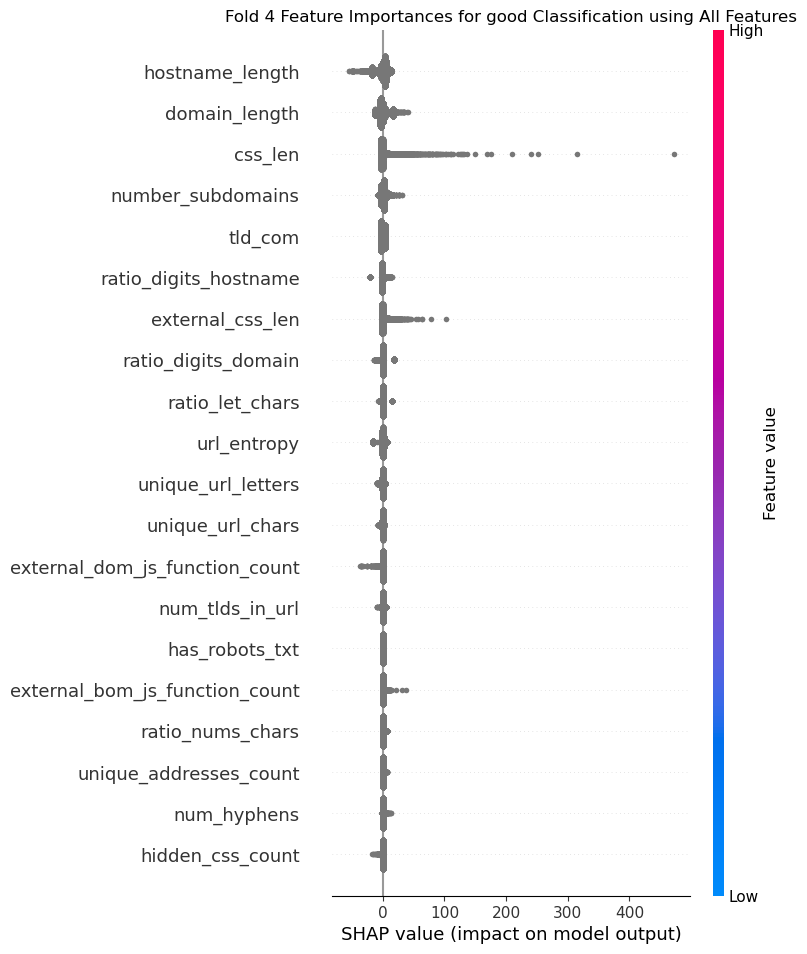

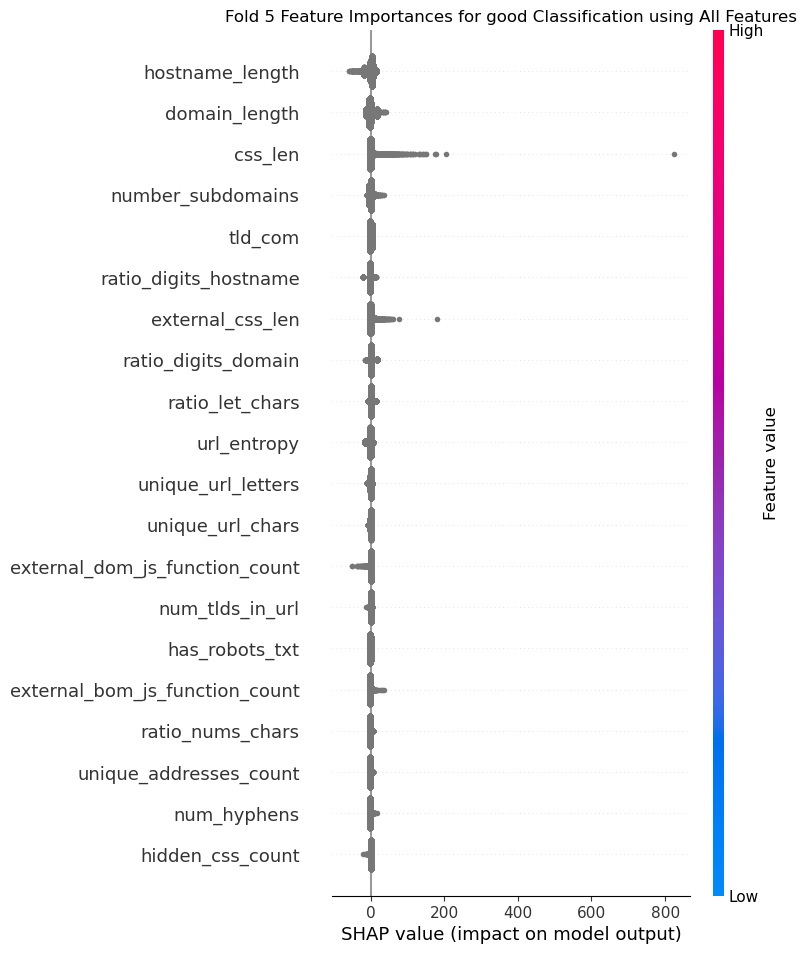

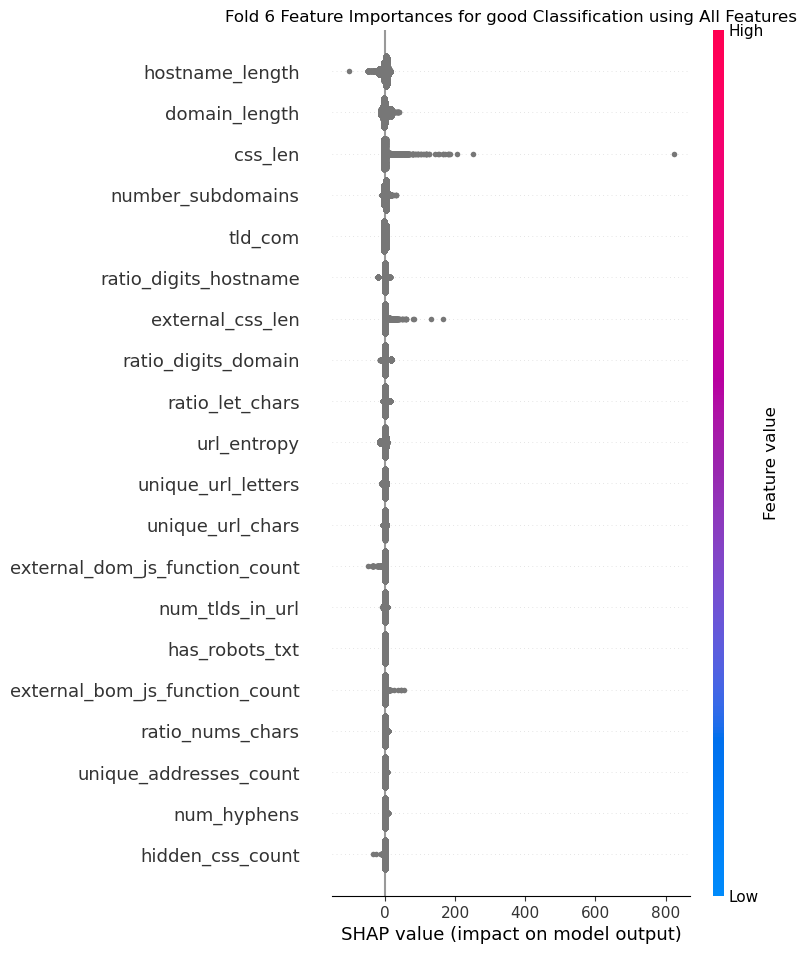

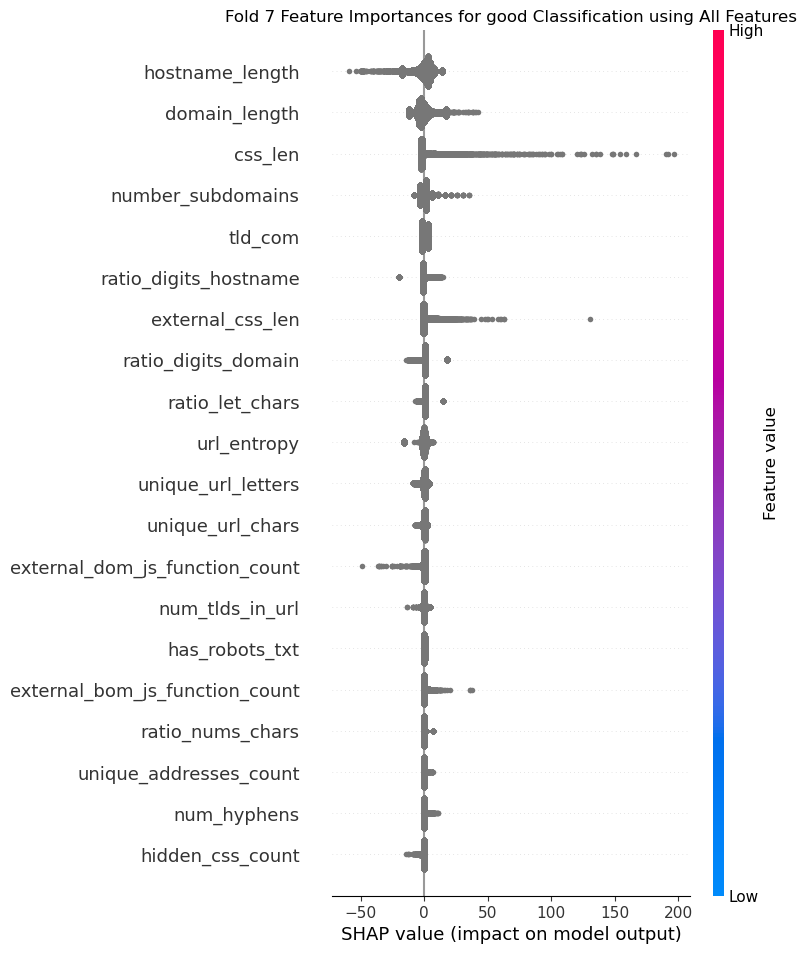

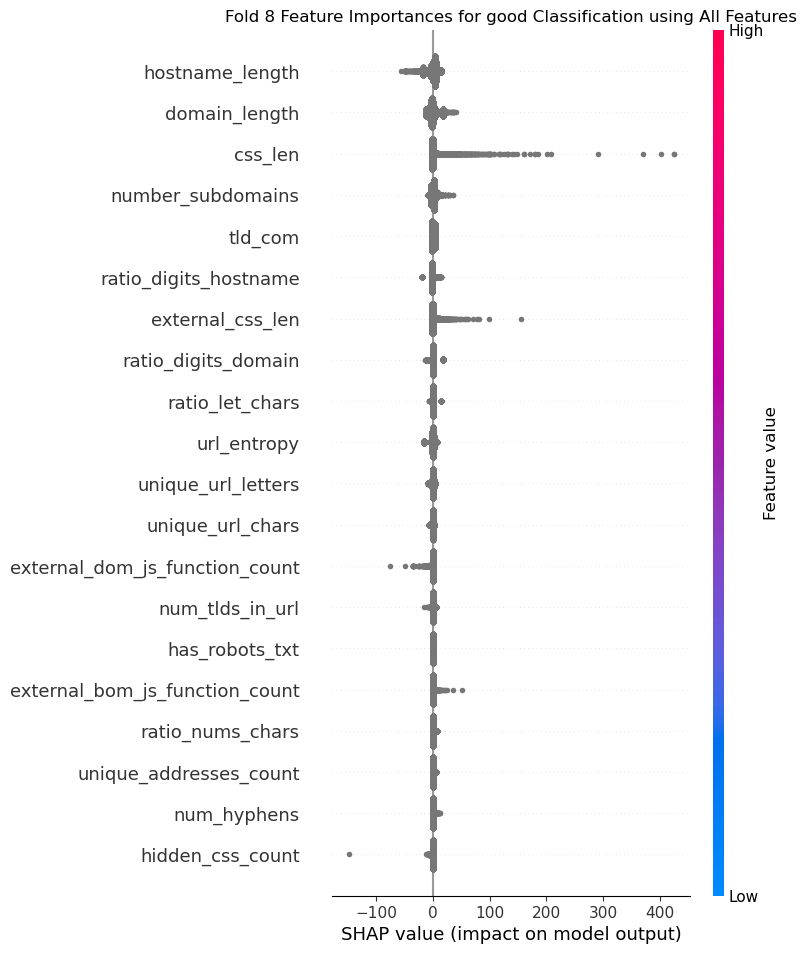

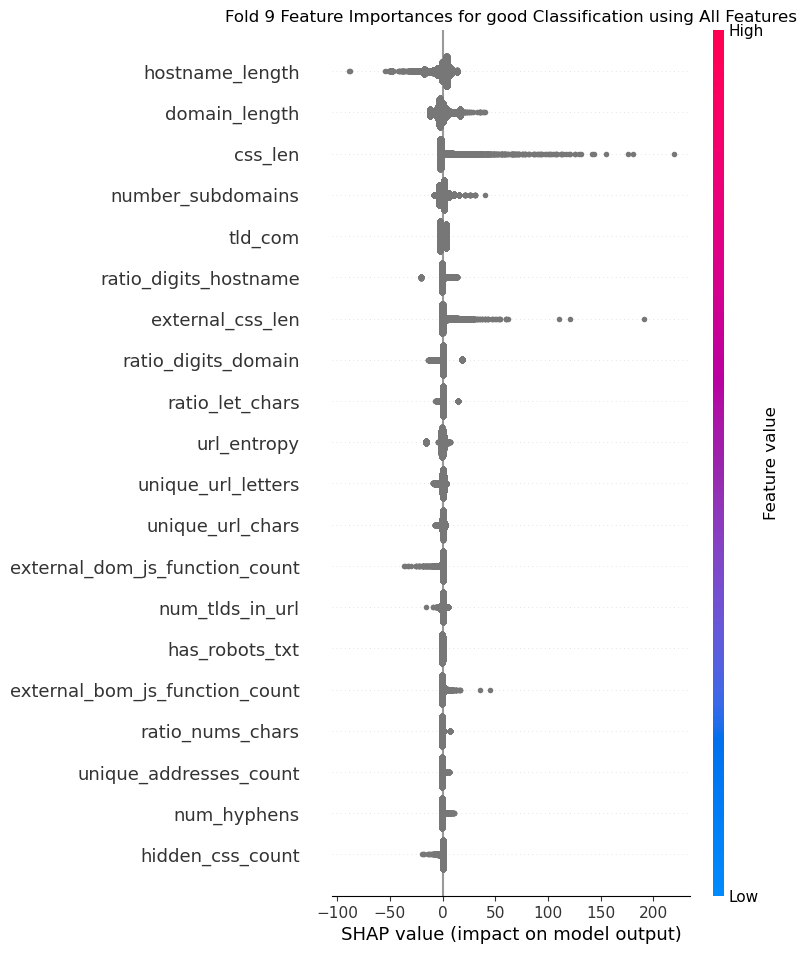

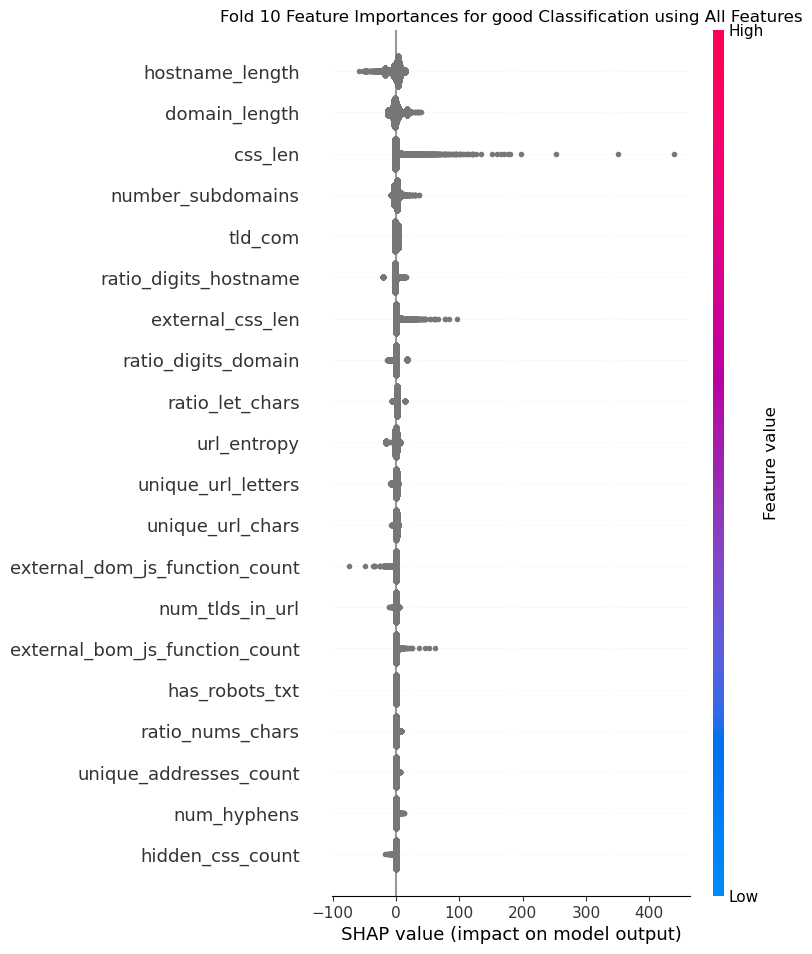

In [30]:
for i, X_test in enumerate(X_tests):
    explainer = shap.Explainer(lr, X_train, feature_names=features)
    shap_values = explainer.shap_values(X_test)
    shap.summary_plot(shap_values[:,:,-1], X_test, feature_names=features, max_display=20, show=False)
    plt.title(f"Fold {str(i + 1)} Feature Importances for good Classification using All Features")
    plt.show()
    
    all_shap_values[FEATURE_GROUP].append((i + 1, shap_values, X_test))

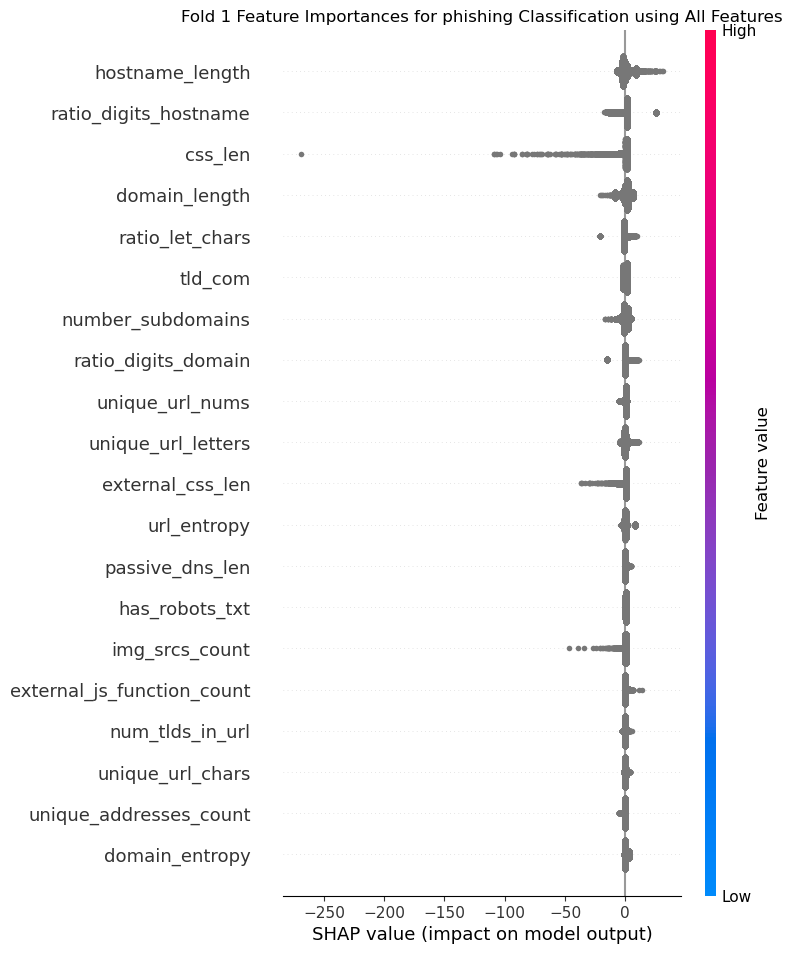

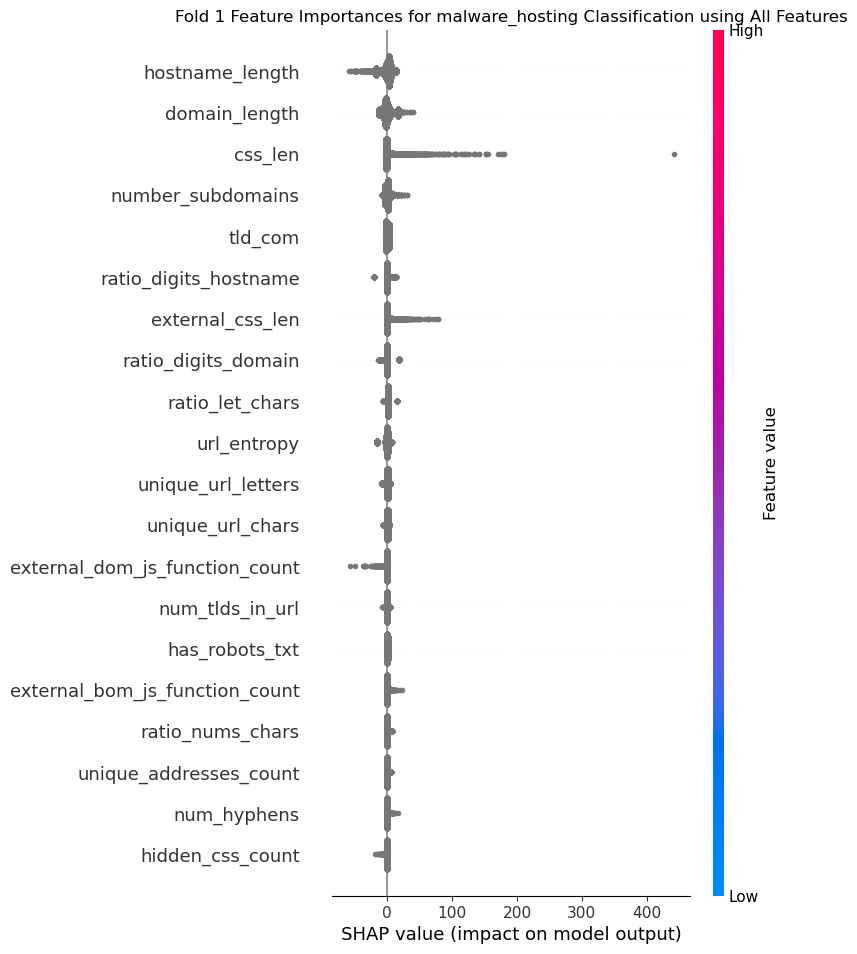

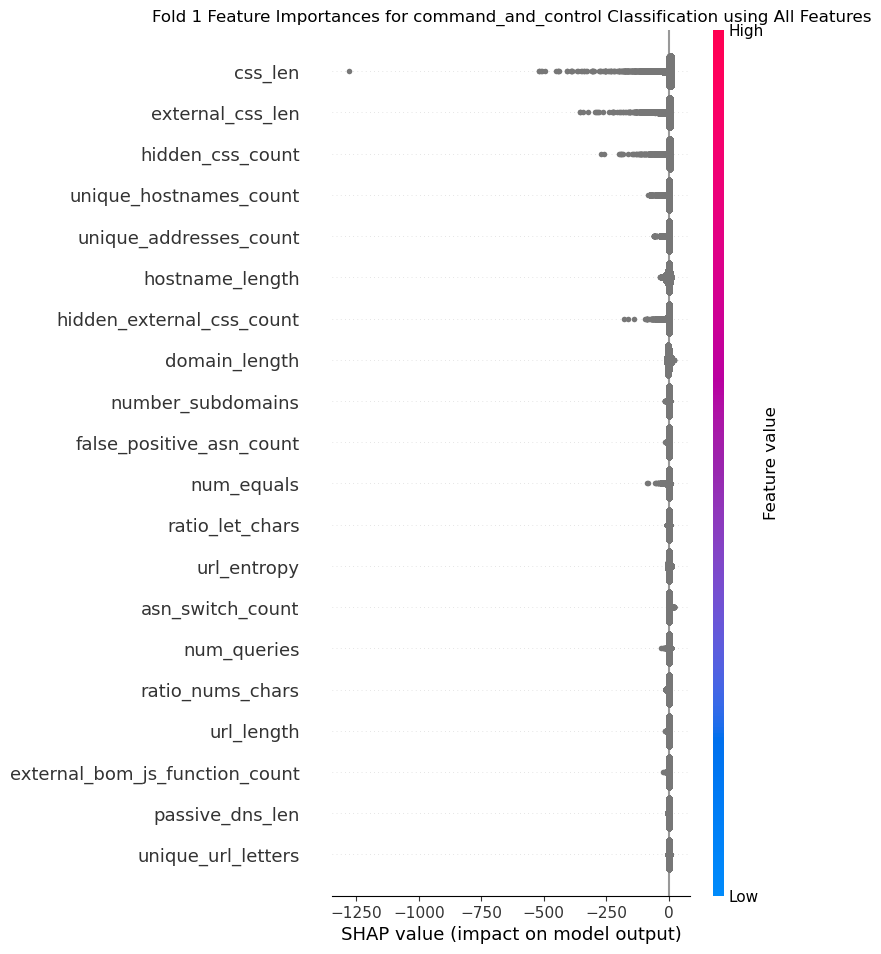

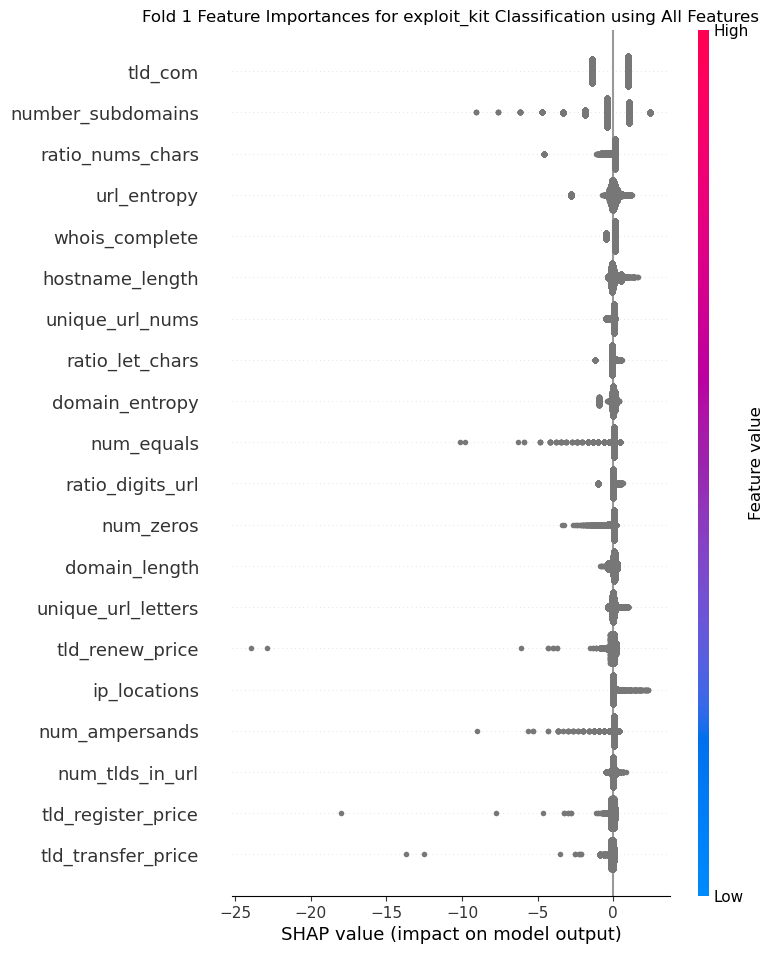

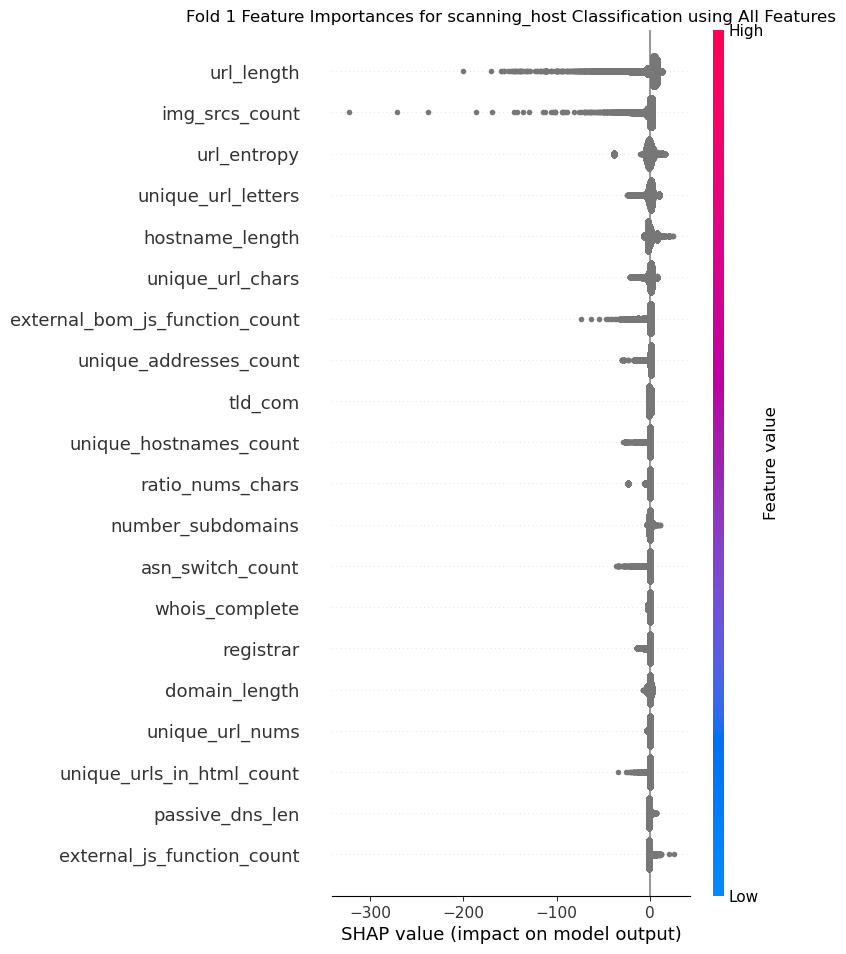

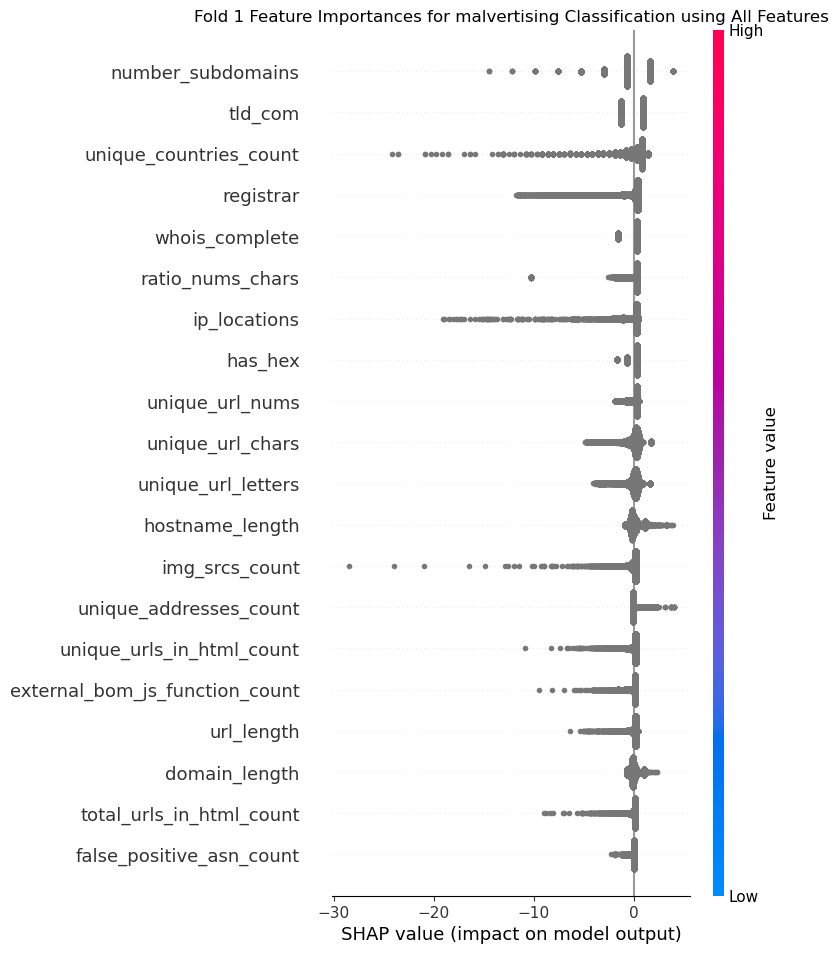

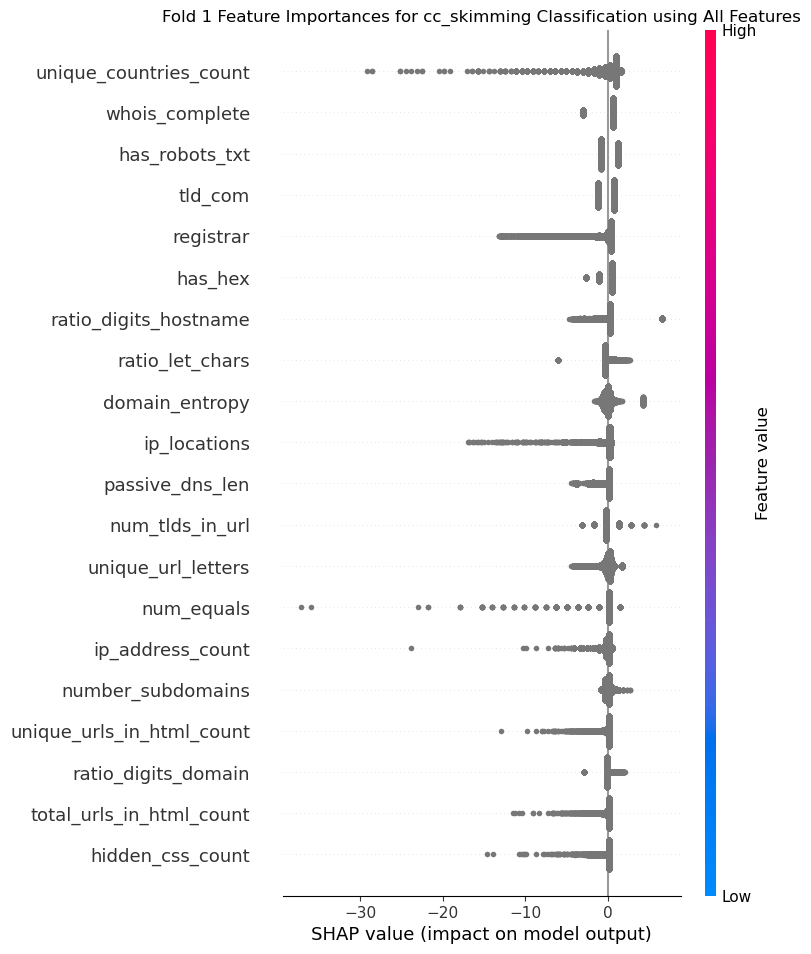

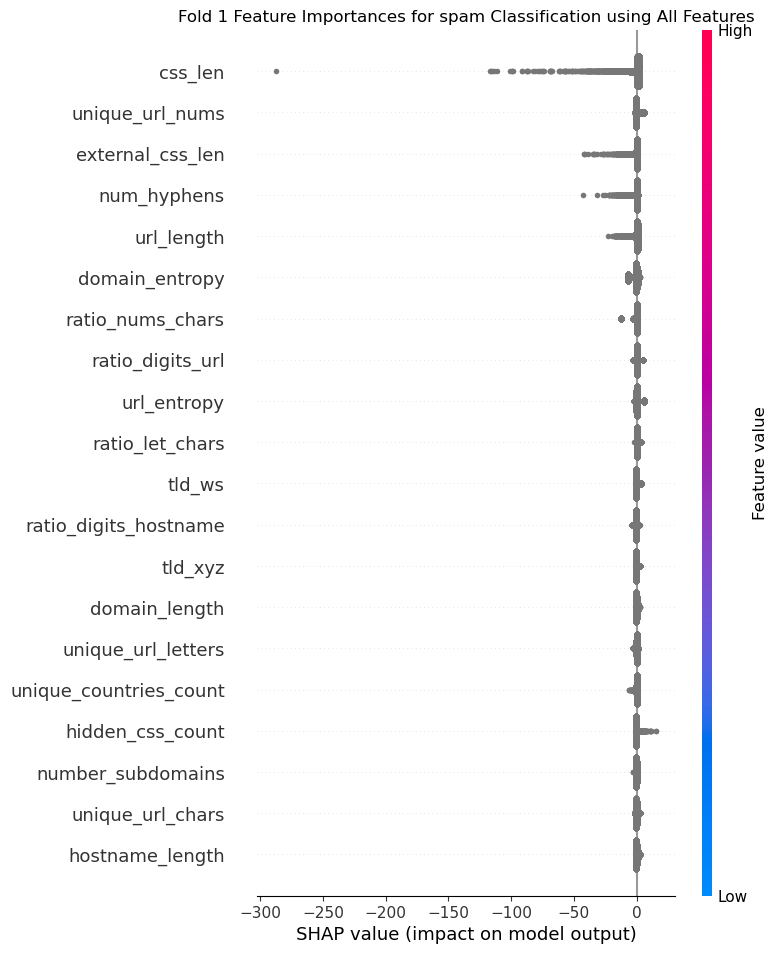

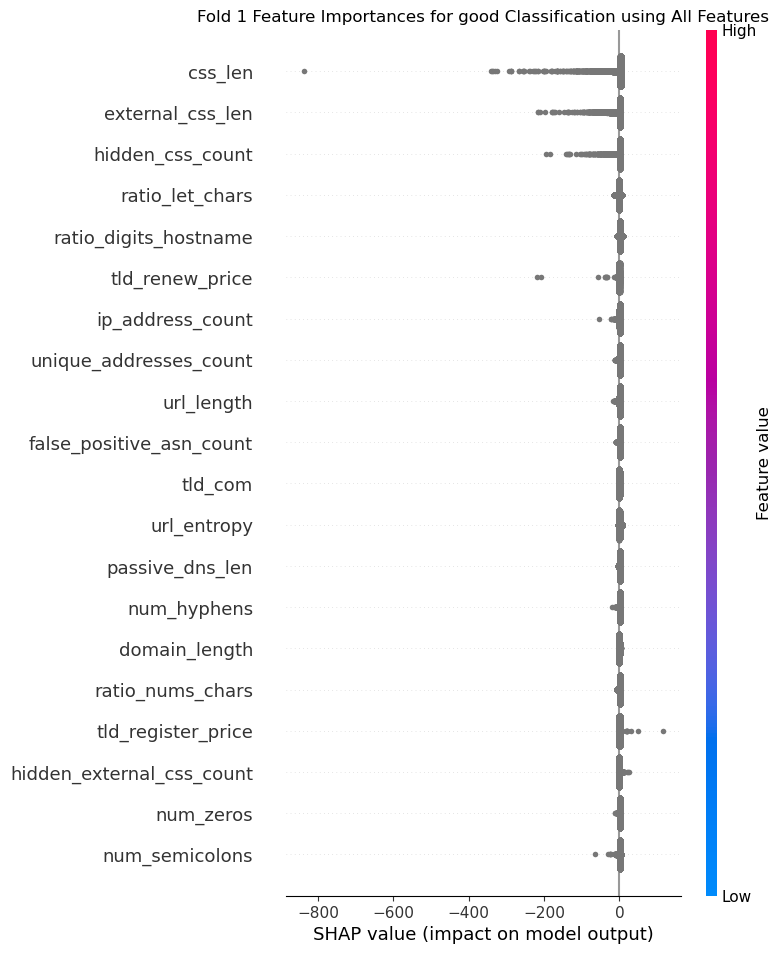

In [31]:
fold, shap_values, X_test = all_shap_values[FEATURE_GROUP][0]
for i, label in enumerate(labels):
    shap.summary_plot(shap_values[:,:,-i], X_test, feature_names=features, max_display=20, show=False)
    plt.title(f"Fold 1 Feature Importances for {label} Classification using All Features")
    plt.show()

## Accuracy Scores

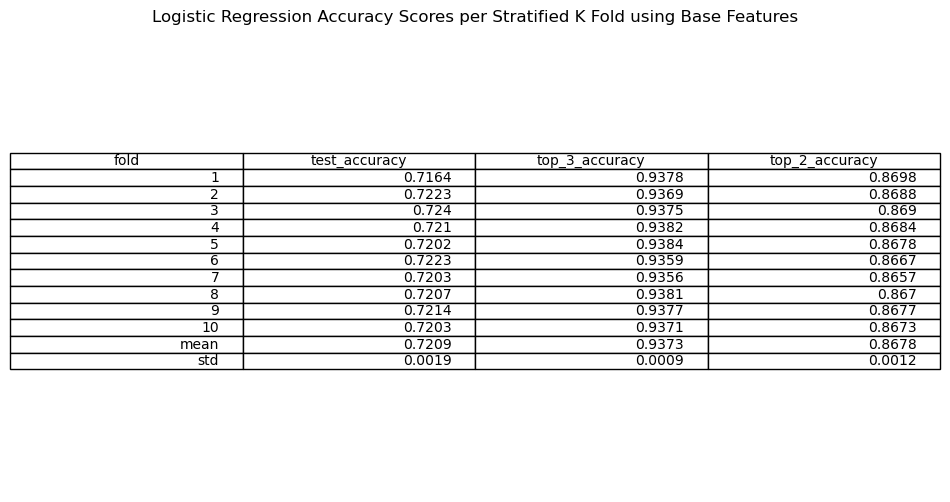

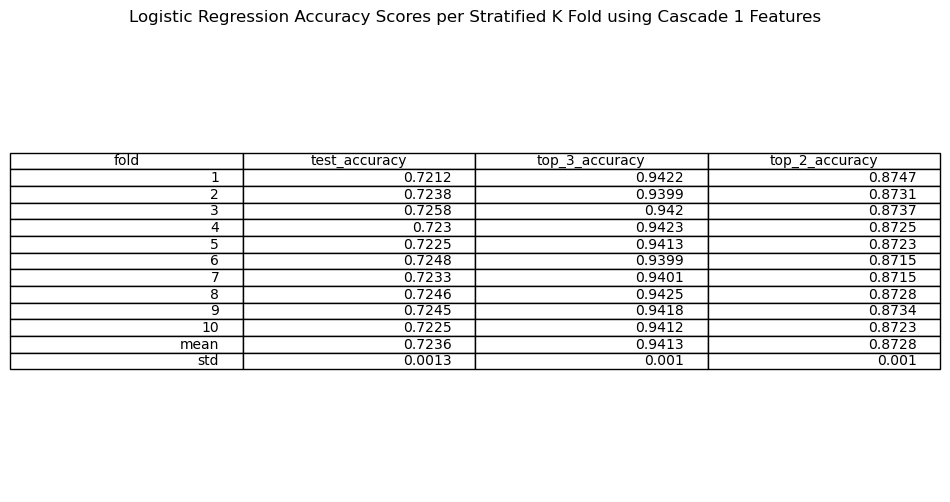

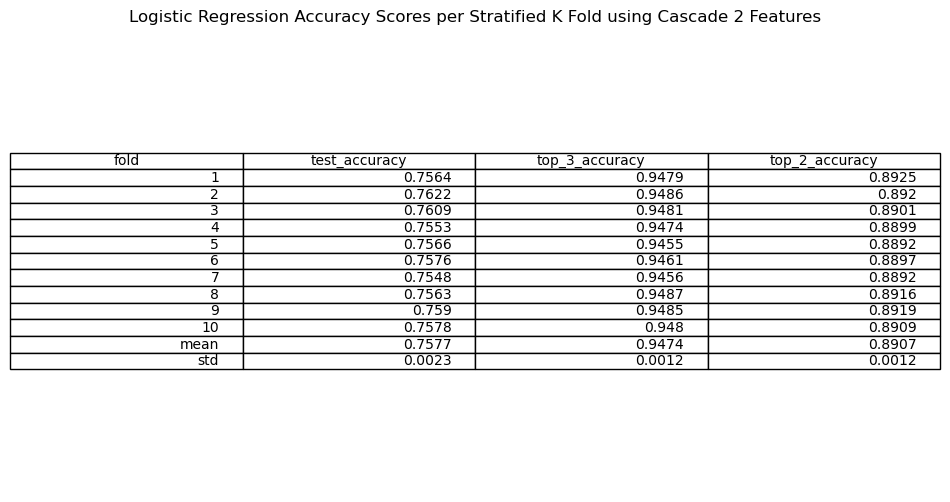

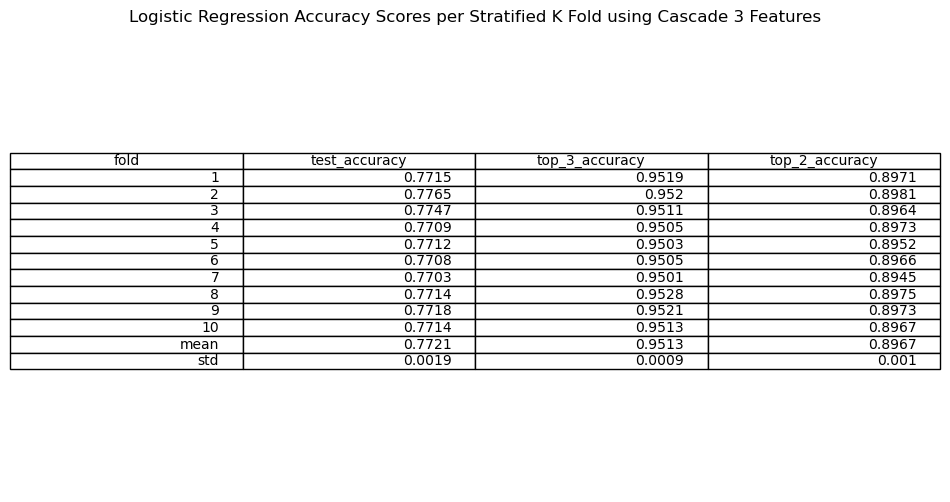

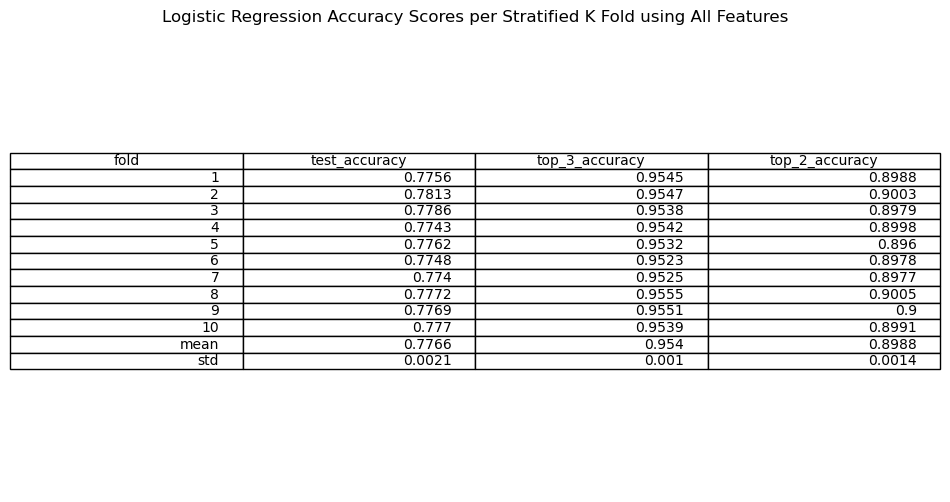

In [32]:
# Base
scores = all_accuracy_scores["base_features"]
fig, ax = plt.subplots(figsize=(12, 6))
ax.axis("off")
ax.axis("tight")
table = ax.table(cellText = scores.values, colLabels = scores.columns, loc="center")
plt.tight_layout
plt.title("Logistic Regression Accuracy Scores per Stratified K Fold using Base Features")
plt.show()
plt.close(fig)

# Cascade 1
scores = all_accuracy_scores["cascade_1"]
fig, ax = plt.subplots(figsize=(12, 6))
ax.axis("off")
ax.axis("tight")
table = ax.table(cellText = scores.values, colLabels = scores.columns, loc="center")
plt.tight_layout
plt.title("Logistic Regression Accuracy Scores per Stratified K Fold using Cascade 1 Features")
plt.show()
plt.close(fig)

# Cascade 2
scores = all_accuracy_scores["cascade_2"]
fig, ax = plt.subplots(figsize=(12, 6))
ax.axis("off")
ax.axis("tight")
table = ax.table(cellText = scores.values, colLabels = scores.columns, loc="center")
plt.tight_layout
plt.title("Logistic Regression Accuracy Scores per Stratified K Fold using Cascade 2 Features")
plt.show()
plt.close(fig)

# Cascade 3
scores = all_accuracy_scores["cascade_3"]
fig, ax = plt.subplots(figsize=(12, 6))
ax.axis("off")
ax.axis("tight")
table = ax.table(cellText = scores.values, colLabels = scores.columns, loc="center")
plt.tight_layout
plt.title("Logistic Regression Accuracy Scores per Stratified K Fold using Cascade 3 Features")
plt.show()
plt.close(fig)

# All Features
scores = all_accuracy_scores["all_features"]
fig, ax = plt.subplots(figsize=(12, 6))
ax.axis("off")
ax.axis("tight")
table = ax.table(cellText = scores.values, colLabels = scores.columns, loc="center")
plt.tight_layout
plt.title("Logistic Regression Accuracy Scores per Stratified K Fold using All Features")
plt.show()
plt.close(fig)

## Confusion Matrices

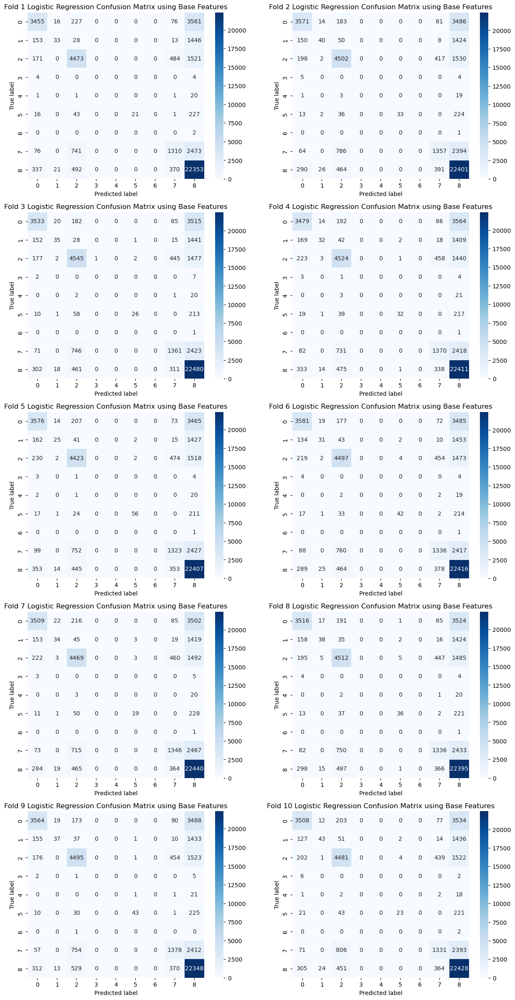

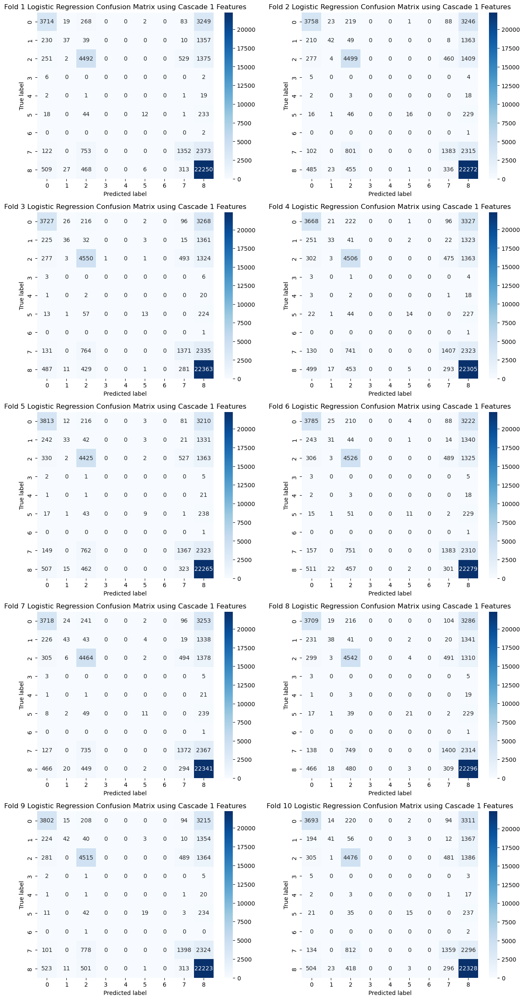

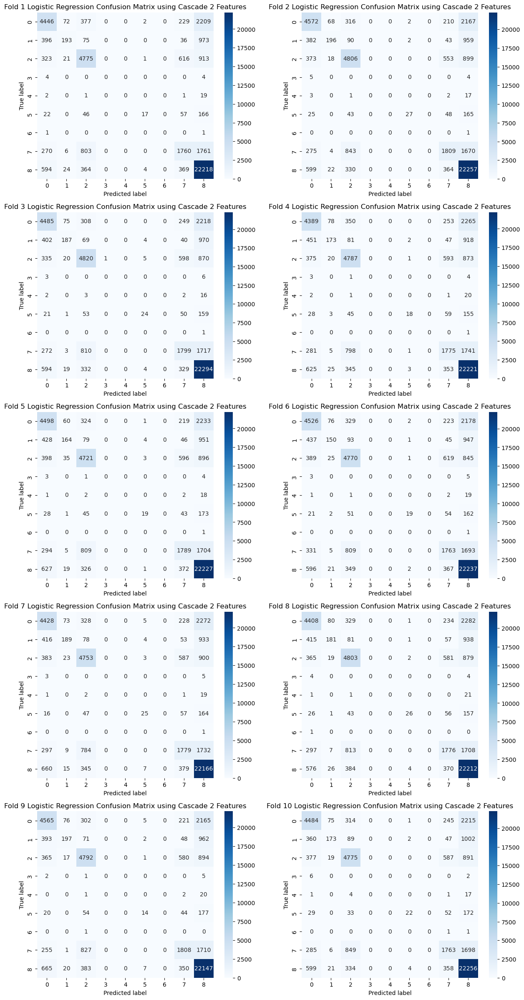

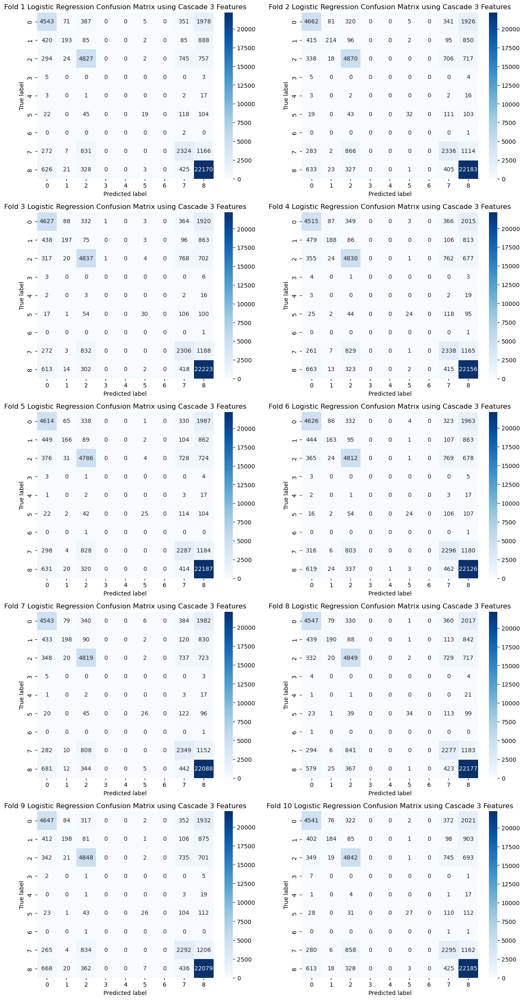

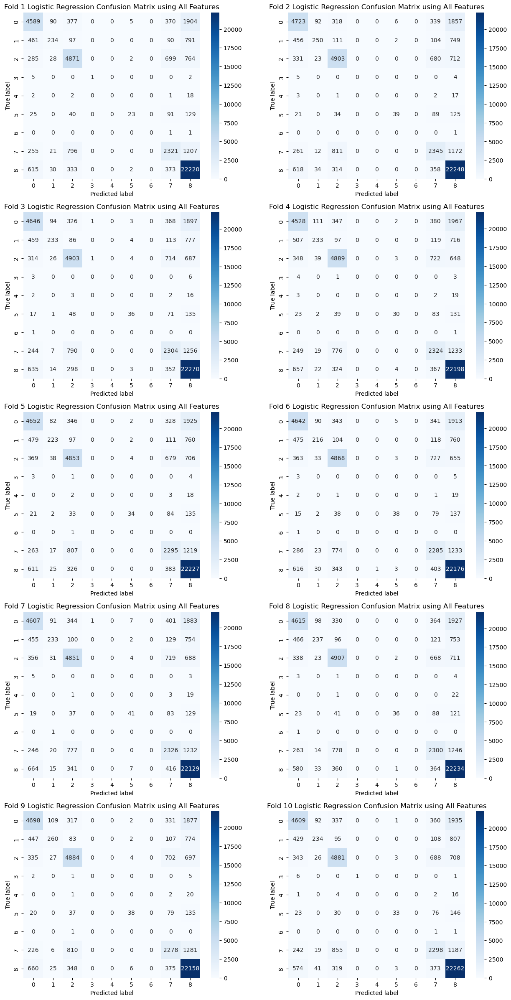

In [33]:
# Base
confusion_matrices = all_confusion_matrices["base_features"]
fig, axes = plt.subplots(nrows=len(confusion_matrices) // 2, ncols = 2, figsize = (15, len(confusion_matrices) * 3))

axes = axes.flatten()

for i, cm in enumerate(confusion_matrices):
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=axes[i])
    axes[i].set_title(f"Fold {str(i + 1)} Logistic Regression Confusion Matrix using Base Features")
    axes[i].set_xlabel("Predicted label")
    axes[i].set_ylabel("True label")

plt.tight_layout
plt.show()
plt.close(fig)

# Cascade 1
confusion_matrices = all_confusion_matrices["cascade_1"]
fig, axes = plt.subplots(nrows=len(confusion_matrices) // 2, ncols = 2, figsize = (15, len(confusion_matrices) * 3))

axes = axes.flatten()

for i, cm in enumerate(confusion_matrices):
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=axes[i])
    axes[i].set_title(f"Fold {str(i + 1)} Logistic Regression Confusion Matrix using Cascade 1 Features")
    axes[i].set_xlabel("Predicted label")
    axes[i].set_ylabel("True label")

plt.tight_layout
plt.show()
plt.close(fig)

# Cascade 2
confusion_matrices = all_confusion_matrices["cascade_2"]
fig, axes = plt.subplots(nrows=len(confusion_matrices) // 2, ncols = 2, figsize = (15, len(confusion_matrices) * 3))

axes = axes.flatten()

for i, cm in enumerate(confusion_matrices):
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=axes[i])
    axes[i].set_title(f"Fold {str(i + 1)} Logistic Regression Confusion Matrix using Cascade 2 Features")
    axes[i].set_xlabel("Predicted label")
    axes[i].set_ylabel("True label")

plt.tight_layout
plt.show()
plt.close(fig)

# Cascade 3
confusion_matrices = all_confusion_matrices["cascade_3"]
fig, axes = plt.subplots(nrows=len(confusion_matrices) // 2, ncols = 2, figsize = (15, len(confusion_matrices) * 3))

axes = axes.flatten()

for i, cm in enumerate(confusion_matrices):
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=axes[i])
    axes[i].set_title(f"Fold {str(i + 1)} Logistic Regression Confusion Matrix using Cascade 3 Features")
    axes[i].set_xlabel("Predicted label")
    axes[i].set_ylabel("True label")

plt.tight_layout
plt.show()
plt.close(fig)

# All Features
confusion_matrices = all_confusion_matrices["all_features"]
fig, axes = plt.subplots(nrows=len(confusion_matrices) // 2, ncols = 2, figsize = (15, len(confusion_matrices) * 3))

axes = axes.flatten()

for i, cm in enumerate(confusion_matrices):
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=axes[i])
    axes[i].set_title(f"Fold {str(i + 1)} Logistic Regression Confusion Matrix using All Features")
    axes[i].set_xlabel("Predicted label")
    axes[i].set_ylabel("True label")

plt.tight_layout
plt.show()
plt.close(fig)

## Feature Importances

In [35]:
# Base Features
NUM_FOLDS = 10
for i in range(NUM_FOLDS):
    fold, shap_values, X_test = all_shap_values['base_features'][i]
    for j, label in enumerate(labels):
        fig, axes = plt.subplots()
        shap.summary_plot(shap_values[:,:,j], X_test, feature_names=features, max_display=20, show=False)
        plt.title(f"Fold {str(fold)} Feature Importances for {label} Classification using Base Features")
        plt.savefig(f"figures/logistic_regression/base_features/Fold {str(fold)} Feature Importances for {label} Classification using Base Features")
        plt.close(fig)

In [ ]:
# Cascade 1
NUM_FOLDS = 10
for i in range(NUM_FOLDS):
    fold, shap_values, X_test = all_shap_values['cascade_1'][i]
    for j, label in enumerate(labels):
        fig, axes = plt.subplots()
        shap.summary_plot(shap_values[:,:,j], X_test, feature_names=features, max_display=20, show=False)
        plt.title(f"Fold {str(fold)} Feature Importances for {label} Classification using Cascade 1 Features")
        plt.savefig(f"figures/logistic_regression/cascade_1/Fold {str(fold)} Feature Importances for {label} Classification using Cascade 1 Features")
        plt.close(fig)

In [ ]:
# Cascade 2
NUM_FOLDS = 10
for i in range(NUM_FOLDS):
    fold, shap_values, X_test = all_shap_values['cascade_2'][i]
    for j, label in enumerate(labels):
        fig, axes = plt.subplots()
        shap.summary_plot(shap_values[:,:,j], X_test, feature_names=features, max_display=20, show=False)
        plt.title(f"Fold {str(fold)} Feature Importances for {label} Classification using Cascade 2 Features")
        plt.savefig(f"figures/logistic_regression/cascade_2/Fold {str(fold)} Feature Importances for {label} Classification using Cascade 2 Features")
        plt.close(fig)

In [ ]:
# Cascade 3
NUM_FOLDS = 10
for i in range(NUM_FOLDS):
    fold, shap_values, X_test = all_shap_values['cascade_3'][i]
    for j, label in enumerate(labels):
        fig, axes = plt.subplots()
        shap.summary_plot(shap_values[:,:,j], X_test, feature_names=features, max_display=20, show=False)
        plt.title(f"Fold {str(fold)} Feature Importances for {label} Classification using Cascade 3 Features")
        plt.savefig(f"figures/logistic_regression/cascade_3/Fold {str(fold)} Feature Importances for {label} Classification using Cascade 3 Features")
        plt.close(fig)

In [ ]:
# All Features
NUM_FOLDS = 10
for i in range(NUM_FOLDS):
    fold, shap_values, X_test = all_shap_values['all_features'][i]
    for j, label in enumerate(labels):
        fig, axes = plt.subplots()
        shap.summary_plot(shap_values[:,:,j], X_test, feature_names=features, max_display=20, show=False)
        plt.title(f"Fold {str(fold)} Feature Importances for {label} Classification using All Features")
        plt.savefig(f"figures/logistic_regression/all_features/Fold {str(fold)} Feature Importances for {label} Classification using All Features")
        plt.close(fig)